# Internet user experience KPIs impact in Colombia due to COVID-19 related traffic surge, and prioritization recommendation for infrastructure incentive deployment in critical municipalities

# Introduction
I recently decided to pursue the Imperial Business Analytics programme by Executive Education at Imperial College Business School. I had to make a final project as part of the programme, and I decided to make my final project about a topic that pasions me: Telecommunications and internet experience. COVID-19 has created unprecedent challenges for data networks: Just as in many other countries, the Colombian government imposed a strict lockdown as a response to COVID-19 emergency. In a very short time, and without preparation, Colombian society had to adapt so that a significant part of the economy and the society can still function without leaving home. This adaptation was required an accelerated adoption of digital tools:

Many companies have been forced to adapt so that their employees can work from home.
Schools have been forced to close and offer remote learning
There was an unprecedent surge in streaming and internet-based entertainment services
Adoption of digital and remote tools have resulted in an unprecedent increase in data traffic that was not foreseen. Networks became more critical than ever so that society could function at least to some degree.

Network operators have been forced to cope with such traffic spike without proper preparation. Capacity expansion processes were normally run in yearly cycles using previous 12-month window traffic as an input to predict near-term needs. Many people believe that operators enjoyed a boost in revenue and profits because of the increase in traffic, as experienced by Internet based companies such as Amazon or Zoom. However, operators’ public results have shown the opposite: Their revenue and cash-in has been reduced because of an increase in lack of payment, overdues, and cancellations. Financial deterioration further constrained operators’ capacities to expand their networks to match traffic increase.

My project performed an analysis in Colombia (my home country) to understand if such traffic increase has resulted in deterioration of user experience, and identify municipalities that have suffered the most so that public policy can be adapted to support investments in network infrastructure for such municipalities.



# Objective
My project performed an assessment on how unexpected surge due to COVID-19 has impacted internet experience KPIs (average downlink speed, average uplink speed, latency) in all municipalities in Colombia compared to pre-COVID-19 scenario. The assessment analyzed the time series of aggregated traffic in Colombia to confirm the historical raise of traffic, assessed the impact of such surge possibly because of network saturation, classified municipalities based on how severe the impact on user experience was, and forecasted possible traffic trends after the economy re-opened. Results could be used by public policy makers to better define where incentives for network infrastructure investments should be prioritized, and which technologies should be incentivized.

# Tools

Anaconda was the tool used during most of the Imperial Analytics Programme. I tried to run the necessary transformations to the dataset using Anaconda and using my local machine. After several memory crashes I realized that I would required a cloud platform. I had previously experienced with **IBM Cloud** when I pursued my IBM Data Science Certification: IBM Cloud is a practical, intuitive platform that is easy to use even for quickstarters. The free account version allows to setup a free account with an environment that allows up to 50 monthly capacity units per hour, a 4vCPU + 16GB RAM environment utilizes 2 capacity units per hour. However, I estimated that I would require something higher than 16GB of RAM to run my code, therefore I decided to experience with a different platform that I have been using in the my current job: I decided to try **Google Cloud Platform**. GCP allows any user to setup and account and start a 90 days trial and a 300 USD trial. It is very simple to setup an standard instance with 4vCPU and 32GB of RAM, which was sufficient computing power for my project.

# Sources of Data
I was amazed to know the amount of public data that was available for my project. I was surprised to see that ookla speedtest has made available to the public the dataset containing aggregated and anonimized geo-referenced data on downlink speed, ulplink speed and latency. I was also happy to see that Colombian's government initiative to consolidate a repository of public data "datos.gov.co" has advanced and now includes many datasets from the Ministry of Telecommunications. I identified that these sources of data, which are completely public and available to anyone, would be sufficient to perform my analysis as originally envisioned. I specifically included the following sources of data:

- Ookla speedtest open source data (http://ookla-open-data.s3.amazonaws.com/). Including 6 datasets in SHP format:
    - Fixed data for Q1, Q2 and Q3 2020
    - Mobile data for Q1, Q2 and Q3 2020
- Colombia's municipality geograhic limits from Colombia's National Estatistics Administrative Department (DANE - https://geoportal.dane.gov.co/servicios/descarga-y-metadatos/descarga-mgn-marco-geoestadistico-nacional/)
- Colombia's Minitic telecommunications dataset (https://www.datos.gov.co/Ciencia-Tecnolog-a-e-Innovaci-n/)
    - Colombia Daily Aggregated Internet Traffic per operator
    - Colombia Fixed Internet Accesses by municipality and type of technology
    - Fixed internet access penetration by municipality

# Coding

## Import Libraries

In [1]:
import os
import matplotlib.pyplot as plt
import geopandas as gpd
import earthpy as et
import geoplot as gpl
import shapefile as shp
import mapclassify as mpclas
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
from sklearn import svm

## 1. Import Datasets sources
### Ookla Speedtest Dataset

In [2]:
# Speed test fixed Q1 dataset:
st_fixed_q1 = gpd.read_file('gs://imperial_analytics_project/sources/1_speed_test_titles/fixed_q1_20/gps_fixed_tiles.shp')
print("Speed test fixed Q1 data loaded Shape:", st_fixed_q1.shape)
display(st_fixed_q1.head())
# Speed test fixed Q2 dataset:
st_fixed_q2 = gpd.read_file('gs://imperial_analytics_project/sources/1_speed_test_titles/fixed_q2_20/gps_fixed_tiles.shp')
print("Speed test fixed Q2 data loaded Shape:", st_fixed_q2.shape)
display(st_fixed_q2.head())
# Speed test fixed Q3 dataset:
st_fixed_q3 = gpd.read_file('gs://imperial_analytics_project/sources/1_speed_test_titles/fixed_q3_20/gps_fixed_tiles.shp')
print("Speed test fixed Q3 data loaded Shape:", st_fixed_q3.shape)
display(st_fixed_q3.head())

Speed test fixed Q1 data loaded Shape: (6688699, 7)


,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,geometry
0,3100121113233332,16599,13312,70,37,27,"POLYGON ((106.68823 -6.30984, 106.69373 -6.309..."
1,3112231300122103,42461,13516,19,171,53,"POLYGON ((145.04700 -37.82714, 145.05249 -37.8..."
2,0331102110022021,25765,15185,16,228,100,"POLYGON ((-9.13513 38.71123, -9.12964 38.71123..."
3,1202020213110310,79703,15579,18,199,32,"POLYGON ((1.35132 51.38550, 1.35681 51.38550, ..."
4,1231210133132220,27032,24622,23,174,55,"POLYGON ((75.84961 30.91165, 75.85510 30.91165..."


Speed test fixed Q2 data loaded Shape: (6938763, 7)


,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,geometry
0,1321222233020202,144116,125751,3,7330,1324,"POLYGON ((113.55469 22.16197, 113.56018 22.161..."
1,1230231303303002,89763,52939,42,726,137,"POLYGON ((55.41504 25.27947, 55.42053 25.27947..."
2,0313131210131030,62657,15479,19,271,40,"POLYGON ((-1.79077 51.55658, -1.78528 51.55658..."
3,0213330110110321,98061,11842,19,2,1,"POLYGON ((-93.22449 45.06576, -93.21899 45.065..."
4,3100130032202231,15167,7287,8,674,122,"POLYGON ((107.59460 -6.91552, 107.60010 -6.915..."


Speed test fixed Q3 data loaded Shape: (6870766, 7)


,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,geometry
0,1233013313200301,43426,44856,4,915,163,"POLYGON ((78.42590 17.45547, 78.43140 17.45547..."
1,0302231031021131,34684,1667,602,2,1,"POLYGON ((-80.42542 44.52001, -80.41992 44.520..."
2,0302322122312111,78753,33569,13,3,2,"POLYGON ((-77.04163 42.13082, -77.03613 42.130..."
3,0231121211030100,397666,290737,7,21,8,"POLYGON ((-97.27295 35.38905, -97.26746 35.389..."
4,2103213003001301,81641,42419,9,57,11,"POLYGON ((-58.63953 -34.61513, -58.63403 -34.6..."


In [3]:
# Speed test mobile Q1 dataset:
st_mob_q1 = gpd.read_file('gs://imperial_analytics_project/sources/1_speed_test_titles/mobile_q1_20/gps_mobile_tiles.shp')
print("Speed test mobile Q1 data loaded Shape:", st_mob_q1.shape)
display(st_mob_q1.head())
# Speed test mobile Q2 dataset:
st_mob_q2 = gpd.read_file('gs://imperial_analytics_project/sources/1_speed_test_titles/mobile_q2_20/gps_mobile_tiles.shp')
print("Speed test mobile Q2 data loaded Shape:", st_mob_q2.shape)
display(st_mob_q2.head())
# Speed test mobile Q3 dataset:
st_mob_q3 = gpd.read_file('gs://imperial_analytics_project/sources/1_speed_test_titles/mobile_q3_20/gps_mobile_tiles.shp')
print("Speed test mobile Q3 data loaded Shape:", st_mob_q3.shape)
display(st_mob_q3.head())

Speed test mobile Q1 data loaded Shape: (3903132, 7)


,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,geometry
0,1231213033100333,14457,3022,30,82,44,"POLYGON ((77.20642 28.57970, 77.21191 28.57970..."
1,1233010212222232,10042,4567,48,69,38,"POLYGON ((73.83911 19.97851, 73.84460 19.97851..."
2,1231213033101212,8592,2566,40,117,63,"POLYGON ((77.22290 28.58935, 77.22839 28.58935..."
3,1322013333311132,23863,18425,26,31,15,"POLYGON ((101.23901 16.78876, 101.24451 16.788..."
4,3100121113312313,15880,9819,27,546,269,"POLYGON ((106.82556 -6.21155, 106.83105 -6.211..."


Speed test mobile Q2 data loaded Shape: (4075861, 7)


,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,geometry
0,1203022122320032,28772,3165,34,8,1,"POLYGON ((24.09302 49.88402, 24.09851 49.88402..."
1,0313113213321131,20782,10180,54,2,2,"POLYGON ((-1.49963 52.95526, -1.49414 52.95526..."
2,1221210331312333,22690,22416,449,6,2,"POLYGON ((30.88806 29.92161, 30.89355 29.92161..."
3,1200312211223323,54493,4635,21,2,2,"POLYGON ((18.00110 59.35840, 18.00659 59.35840..."
4,0302233220203221,90669,6576,21,1,1,"POLYGON ((-81.51306 41.31908, -81.50757 41.319..."


Speed test mobile Q3 data loaded Shape: (4340413, 7)


,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,geometry
0,1203101011003021,31204,15767,23,180,24,"POLYGON ((37.66663 55.74567, 37.67212 55.74567..."
1,1202301033011222,78512,7859,19,1,1,"POLYGON ((15.24902 48.19905, 15.25452 48.19905..."
2,1202302310211330,12586,6035,44,30,4,"POLYGON ((13.52417 45.92823, 13.52966 45.92823..."
3,0231321020321002,55903,22395,32,16,10,"POLYGON ((-98.21777 26.18995, -98.21228 26.189..."
4,1203101011223332,25298,14883,21,21,18,"POLYGON ((37.69409 55.58145, 37.69958 55.58145..."


### Colombian DANE and MinTic Datasets

In [3]:
#Show all columns
pd.set_option('display.max_columns', None)

#Municipality SHP files
mun_shp = gpd.read_file('gs://imperial_analytics_project/sources/2_dane_shp_mun/MGN_MPIO_POLITICO.shp')
print("Municipalities geo-shape data loaded Shape:", mun_shp.shape)
display(mun_shp.head(2))

#Aggregated traffic per day per operator
agg_traf_op = pd.read_csv('gs://imperial_analytics_project/sources/3_mintic_agg_traff_day/agg_traf_apr_dec.csv')
agg_traf_base = pd.read_csv('gs://imperial_analytics_project/sources/3_mintic_agg_traff_day/agg_traf_base.csv')
print("Aggregated traffice per day per operator data loaded Shape:", agg_traf_op.shape)
display(agg_traf_op.head(2))
print("Aggregated traffice per day per operator base loaded Shape:", agg_traf_base.shape)
display(agg_traf_base.head(2))

#Fixed Access Penetration by municipality
fixed_acc_pen = pd.read_csv('gs://imperial_analytics_project/sources/4_mintic_fixed_mobile_by_mun/fixed_acc_by_mun_pen_v4.csv')
print("Fixed access penetration by municipality data loaded Shape:", fixed_acc_pen.shape)
display(fixed_acc_pen.head(2))

#Fixed Access Numer of Access Type by municipality
fixed_acc_type = pd.read_csv('gs://imperial_analytics_project/sources/4_mintic_fixed_mobile_by_mun/fixed_acc_by_mun_type_v4.csv')
print("Fixed Access Numer of Access Type by municipality data loaded Shape:", fixed_acc_type.shape)
display(fixed_acc_type.head(2))

#Mobile Access Coverage by Technology by municipality
mobile_cov_tech = pd.read_csv('gs://imperial_analytics_project/sources/4_mintic_fixed_mobile_by_mun/mobile_cov_per_tech_by_mun_v4.csv')
print("Mobile Access Coverage by Technology by municipality data loaded Shape:", mobile_cov_tech.shape)
display(mobile_cov_tech.head(2))

#DANE GDP by municipality
gdp_mun = pd.read_csv('gs://imperial_analytics_project/sources/5_dane_gdp/dane_gdp_per_mun.csv')
print("GDP by municipality data loaded Shape:", gdp_mun.shape)
display(gdp_mun.head(2))


Municipalities geo-shape data loaded Shape: (1181, 12)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry
0,52,083,BELÉN,Ordenanza 53 Noviembre 29 de 1985,41.845406,52083,2020,NARIÑO,0.003392,0.373284,0,"POLYGON ((-77.07227 1.63422, -77.07214 1.63422..."
1,52,110,BUESACO,1899,635.960833,52110,2020,NARIÑO,0.051533,1.229231,1,"POLYGON ((-77.23516 1.45240, -77.23481 1.45233..."


Aggregated traffice per day per operator data loaded Shape: (2717, 9)


,NIT Proveedor,Proveedor,Fecha del día de tráfico,Hora Pico,Tráfico Datos Internacional (GB),Tráfico Datos NAPs - Colombia (GB),Tráfico Datos Acuerdos de tránsito o peering directo (GB),Tráfico Datos Local (GB),Tráfico Datos Total Día (GB)
0,830016046,AVANTEL S.A.S EN REORGANIZACION,30/03/2020,22:00,7737,69.0,4481,94,200289
1,830016046,AVANTEL S.A.S EN REORGANIZACION,31/03/2020,23:00,7136,28.0,4313,14,198947


Aggregated traffice per day per operator base loaded Shape: (1001, 4)


,NIT Proveedor,Proveedor,DATE,AVG_BASE_TRAFFIC
0,830016046,AVANTEL S.A.S EN REORGANIZACION,1/1/2020,"177,947"
1,830016046,AVANTEL S.A.S EN REORGANIZACION,2/1/2020,"177,947"


Fixed access penetration by municipality data loaded Shape: (13464, 8)


,AÑO,TRIMESTRE,DEPARTAMENTO,MUNICIPIO,No. ACCESOS FIJOS A INTERNET,POBLACIÓN DANE,INDICE,DPTO_MPIO
0,2019,4,CHOCO,BOJAYA,40,12212,"0,0033",27_099
1,2020,1,VAUPES,CARURU,11,3201,"0,0034",NaN


Fixed Access Numer of Access Type by municipality data loaded Shape: (578944, 11)


,AÑO,TRIMESTRE,PROVEEDOR,DEPARTAMENTO,MUNICIPIO,SEGMENTO,TECNOLOGIA,VELOCIDAD_BAJADA,VELOCIDAD_SUBIDA,No DE ACCESOS,DPTO_MPIO
0,2018,3,DOBLECLICK SOFTWARE E INGENIERIA S.A.S.,CAUCA,BOLIVAR,CORPORATIVO,WIMAX,10,5,1,19_100
1,2018,3,AZTECA COMUNICACIONES COLOMBIA S.A.S,CUNDINAMARCA,ARBELAEZ,CORPORATIVO,OTRAS TECNOLOG�AS INAL�MBRICA,10,5,2,25_053


Mobile Access Coverage by Technology by municipality data loaded Shape: (161095, 12)


,AÑO,TRIMESTRE,PROVEEDOR,DEPARTAMENTO,MUNICIPIO,CABECERA MUNICIPAL,CENTRO POBLADO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA LTE,DPTO_MPIO
0,2018,2,AVANTEL S.A.S,AMAZONAS,EL ENCANTO,SI,NO DEFINIDO,N,N,N,N,NaN
1,2018,2,AVANTEL S.A.S,AMAZONAS,LA CHORRERA,SI,NO DEFINIDO,N,N,N,N,NaN


GDP by municipality data loaded Shape: (1122, 5)


,DPTO_MPIO,MUNICIPIO,CODIGO_DEPARTAMENTO,DEPARTAMENTO,GDP
0,05_001,Medellín,5,Antioquia,"54,968"
1,05_002,Abejorral,5,Antioquia,229


## 2. Data preparation
The analysis requires all datasets to be joined in order to have a common, geo-referenced dataset that can be used to compare different municipalities and quarters. In order to do so I followed these steps to prepare the data:

- **2.1.** Sjoin between municipalities SHP file and Speed Test Datasets
- **2.2.** Generate a dataframe per quarter per fixed/mobile dataset grouped by municipality
- **2.3.** Generate one dataframe for fixed measurements and one for mobile measurements by joining quartery data
- **2.4.** Add additional information to the dataframe:
    - Fixed: Add fixed penetration and types of access per municipality
    - Mobile: Add mobile coverage per technology per municipality
- **2.5.** Calculate the difference between quarters for each municipality for fixed and mobile traffic
- **2.6** Prepare aggregated traffic data set

As a result of the dataset transformation, two geo-located dataframes (SHP files) are generated:

- **Fixed Dataset**: Indexed by the municipality code, it will include the geometry of the municipality, average downlink speed, average uplink speed, average latency, number of tests performed, number of devices that performed tests, standard deviation for downlink speed, standard deviation for uplink speed, standard deviation for latency, type of fixed access available in each municipality, internet penetration per municipality, and municipality population.
- **Mobile Dataset**: Indexed by the municipality code, it will include the geometry of the municipality, average downlink speed, average uplink speed, average latency, number of tests performed, number of devices that performed tests, standard deviation for downlink speed, standard deviation for uplink speed, standard deviation for latency, type of mobile access available in each municipality, and municipality population.


### 2.1 Sjoin Between Municipalities SHP files and Speed Test Datasets
I used geopandas sjoin function to assign speed test measurements to Colombian municipalities. Geopanda's sjoin is a powerful function, it could effectively join the tables and asign around 30k tiles out more than 6 million to the corresponding municipality in Colombia. The drawback from this function is that it is rather **slow**, as it is not the most efficient way to compute large geo-referenced datasets. If you are interested in how to optimize geo-referenced processing you can check this blog by dask.org (https://blog.dask.org/2017/09/21/accelerating-geopandas-1). It took a while, but geopandas managed to do the work and generate 6 dataframes with municipality SHP geometry (one dataframe per quarter for mobile and fixed data).

In [5]:
# Fixed Q1 sjoin
sjoin_fix_q1 = gpd.sjoin(mun_shp, st_fixed_q1, how='inner', op='intersects', lsuffix='left', rsuffix='right')
print("Speed test fixed Q1 sjoin with municipality SHP files data loaded Shape:", sjoin_fix_q1.shape)
display(sjoin_fix_q1.head(2))

Speed test fixed Q1 sjoin with municipality SHP files data loaded Shape: (27908, 19)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices
0,52,083,BELÉN,Ordenanza 53 Noviembre 29 de 1985,41.845406,52083,2020,NARIÑO,0.003392,0.373284,0,"POLYGON ((-77.07227 1.63422, -77.07214 1.63422...",4705696,0322322122311102,6974,2739,14,6,2
15,52,378,LA CRUZ,Decreto 1067 de 1907,238.846319,52378,2020,NARIÑO,0.019363,0.667056,15,"POLYGON ((-76.89024 1.65830, -76.89037 1.65768...",4705696,0322322122311102,6974,2739,14,6,2


In [6]:
# Fixed Q2 sjoin
sjoin_fix_q2 = gpd.sjoin(mun_shp, st_fixed_q2, how='inner', op='intersects', lsuffix='left', rsuffix='right')
print("Speed test fixed Q2 sjoin with municipality SHP files data loaded Shape:", sjoin_fix_q2.shape)
display(sjoin_fix_q2.head(2))

Speed test fixed Q2 sjoin with municipality SHP files data loaded Shape: (32517, 19)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices
0,52,083,BELÉN,Ordenanza 53 Noviembre 29 de 1985,41.845406,52083,2020,NARIÑO,0.003392,0.373284,0,"POLYGON ((-77.07227 1.63422, -77.07214 1.63422...",3216935,0322322122133213,5586,5505,32,193,17
0,52,083,BELÉN,Ordenanza 53 Noviembre 29 de 1985,41.845406,52083,2020,NARIÑO,0.003392,0.373284,0,"POLYGON ((-77.07227 1.63422, -77.07214 1.63422...",6565000,0322322122311102,6107,3179,6,3,1


In [7]:
# Fixed Q3 sjoin
sjoin_fix_q3 = gpd.sjoin(mun_shp, st_fixed_q3, how='inner', op='intersects', lsuffix='left', rsuffix='right')
print("Speed test fixed Q3 sjoin with municipality SHP files data loaded Shape:", sjoin_fix_q3.shape)
display(sjoin_fix_q3.head(2))

Speed test fixed Q3 sjoin with municipality SHP files data loaded Shape: (35354, 19)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices
0,52,083,BELÉN,Ordenanza 53 Noviembre 29 de 1985,41.845406,52083,2020,NARIÑO,0.003392,0.373284,0,"POLYGON ((-77.07227 1.63422, -77.07214 1.63422...",6272689,0322322122132010,1009,622,51,2,2
2,52,203,COLÓN,Ordenanza 37 de 1921,61.750529,52203,2020,NARIÑO,0.005005,0.459287,2,"POLYGON ((-77.04473 1.67173, -77.04462 1.67156...",6272689,0322322122132010,1009,622,51,2,2


In [8]:
# Mobile Q1 sjoin
sjoin_mob_q1 = gpd.sjoin(mun_shp, st_mob_q1, how='inner', op='intersects', lsuffix='left', rsuffix='right')
print("Speed test mobile Q1 sjoin with municipality SHP files data loaded Shape:", sjoin_mob_q1.shape)
display(sjoin_mob_q1.head(2))

Speed test mobile Q1 sjoin with municipality SHP files data loaded Shape: (13601, 19)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices
0,52,083,BELÉN,Ordenanza 53 Noviembre 29 de 1985,41.845406,52083,2020,NARIÑO,0.003392,0.373284,0,"POLYGON ((-77.07227 1.63422, -77.07214 1.63422...",3724759,0322322122133221,1867,841,64,1,1
0,52,083,BELÉN,Ordenanza 53 Noviembre 29 de 1985,41.845406,52083,2020,NARIÑO,0.003392,0.373284,0,"POLYGON ((-77.07227 1.63422, -77.07214 1.63422...",1637104,0322322122133213,5745,1465,65,4,3


In [9]:
# Mobile Q2 sjoin
sjoin_mob_q2 = gpd.sjoin(mun_shp, st_mob_q2, how='inner', op='intersects', lsuffix='left', rsuffix='right')
print("Speed test mobile Q2 sjoin with municipality SHP files data loaded Shape:", sjoin_mob_q2.shape)
display(sjoin_mob_q2.head(2))

Speed test mobile Q2 sjoin with municipality SHP files data loaded Shape: (14582, 19)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices
0,52,083,BELÉN,Ordenanza 53 Noviembre 29 de 1985,41.845406,52083,2020,NARIÑO,0.003392,0.373284,0,"POLYGON ((-77.07227 1.63422, -77.07214 1.63422...",3098062,0322322122133213,41683,6854,61,1,1
0,52,083,BELÉN,Ordenanza 53 Noviembre 29 de 1985,41.845406,52083,2020,NARIÑO,0.003392,0.373284,0,"POLYGON ((-77.07227 1.63422, -77.07214 1.63422...",3457164,0322322122133212,14239,963,79,2,2


In [10]:
# Mobile Q3 sjoin
sjoin_mob_q3 = gpd.sjoin(mun_shp, st_mob_q3, how='inner', op='intersects', lsuffix='left', rsuffix='right')
print("Speed test mobile Q3 sjoin with municipality SHP files data loaded Shape:", sjoin_mob_q3.shape)
display(sjoin_mob_q3.head(2))

Speed test mobile Q3 sjoin with municipality SHP files data loaded Shape: (16711, 19)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices
1,52,110,BUESACO,1899,635.960833,52110,2020,NARIÑO,0.051533,1.229231,1,"POLYGON ((-77.23516 1.45240, -77.23481 1.45233...",4112628,0322322300100201,7479,843,63,1,1
1,52,110,BUESACO,1899,635.960833,52110,2020,NARIÑO,0.051533,1.229231,1,"POLYGON ((-77.23516 1.45240, -77.23481 1.45233...",1585281,0322322300101101,2420,922,70,2,1


In [ ]:
#Save each join as backup
sjoin_fix_q1.to_file("gs://imperial_analytics_project/backup/sjoin_fix_q1/sjoin_fix_q1.shp")
sjoin_fix_q2.to_file("gs://imperial_analytics_project/backup/sjoin_fix_q2/sjoin_fix_q2.shp")
sjoin_fix_q3.to_file("gs://imperial_analytics_project/backup/sjoin_fix_q3/sjoin_fix_q3.shp")


In [ ]:
sjoin_mob_q1.to_file("gs://imperial_analytics_project/backup/sjoin_mob_q1/sjoin_mob_q1.shp")
sjoin_mob_q2.to_file("gs://imperial_analytics_project/backup/sjoin_mob_q2/sjoin_mob_q2.shp")
sjoin_mob_q3.to_file("gs://imperial_analytics_project/backup/sjoin_mob_q3/sjoin_mob_q3.shp")

### 2.2 Generate a dataframe per quarter per fixed/mobile dataset grouped by municipality
I first replicate the original dataframe distribution by repeating reach test measurement for each quarter dataset. I then perform a groupby using the concatenation of the department code and the municipality code as groupby key.

#### Fixed Q1

In [11]:
sjoin_fix_q1['DPTO_MPIO'] = sjoin_fix_q1['DPTO_CCDGO'] + "_" + sjoin_fix_q1['MPIO_CCDGO'] 
sjoin_fix_q1r = sjoin_fix_q1.sort_values(by = 'quadkey').reset_index(drop=True)
sjoin_fix_q1r = sjoin_fix_q1r.loc[sjoin_fix_q1r.index.repeat(sjoin_fix_q1r.tests)]
# Create unique key for groupby
print("Fixed Q1 sjoin repeat by municipality generated Shape:", sjoin_fix_q1r.shape)
display(sjoin_fix_q1r.head(2))
sjoin_fix_q1r_avg = sjoin_fix_q1r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(['DPTO_MPIO']).mean().rename(columns={'avg_d_kbps': 'avg_d_kbps_q1', 'avg_u_kbps': 'avg_u_kbps_q1', 'avg_lat_ms': 'avg_lat_ms_q1'})
sjoin_fix_q1r_std = sjoin_fix_q1r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(by = ['DPTO_MPIO']).std().rename(columns={'avg_d_kbps': 'std_d_kbps_q1', 'avg_u_kbps': 'std_u_kbps_q1', 'avg_lat_ms': 'std_lat_ms_q1'})
sjoin_fix_q1_sum = sjoin_fix_q1[['DPTO_MPIO','tests', 'devices']].groupby(['DPTO_MPIO']).sum().rename(columns={'tests': 'tests_q1', 'devices': 'devices_q1'})
sjoin_fix_q1r_group = sjoin_fix_q1r_avg.join(sjoin_fix_q1r_std)
sjoin_fix_q1r_group = sjoin_fix_q1r_group.join(sjoin_fix_q1_sum)
print("Fixed Q1 groupby by municipality generated Shape:", sjoin_fix_q1r_group.shape)
display(sjoin_fix_q1r_group.head(2))

Fixed Q1 sjoin repeat by municipality generated Shape: (2274025, 20)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,DPTO_MPIO
0,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",514213,0322032133322031,2573,2308,142,107,9,88_001
0,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",514213,0322032133322031,2573,2308,142,107,9,88_001


Fixed Q1 groupby by municipality generated Shape: (992, 8)


,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1
DPTO_MPIO,,,,,,,,
05_001,27366.971500,6392.569013,23.226306,5755.474174,3046.553467,11.352968,163650,39609
05_002,7466.516129,3816.580645,169.806452,8098.952792,9658.545953,307.429712,31,20


#### Fixed Q2

In [12]:
sjoin_fix_q2['DPTO_MPIO'] = sjoin_fix_q2['DPTO_CCDGO'] + "_" + sjoin_fix_q2['MPIO_CCDGO'] 
sjoin_fix_q2r = sjoin_fix_q2.sort_values(by = 'quadkey').reset_index(drop=True)
sjoin_fix_q2r = sjoin_fix_q2r.loc[sjoin_fix_q2r.index.repeat(sjoin_fix_q2r.tests)]
# Create unique key for groupby
print("Fixed Q2 sjoin repeat by municipality generated Shape:", sjoin_fix_q2r.shape)
display(sjoin_fix_q2r.head(2))
sjoin_fix_q2r_avg = sjoin_fix_q2r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(['DPTO_MPIO']).mean().rename(columns={'avg_d_kbps': 'avg_d_kbps_q2', 'avg_u_kbps': 'avg_u_kbps_q2', 'avg_lat_ms': 'avg_lat_ms_q2'})
sjoin_fix_q2r_std = sjoin_fix_q2r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(by = ['DPTO_MPIO']).std().rename(columns={'avg_d_kbps': 'std_d_kbps_q2', 'avg_u_kbps': 'std_u_kbps_q2', 'avg_lat_ms': 'std_lat_ms_q2'})
sjoin_fix_q2_sum = sjoin_fix_q2[['DPTO_MPIO','tests', 'devices']].groupby(['DPTO_MPIO']).sum().rename(columns={'tests': 'tests_q2', 'devices': 'devices_q2'})
sjoin_fix_q2r_group = sjoin_fix_q2r_avg.join(sjoin_fix_q2r_std)
sjoin_fix_q2r_group = sjoin_fix_q2r_group.join(sjoin_fix_q2_sum)
print("Fixed Q2 groupby by municipality generated Shape:", sjoin_fix_q2r_group.shape)
display(sjoin_fix_q2r_group.head(2))

Fixed Q2 sjoin repeat by municipality generated Shape: (3179865, 20)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,DPTO_MPIO
0,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",885591,0322032133322031,1550,1599,112,87,6,88_001
0,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",885591,0322032133322031,1550,1599,112,87,6,88_001


Fixed Q2 groupby by municipality generated Shape: (1051, 8)


,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2
DPTO_MPIO,,,,,,,,
05_001,31241.572078,6058.845494,22.732657,7067.175954,2447.382468,13.781428,205979,40229
05_002,6288.040816,5210.102041,45.551020,5306.922499,7603.788536,95.712038,49,17


#### Fixed Q3

In [13]:
sjoin_fix_q3['DPTO_MPIO'] = sjoin_fix_q3['DPTO_CCDGO'] + "_" + sjoin_fix_q3['MPIO_CCDGO'] 
sjoin_fix_q3r = sjoin_fix_q3.sort_values(by = 'quadkey').reset_index(drop=True)
sjoin_fix_q3r = sjoin_fix_q3r.loc[sjoin_fix_q3r.index.repeat(sjoin_fix_q3r.tests)]
# Create unique key for groupby
print("Fixed Q3 sjoin repeat by municipality generated Shape:", sjoin_fix_q3r.shape)
display(sjoin_fix_q3r.head(2))
sjoin_fix_q3r_avg = sjoin_fix_q3r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(['DPTO_MPIO']).mean().rename(columns={'avg_d_kbps': 'avg_d_kbps_q3', 'avg_u_kbps': 'avg_u_kbps_q3', 'avg_lat_ms': 'avg_lat_ms_q3'})
sjoin_fix_q3r_std = sjoin_fix_q3r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(by = ['DPTO_MPIO']).std().rename(columns={'avg_d_kbps': 'std_d_kbps_q3', 'avg_u_kbps': 'std_u_kbps_q3', 'avg_lat_ms': 'std_lat_ms_q3'})
sjoin_fix_q3_sum = sjoin_fix_q3[['DPTO_MPIO','tests', 'devices']].groupby(['DPTO_MPIO']).sum().rename(columns={'tests': 'tests_q3', 'devices': 'devices_q3'})
sjoin_fix_q3r_group = sjoin_fix_q3r_avg.join(sjoin_fix_q3r_std)
sjoin_fix_q3r_group = sjoin_fix_q3r_group.join(sjoin_fix_q3_sum)
print("Fixed Q3 groupby by municipality generated Shape:", sjoin_fix_q3r_group.shape)
display(sjoin_fix_q3r_group.head(2))

Fixed Q3 sjoin repeat by municipality generated Shape: (2799385, 20)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,DPTO_MPIO
0,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",612251,0322032133322031,2583,2054,91,143,9,88_001
0,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",612251,0322032133322031,2583,2054,91,143,9,88_001


Fixed Q3 groupby by municipality generated Shape: (1040, 8)


,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3
DPTO_MPIO,,,,,,,,
05_001,33464.136025,6810.795259,18.992538,8372.543638,3370.721331,6.593583,180526,38905
05_002,7177.055556,2026.402778,191.527778,5762.580425,3151.386521,273.174658,72,18


#### Mobile Q1

In [14]:
sjoin_mob_q1['DPTO_MPIO'] = sjoin_mob_q1['DPTO_CCDGO'] + "_" + sjoin_mob_q1['MPIO_CCDGO'] 
sjoin_mob_q1r = sjoin_mob_q1.sort_values(by = 'quadkey').reset_index(drop=True)
sjoin_mob_q1r = sjoin_mob_q1r.loc[sjoin_mob_q1r.index.repeat(sjoin_mob_q1r.tests)]
# Create unique key for groupby
print("Mobile Q1 sjoin repeat by municipality generated Shape:", sjoin_mob_q1r.shape)
display(sjoin_mob_q1r.head(2))
sjoin_mob_q1r_avg = sjoin_mob_q1r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(['DPTO_MPIO']).mean().rename(columns={'avg_d_kbps': 'avg_d_kbps_q1', 'avg_u_kbps': 'avg_u_kbps_q1', 'avg_lat_ms': 'avg_lat_ms_q1'})
sjoin_mob_q1r_std = sjoin_mob_q1r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(by = ['DPTO_MPIO']).std().rename(columns={'avg_d_kbps': 'std_d_kbps_q1', 'avg_u_kbps': 'std_u_kbps_q1', 'avg_lat_ms': 'std_lat_ms_q1'})
sjoin_mob_q1_sum = sjoin_mob_q1[['DPTO_MPIO','tests', 'devices']].groupby(['DPTO_MPIO']).sum().rename(columns={'tests': 'tests_q1', 'devices': 'devices_q1'})
sjoin_mob_q1r_group = sjoin_mob_q1r_avg.join(sjoin_mob_q1r_std)
sjoin_mob_q1r_group = sjoin_mob_q1r_group.join(sjoin_mob_q1_sum)
print("Mobile Q1 groupby by municipality generated Shape:", sjoin_mob_q1r_group.shape)
display(sjoin_mob_q1r_group.head(2))

Mobile Q1 sjoin repeat by municipality generated Shape: (144333, 20)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,DPTO_MPIO
0,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",94370,0322032133322102,7472,490,137,1,1,88_001
1,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",3773406,0322032133322103,6846,861,69,1,1,88_001


Mobile Q1 groupby by municipality generated Shape: (988, 8)


,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1
DPTO_MPIO,,,,,,,,
05_001,18925.263158,11907.988506,41.853358,6996.414538,4042.425224,9.854608,8265,4446
05_002,7612.000000,11583.000000,62.333333,3793.422834,11245.464188,4.033196,6,4


In [ ]:
#sjoin_mob_q1r.loc[(sjoin_mob_q1r['DPTO_MPIO'] == '05_001')]['tests'].sum()
#sjoin_mob_q1.loc[(sjoin_mob_q1['DPTO_CCDGO'] == '05') & (sjoin_mob_q1['MPIO_CCDGO'] == '001')]
#sjoin_mob_q1.loc[(sjoin_mob_q1['DPTO_CCDGO'] == '05') & (sjoin_mob_q1['MPIO_CCDGO'] == '001')]['devices'].sum()

#### Mobile Q2

In [15]:
sjoin_mob_q2['DPTO_MPIO'] = sjoin_mob_q2['DPTO_CCDGO'] + "_" + sjoin_mob_q2['MPIO_CCDGO'] 
sjoin_mob_q2r = sjoin_mob_q2.sort_values(by = 'quadkey').reset_index(drop=True)
sjoin_mob_q2r = sjoin_mob_q2r.loc[sjoin_mob_q2r.index.repeat(sjoin_mob_q2r.tests)]
# Create unique key for groupby
print("Mobile Q2 sjoin repeat by municipality generated Shape:", sjoin_mob_q2r.shape)
display(sjoin_mob_q2r.head(2))
sjoin_mob_q2r_avg = sjoin_mob_q2r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(['DPTO_MPIO']).mean().rename(columns={'avg_d_kbps': 'avg_d_kbps_q2', 'avg_u_kbps': 'avg_u_kbps_q2', 'avg_lat_ms': 'avg_lat_ms_q2'})
sjoin_mob_q2r_std = sjoin_mob_q2r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(by = ['DPTO_MPIO']).std().rename(columns={'avg_d_kbps': 'std_d_kbps_q2', 'avg_u_kbps': 'std_u_kbps_q2', 'avg_lat_ms': 'std_lat_ms_q2'})
sjoin_mob_q2_sum = sjoin_mob_q2[['DPTO_MPIO','tests', 'devices']].groupby(['DPTO_MPIO']).sum().rename(columns={'tests': 'tests_q2', 'devices': 'devices_q2'})
sjoin_mob_q2r_group = sjoin_mob_q2r_avg.join(sjoin_mob_q2r_std)
sjoin_mob_q2r_group = sjoin_mob_q2r_group.join(sjoin_mob_q2_sum)
print("Mobile Q2 groupby by municipality generated Shape:", sjoin_mob_q2r_group.shape)
display(sjoin_mob_q2r_group.head(2))

Mobile Q2 sjoin repeat by municipality generated Shape: (201123, 20)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,DPTO_MPIO
0,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",3571992,0322032133322033,241,3893,94,1,1,88_001
1,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",1481859,0322032133322101,128,15844,95,1,1,88_001


Mobile Q2 groupby by municipality generated Shape: (985, 8)


,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2
DPTO_MPIO,,,,,,,,
05_001,22532.977340,11665.852601,40.929711,7880.161894,4350.276010,11.957120,9091,4059
05_002,6229.428571,10503.714286,70.428571,6535.689146,12490.381162,23.172233,7,3


#### Mobile Q3

In [16]:
sjoin_mob_q3['DPTO_MPIO'] = sjoin_mob_q3['DPTO_CCDGO'] + "_" + sjoin_mob_q3['MPIO_CCDGO'] 
sjoin_mob_q3r = sjoin_mob_q3.sort_values(by = 'quadkey').reset_index(drop=True)
sjoin_mob_q3r = sjoin_mob_q3r.loc[sjoin_mob_q3r.index.repeat(sjoin_mob_q3r.tests)]
# Create unique key for groupby
print("Mobile Q3 sjoin repeat by municipality generated Shape:", sjoin_mob_q3r.shape)
display(sjoin_mob_q3r.head(2))
sjoin_mob_q3r_avg = sjoin_mob_q3r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(['DPTO_MPIO']).mean().rename(columns={'avg_d_kbps': 'avg_d_kbps_q3', 'avg_u_kbps': 'avg_u_kbps_q3', 'avg_lat_ms': 'avg_lat_ms_q3'})
sjoin_mob_q3r_std = sjoin_mob_q3r[['DPTO_MPIO', 'avg_d_kbps', 'avg_u_kbps', 'avg_lat_ms']].groupby(by = ['DPTO_MPIO']).std().rename(columns={'avg_d_kbps': 'std_d_kbps_q3', 'avg_u_kbps': 'std_u_kbps_q3', 'avg_lat_ms': 'std_lat_ms_q3'})
sjoin_mob_q3_sum = sjoin_mob_q3[['DPTO_MPIO','tests', 'devices']].groupby(['DPTO_MPIO']).sum().rename(columns={'tests': 'tests_q3', 'devices': 'devices_q3'})
sjoin_mob_q3r_group = sjoin_mob_q3r_avg.join(sjoin_mob_q3r_std)
sjoin_mob_q3r_group = sjoin_mob_q3r_group.join(sjoin_mob_q3_sum)
print("Mobile Q3 groupby by municipality generated Shape:", sjoin_mob_q3r_group.shape)
display(sjoin_mob_q3r_group.head(2))


Mobile Q3 sjoin repeat by municipality generated Shape: (220240, 20)


,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,index_right,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,DPTO_MPIO
0,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",3546492,0322032133322031,2456,389,96,1,1,88_001
1,88,001,SAN ANDRÉS,Const. política. Art. 309 del 4 de Julio de 1991,27.139793,88001,2020,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",0.002219,0.386967,698,"POLYGON ((-81.70420 12.59481, -81.70419 12.594...",1462301,0322032133322101,8283,23690,62,2,1,88_001


Mobile Q3 groupby by municipality generated Shape: (1017, 8)


,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3
DPTO_MPIO,,,,,,,,
05_001,22247.250795,11106.472447,37.006362,7593.550656,3921.154562,10.488321,9745,4371
05_002,3909.166667,2379.583333,67.666667,3098.628020,3105.939046,14.587251,12,9


### 2.3 Generate one dataframe for fixed measurements and one for mobile measurements by joining quartery data

#### Join all quarters

In [11]:
# Fixed
fixed_consolidated = sjoin_fix_q1r_group.join(sjoin_fix_q2r_group, how =  "left")
fixed_consolidated = fixed_consolidated.join(sjoin_fix_q3r_group, how =  "inner")
print("Fixed consolidated generated Shape:", fixed_consolidated.shape)
display(fixed_consolidated.head())
display(fixed_consolidated.describe())

#Mobile
mobile_consolidated = sjoin_mob_q1r_group.join(sjoin_mob_q2r_group, how =  "left")
mobile_consolidated = mobile_consolidated.join(sjoin_mob_q3r_group, how =  "inner")
print("Mobile consolidated generated Shape:", mobile_consolidated.shape)
display(mobile_consolidated.head())
display(mobile_consolidated.describe())

Fixed consolidated generated Shape: (967, 24)


,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3
DPTO_MPIO,,,,,,,,,,,,,,,,,,,,,,,,
05_001,27366.971500,6392.569013,23.226306,5755.474174,3046.553467,11.352968,163650,39609,31241.572078,6058.845494,22.732657,7067.175954,2447.382468,13.781428,205979.0,40229.0,33464.136025,6810.795259,18.992538,8372.543638,3370.721331,6.593583,180526,38905
05_002,7466.516129,3816.580645,169.806452,8098.952792,9658.545953,307.429712,31,20,6288.040816,5210.102041,45.551020,5306.922499,7603.788536,95.712038,49.0,17.0,7177.055556,2026.402778,191.527778,5762.580425,3151.386521,273.174658,72,18
05_004,4891.000000,561.000000,25.000000,0.000000,0.000000,0.000000,9,2,19859.000000,15940.500000,32.500000,13193.540965,16629.404568,21.361180,6.0,2.0,36752.000000,37092.000000,11.000000,NaN,NaN,NaN,1,1
05_021,7732.195652,9050.717391,13.260870,1801.870036,2372.553174,0.574835,46,8,8692.133333,8174.866667,10.133333,6489.168986,5151.530284,1.884776,15.0,5.0,8378.446602,10437.776699,13.669903,5700.230931,5952.589931,5.868474,103,19
05_030,6262.288817,3969.153094,83.748100,4011.015594,3058.803399,118.085542,921,141,7104.344017,5150.173789,58.675926,3265.690821,3548.701628,131.573203,1404.0,179.0,7893.216097,4584.905182,59.660419,5630.430800,4015.909119,51.021610,907,178


,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3
count,967.000000,967.000000,967.000000,932.000000,932.000000,932.000000,967.000000,967.000000,959.000000,959.000000,959.000000,951.000000,951.000000,951.000000,9.590000e+02,959.000000,967.000000,967.000000,967.000000,955.000000,955.000000,955.000000,967.000000,967.000000
mean,8256.112111,4913.305269,103.715648,4437.161504,3422.486946,87.724220,2351.442606,558.211996,10283.528759,6845.150058,97.714392,5661.719665,4554.410474,89.245514,3.314858e+03,615.050052,9960.393238,6194.376712,88.220651,5150.125244,4198.682548,80.940687,2893.711479,608.890383
std,6704.777207,4996.740091,180.780465,4846.464924,4679.663854,149.249962,25132.825469,5925.022650,9640.595627,8230.359962,126.022548,5605.394557,5484.199324,106.274537,3.742110e+04,6614.378838,9852.164166,5496.682933,122.176042,4574.239761,4177.990760,100.628080,31024.000706,6335.742837
min,16.000000,45.000000,5.000000,0.000000,0.000000,0.000000,1.000000,1.000000,249.000000,322.000000,8.000000,0.000000,0.000000,0.000000,1.000000e+00,1.000000,525.250000,346.000000,8.200000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,4356.678421,2106.145022,39.367654,1700.097808,948.574048,16.410760,22.000000,7.000000,5104.068062,2879.702519,43.608879,2421.225389,1397.649426,22.526041,4.100000e+01,11.000000,4991.402122,3011.556313,40.370871,2147.097568,1431.635954,20.340649,40.000000,12.000000
50%,6049.000000,3674.111111,56.688596,3269.170175,2089.989857,39.842452,96.000000,21.000000,7105.026066,4574.741935,61.601778,4039.292628,2929.903673,47.773293,1.610000e+02,30.000000,6956.156250,4636.962963,57.481481,3886.323314,2842.246301,46.184327,161.000000,34.000000
75%,9742.481541,5711.543397,89.453355,5620.850047,4078.506839,99.385093,359.500000,79.000000,11788.900000,7565.060897,95.785007,7176.547387,5824.904934,110.176711,5.845000e+02,108.500000,11086.889993,7138.121315,81.134615,6674.767499,5387.587337,102.087351,550.000000,113.500000
max,52649.503268,65331.000000,3140.000000,71668.370055,72951.264258,2028.819780,734217.000000,172528.000000,127842.000000,130288.000000,1224.000000,62626.252253,72472.416700,825.351718,1.108859e+06,193907.000000,147165.000000,57426.000000,1314.600000,37943.800739,36935.926682,1302.733204,920278.000000,186504.000000


Mobile consolidated generated Shape: (948, 24)


,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3
DPTO_MPIO,,,,,,,,,,,,,,,,,,,,,,,,
05_001,18925.263158,11907.988506,41.853358,6996.414538,4042.425224,9.854608,8265,4446,22532.977340,11665.852601,40.929711,7880.161894,4350.276010,11.957120,9091.0,4059.0,22247.250795,11106.472447,37.006362,7593.550656,3921.154562,10.488321,9745,4371
05_002,7612.000000,11583.000000,62.333333,3793.422834,11245.464188,4.033196,6,4,6229.428571,10503.714286,70.428571,6535.689146,12490.381162,23.172233,7.0,3.0,3909.166667,2379.583333,67.666667,3098.628020,3105.939046,14.587251,12,9
05_004,4802.000000,1638.000000,75.000000,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4720.000000,1065.000000,66.000000,NaN,NaN,NaN,1,1
05_021,1997.000000,1153.000000,63.000000,NaN,NaN,NaN,1,1,68.000000,22.000000,61.000000,NaN,NaN,NaN,1.0,1.0,4398.000000,1121.400000,102.200000,663.243545,192.633850,38.199476,5,4
05_030,8352.047059,5657.623529,74.976471,4032.743498,3660.754297,37.262255,85,21,5536.615385,1500.153846,79.717949,2961.030666,2076.642921,28.961191,78.0,14.0,8383.700730,3606.313869,58.817518,4070.031484,3089.392642,15.645061,137,36


,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3
count,948.000000,948.000000,948.000000,873.000000,873.000000,873.000000,948.000000,948.000000,903.000000,903.000000,903.000000,859.000000,859.000000,859.000000,903.000000,903.000000,948.000000,948.000000,948.000000,907.000000,907.000000,907.000000,948.000000,948.000000
mean,15009.978572,7508.279860,66.038493,8693.482074,5032.711184,23.364736,152.127637,78.264768,14313.625453,6564.496907,60.842927,8344.275997,4289.729728,20.219427,222.348837,90.727575,14169.856061,6262.879263,58.638405,8128.405833,3966.212409,21.308579,231.834388,96.155063
std,13305.490259,5661.411966,33.713941,7632.414172,4042.270505,37.526023,1694.422180,889.847666,10124.373405,4465.933659,26.960006,6441.599407,3110.064161,30.742394,2344.944611,1015.429110,10201.294459,4189.257843,25.191446,6258.664412,2849.453509,41.541335,2272.921165,1009.802512
min,31.000000,42.000000,18.000000,0.000000,0.000000,0.000000,1.000000,1.000000,68.000000,22.000000,19.000000,0.000000,0.000000,0.000000,1.000000,1.000000,309.000000,84.000000,20.500000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,6102.500000,2913.571420,49.332676,3161.663556,1760.992688,7.810250,5.000000,3.000000,6774.402574,3081.525000,47.529523,3772.303166,1971.461107,7.764973,8.000000,4.000000,6548.052508,2934.328571,45.744784,3562.477728,1989.475248,7.612398,8.000000,4.000000
50%,12258.067014,6843.520238,58.683333,7471.649164,4675.840771,13.818078,13.000000,7.000000,12736.000000,6219.730769,56.781250,7462.872881,4143.406217,12.597556,23.000000,9.000000,12729.247435,5855.708333,53.845390,7383.863148,3921.154562,12.579272,25.000000,11.000000
75%,19185.543860,10831.845272,72.208617,11771.793129,7021.962888,24.588034,44.250000,20.250000,18986.446607,9192.115196,68.200000,11463.568461,5935.133215,19.908072,74.000000,24.000000,19175.854990,8929.378479,65.903666,11311.694638,5424.545481,20.552736,84.000000,31.000000
max,89354.000000,33910.000000,388.545455,62195.698260,28421.449963,554.256258,50143.000000,26328.000000,67758.000000,34386.000000,599.833333,46838.695289,19929.553942,274.253112,68029.000000,29546.000000,86420.000000,28869.000000,343.375000,49434.542180,24471.500206,777.457842,67166.000000,29929.000000


In [4]:
#fixed_consolidated.to_csv('gs://imperial_analytics_project/backup/fixed_consolidated/fixed_consolidated.csv')
#sjoin_fix_q1r_group.to_csv('gs://imperial_analytics_project/backup/fixed_consolidated/sjoin_fix_q1r_group.csv')
#sjoin_fix_q2r_group.to_csv('gs://imperial_analytics_project/backup/fixed_consolidated/sjoin_fix_q2r_group.csv')
#sjoin_fix_q3r_group.to_csv('gs://imperial_analytics_project/backup/fixed_consolidated/sjoin_fix_q3r_group.csv')
fixed_consolidated = pd.read_csv('gs://imperial_analytics_project/backup/fixed_consolidated/fixed_consolidated.csv', index_col='DPTO_MPIO')
#sjoin_fix_q1r_group = pd.read_csv('gs://imperial_analytics_project/backup/fixed_consolidated/sjoin_fix_q1r_group.csv', index_col='DPTO_MPIO')
#sjoin_fix_q2r_group = pd.read_csv('gs://imperial_analytics_project/backup/fixed_consolidated/sjoin_fix_q2r_group.csv', index_col='DPTO_MPIO')
#sjoin_fix_q3r_group = pd.read_csv('gs://imperial_analytics_project/backup/fixed_consolidated/sjoin_fix_q3r_group.csv', index_col='DPTO_MPIO')
#print("Fixed Q1 loaded Shape:", sjoin_fix_q1r_group.shape)
#print("Fixed Q2 loaded Shape:", sjoin_fix_q2r_group.shape)
#print("Fixed Q3 loaded Shape:", sjoin_fix_q3r_group.shape)
#display(sjoin_fix_q1r_group.head(2))
print("Fixed consolidated generated Shape:", fixed_consolidated.shape)
display(fixed_consolidated.head(2))

#Backup and load consolidated data
#mobile_consolidated.to_csv('gs://imperial_analytics_project/backup/mobile_consolidated/mobile_consolidated.csv')
#sjoin_mob_q1r_group.to_csv('gs://imperial_analytics_project/backup/mobile_consolidated/sjoin_mob_q1r_group.csv')
#sjoin_mob_q2r_group.to_csv('gs://imperial_analytics_project/backup/mobile_consolidated/sjoin_mob_q2r_group.csv')
#sjoin_mob_q3r_group.to_csv('gs://imperial_analytics_project/backup/mobile_consolidated/sjoin_mob_q3r_group.csv')
mobile_consolidated = pd.read_csv('gs://imperial_analytics_project/backup/mobile_consolidated/mobile_consolidated.csv', index_col='DPTO_MPIO')
#sjoin_mob_q1r_group = pd.read_csv('gs://imperial_analytics_project/backup/mobile_consolidated/sjoin_mob_q1r_group.csv', index_col='DPTO_MPIO')
#sjoin_mob_q2r_group = pd.read_csv('gs://imperial_analytics_project/backup/mobile_consolidated/sjoin_mob_q2r_group.csv', index_col='DPTO_MPIO')
#sjoin_mob_q3r_group = pd.read_csv('gs://imperial_analytics_project/backup/mobile_consolidated/sjoin_mob_q3r_group.csv', index_col='DPTO_MPIO')
#print("Mobile Q1 loaded Shape:", sjoin_mob_q1r_group.shape)
#print("Mobile Q2 loaded Shape:", sjoin_mob_q2r_group.shape)
#print("Mobile Q3 loaded Shape:", sjoin_mob_q3r_group.shape)
#display(sjoin_mob_q1r_group.head(2))
print("Mobile consolidated generated Shape:", mobile_consolidated.shape)
display(mobile_consolidated.head(2))

Fixed consolidated generated Shape: (967, 24)


,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3
DPTO_MPIO,,,,,,,,,,,,,,,,,,,,,,,,
05_001,27366.971500,6392.569013,23.226306,5755.474174,3046.553467,11.352968,163650,39609,31241.572078,6058.845494,22.732657,7067.175954,2447.382468,13.781428,205979.0,40229.0,33464.136025,6810.795259,18.992538,8372.543638,3370.721331,6.593583,180526,38905
05_002,7466.516129,3816.580645,169.806452,8098.952792,9658.545953,307.429712,31,20,6288.040816,5210.102041,45.551020,5306.922499,7603.788536,95.712038,49.0,17.0,7177.055556,2026.402778,191.527778,5762.580425,3151.386521,273.174658,72,18


Mobile consolidated generated Shape: (948, 24)


,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3
DPTO_MPIO,,,,,,,,,,,,,,,,,,,,,,,,
05_001,18925.263158,11907.988506,41.853358,6996.414538,4042.425224,9.854608,8265,4446,22532.977340,11665.852601,40.929711,7880.161894,4350.276010,11.957120,9091.0,4059.0,22247.250795,11106.472447,37.006362,7593.550656,3921.154562,10.488321,9745,4371
05_002,7612.000000,11583.000000,62.333333,3793.422834,11245.464188,4.033196,6,4,6229.428571,10503.714286,70.428571,6535.689146,12490.381162,23.172233,7.0,3.0,3909.166667,2379.583333,67.666667,3098.628020,3105.939046,14.587251,12,9


#### Municipalities and geometry join

In [5]:
#Join key for municipalities dataset
mun_shp_join = mun_shp.drop_duplicates()
mun_shp_join['DPTO_MPIO'] = mun_shp_join['DPTO_CCDGO'] + "_" + mun_shp_join['MPIO_CCDGO']
mun_shp_join = mun_shp_join.set_index('DPTO_MPIO')
mun_shp_join['MPIO_CCDGO'] = mun_shp_join['MPIO_CCDGO'].astype('int64')

mun_shp_fix = mun_shp_join[mun_shp_join.index.isin(fixed_consolidated.index)]
fixed_consolidated_geo = mun_shp_fix.join(fixed_consolidated, how = 'inner')
fixed_consolidated_geo.reset_index(inplace = True)
print("Fixed geo & consolidated generated Shape:", fixed_consolidated_geo.shape)
display(fixed_consolidated_geo.head(2))

mun_shp_mob = mun_shp_join[mun_shp_join.index.isin(mobile_consolidated.index)]
mobile_consolidated_geo = mun_shp_mob.join(mobile_consolidated, how = 'inner')
mobile_consolidated_geo.reset_index(inplace = True)
print("Mobile geo & consolidated generated Shape:", mobile_consolidated_geo.shape)
display(mobile_consolidated_geo.head(2))

Fixed geo & consolidated generated Shape: (1027, 37)


,DPTO_MPIO,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3
0,05_001,05,1,MEDELLÍN,1965,374.830625,05001,2020,ANTIOQUIA,0.030607,1.032922,83,"POLYGON ((-75.66974 6.37360, -75.66965 6.37360...",27366.971500,6392.569013,23.226306,5755.474174,3046.553467,11.352968,163650,39609,31241.572078,6058.845494,22.732657,7067.175954,2447.382468,13.781428,205979.0,40229.0,33464.136025,6810.795259,18.992538,8372.543638,3370.721331,6.593583,180526,38905
1,05_002,05,2,ABEJORRAL,1814,507.134114,05002,2020,ANTIOQUIA,0.041383,1.158405,106,"POLYGON ((-75.46938 5.94575, -75.46897 5.94571...",7466.516129,3816.580645,169.806452,8098.952792,9658.545953,307.429712,31,20,6288.040816,5210.102041,45.551020,5306.922499,7603.788536,95.712038,49.0,17.0,7177.055556,2026.402778,191.527778,5762.580425,3151.386521,273.174658,72,18


Mobile geo & consolidated generated Shape: (1007, 37)


,DPTO_MPIO,DPTO_CCDGO,MPIO_CCDGO,MPIO_CNMBR,MPIO_CRSLC,MPIO_NAREA,MPIO_CCNCT,MPIO_NANO,DPTO_CNMBR,SHAPE_AREA,SHAPE_LEN,ORIG_FID,geometry,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3
0,05_001,05,1,MEDELLÍN,1965,374.830625,05001,2020,ANTIOQUIA,0.030607,1.032922,83,"POLYGON ((-75.66974 6.37360, -75.66965 6.37360...",18925.263158,11907.988506,41.853358,6996.414538,4042.425224,9.854608,8265,4446,22532.977340,11665.852601,40.929711,7880.161894,4350.276010,11.957120,9091.0,4059.0,22247.250795,11106.472447,37.006362,7593.550656,3921.154562,10.488321,9745,4371
1,05_002,05,2,ABEJORRAL,1814,507.134114,05002,2020,ANTIOQUIA,0.041383,1.158405,106,"POLYGON ((-75.46938 5.94575, -75.46897 5.94571...",7612.000000,11583.000000,62.333333,3793.422834,11245.464188,4.033196,6,4,6229.428571,10503.714286,70.428571,6535.689146,12490.381162,23.172233,7.0,3.0,3909.166667,2379.583333,67.666667,3098.628020,3105.939046,14.587251,12,9


In [205]:
#Backup fixed and mobile consolidated SHP datasets
#fixed_consolidated_geo.to_file("backup/fixed_consolidated/fixed_consolidated.shp")
#mobile_consolidated_geo.to_file("gs://imperial_analytics_project/backup/mobile_consolidated/mobile_consolidated.shp")

#backup list of municipalities
fixed_consolidated_geo[['DPTO_MPIO', 'MPIO_CNMBR', 'DPTO_CNMBR']].to_csv("gs://imperial_analytics_project/backup/fixed_consolidated/fixed_consolidated_list_mcpio.csv")
mobile_consolidated_geo[['DPTO_MPIO', 'MPIO_CNMBR', 'DPTO_CNMBR']].to_csv("gs://imperial_analytics_project/backup/mobile_consolidated/mobile_consolidated_list_mcpio.csv")

### 2.4 Add additional information to the dataframe:

In [5]:
display(fixed_acc_pen.head(1))
display(fixed_acc_type.head(1))
display(mobile_cov_tech.tail(1))

,AÑO,TRIMESTRE,DEPARTAMENTO,MUNICIPIO,No. ACCESOS FIJOS A INTERNET,POBLACIÓN DANE,INDICE,DPTO_MPIO
0,2019,4,CHOCO,BOJAYA,40,12212,"0,0033",27_099


,AÑO,TRIMESTRE,PROVEEDOR,DEPARTAMENTO,MUNICIPIO,SEGMENTO,TECNOLOGIA,VELOCIDAD_BAJADA,VELOCIDAD_SUBIDA,No DE ACCESOS,DPTO_MPIO
0,2018,3,DOBLECLICK SOFTWARE E INGENIERIA S.A.S.,CAUCA,BOLIVAR,CORPORATIVO,WIMAX,10,5,1,19_100


,AÑO,TRIMESTRE,PROVEEDOR,DEPARTAMENTO,MUNICIPIO,CABECERA MUNICIPAL,CENTRO POBLADO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA LTE,DPTO_MPIO
161094,2020,2,EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP,MAGDALENA,REMOLINO,SI,NO DEFINIDO,N,N,N,N,47_605


#### Prepare Datasets with additional information

In [6]:
# Prepare data
#Prepare GDP data
gdp_mun['GDP'] = gdp_mun['GDP'].str.replace(',','').astype('float')
display(gdp_mun.head(2))

# Fixed access penetration and population
fixed_acc_pen.rename(columns = {'No. ACCESOS FIJOS A INTERNET': 'NUM_INTERNET_ACCESS', 'POBLACIÓN DANE' : 'POPULATION', 'INDICE':'FIX_INT_PENETRATION'}, inplace = True)
fixed_acc_pen['FIX_INT_PENETRATION'] = fixed_acc_pen['FIX_INT_PENETRATION'].str.replace(',','.').astype('float')
fix_acc_pen_q1 = fixed_acc_pen.loc[((fixed_acc_pen['AÑO'] == 2020) & (fixed_acc_pen['TRIMESTRE'] == 1))][['NUM_INTERNET_ACCESS', 'POPULATION', 'FIX_INT_PENETRATION', 'DPTO_MPIO']].sort_values(by=['DPTO_MPIO'])
fix_acc_pen_q3 = fixed_acc_pen.loc[((fixed_acc_pen['AÑO'] == 2020) & (fixed_acc_pen['TRIMESTRE'] == 2))][['NUM_INTERNET_ACCESS', 'POPULATION', 'FIX_INT_PENETRATION', 'DPTO_MPIO']].sort_values(by=['DPTO_MPIO'])

display(fix_acc_pen_q1.head(2))
display(fix_acc_pen_q3.head(2))

#Fixed access type
fixed_acc_type.rename(columns = {'TECNOLOGIA' : 'TECHNOLOGY', 'VELOCIDAD_BAJADA': 'AVG_OFFER_DL_FIX_ACC', 'VELOCIDAD_SUBIDA' : 'AVG_OFFER_UL_FIX_ACC', 'No DE ACCESOS':'NBR_TECH_ACCESS'} , inplace = True)
#One hot type of technology
onehot_fix_tech = pd.get_dummies(fixed_acc_type[['TECHNOLOGY']], prefix = "", prefix_sep="").mul(fixed_acc_type['NBR_TECH_ACCESS'],0)
onehot_fix_group= pd.DataFrame()
onehot_fix_group['FIX_TECH_FTTH'] = onehot_fix_tech['FIBER TO THE HOME (FTTH)']
onehot_fix_group['FIX_TECH_FTTX'] = onehot_fix_tech['FIBER TO THE X (FTTX)'] + onehot_fix_tech['FIBER TO THE CABINET (FTTC)'] + onehot_fix_tech['FIBER TO THE BUILDING O FIBER'] + onehot_fix_tech['FIBER TO THE PREMISES']+ onehot_fix_tech['FIBER TO THE NODE (FTTN)']
onehot_fix_group['FIX_TECH_CABLE'] = onehot_fix_tech['CABLE'] + onehot_fix_tech['HYBRID FIBER COAXIAL (HFC)'] 
onehot_fix_group['FIX_TECH_COPPER'] = onehot_fix_tech['XDSL'] + onehot_fix_tech['OTRAS TECNOLOG�AS FIJAS'] 
onehot_fix_group['FIX_TECH_FWA'] = onehot_fix_tech['OTRAS TECNOLOG�AS INAL�MBRICA'] + onehot_fix_tech['WIFI'] + onehot_fix_tech['SATELITAL'] + onehot_fix_tech['WIMAX'] + onehot_fix_tech['FIBER TO THE ANTENNA (FTTA)']
fixed_acc_type_o = fixed_acc_type.join(onehot_fix_group)

#Onehot provider
onehot_fix_prov = pd.get_dummies(fixed_acc_type[['PROVEEDOR']], prefix = "", prefix_sep="").mul(fixed_acc_type['NBR_TECH_ACCESS'],0)
onehot_fix_prov_group= pd.DataFrame()
onehot_fix_prov_group['CLARO'] = onehot_fix_prov['COMUNICACION CELULAR S A COMCEL S A']
onehot_fix_prov_group['TIGO'] = onehot_fix_prov['UNE EPM TELECOMUNICACIONES S.A.']
onehot_fix_prov_group['MOVISTAR'] = onehot_fix_prov['COLOMBIA TELECOMUNICACIONES S.A. E.S.P.']
onehot_fix_prov_group['ETB'] = onehot_fix_prov['EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP']
onehot_fix_prov_group['EMCALI'] = onehot_fix_prov['EMPRESAS MUNICIPALES DE CALI EICE E.S.P']
onehot_fix_prov_group['DIRECTV'] = onehot_fix_prov['DIRECTV COLOMBIA LTDA']
onehot_fix_prov_group['EDATEL'] = onehot_fix_prov['EDATEL S.A.']
onehot_fix_prov_group['HV_MULT'] = onehot_fix_prov['H V TELEVISION S.A.S.']
onehot_fix_prov_group['TELEBMGA'] = onehot_fix_prov['EMPRESA DE TELECOMUNICACIONES DE BUCARAMANGA S.A. E.S.P.']
onehot_fix_prov_group['METROTEL'] = onehot_fix_prov['METROTEL S.A']
onehot_fix_prov_group['HUGHES'] = onehot_fix_prov['HUGHES DE COLOMBIA S.A.S.']
onehot_fix_prov_group['AZTECA'] = onehot_fix_prov['AZTECA COMUNICACIONES COLOMBIA S.A.S']

fixed_acc_type_o = fixed_acc_type_o.join(onehot_fix_prov_group)

fixed_acc_type_o['AVG_OFFER_DL_FIX_ACC'] = np.where(fixed_acc_type_o['AVG_OFFER_DL_FIX_ACC'] >100 , #Identifies the case to apply to
                        100,      #This is the value that is inserted
                        fixed_acc_type_o['AVG_OFFER_DL_FIX_ACC'])
fixed_acc_type_o['AVG_OFFER_UL_FIX_ACC'] = np.where(fixed_acc_type_o['AVG_OFFER_UL_FIX_ACC'] >100 , #Identifies the case to apply to
                        100,      #This is the value that is inserted
                        fixed_acc_type_o['AVG_OFFER_UL_FIX_ACC'])

fix_acc_type_q1 = fixed_acc_type_o.loc[((fixed_acc_type_o['AÑO'] == 2020) & (fixed_acc_type_o['TRIMESTRE'] == 1))].drop(['AÑO', 'TRIMESTRE','PROVEEDOR', 'DEPARTAMENTO', 'MUNICIPIO', 'SEGMENTO', 'TECHNOLOGY'], axis= 1)
fix_acc_type_q1_sum = fix_acc_type_q1[['DPTO_MPIO','NBR_TECH_ACCESS', 'CLARO', 'TIGO', 'MOVISTAR', 'ETB', 'EMCALI','DIRECTV','EDATEL','HV_MULT','TELEBMGA', 'METROTEL', 'HUGHES','AZTECA','FIX_TECH_FTTH', 'FIX_TECH_FTTX', 'FIX_TECH_CABLE', 'FIX_TECH_COPPER', 'FIX_TECH_FWA']].groupby(by = ['DPTO_MPIO']).sum()
fix_acc_type_q1_avg = fix_acc_type_q1[['DPTO_MPIO', 'AVG_OFFER_DL_FIX_ACC', 'AVG_OFFER_UL_FIX_ACC']].groupby(by = ['DPTO_MPIO']).mean()
fix_acc_type_q1_group = fix_acc_type_q1_sum.join(fix_acc_type_q1_avg).reset_index()

fix_acc_type_q1_group['%_FTTH'] = round((fix_acc_type_q1_group['FIX_TECH_FTTH'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_FTTX'] = round((fix_acc_type_q1_group['FIX_TECH_FTTX'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_CABLE'] = round((fix_acc_type_q1_group['FIX_TECH_CABLE'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_FWA'] = round((fix_acc_type_q1_group['FIX_TECH_FWA'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_COPPER'] = round((fix_acc_type_q1_group['FIX_TECH_COPPER'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)

fix_acc_type_q1_group['%_CLARO'] = round((fix_acc_type_q1_group['CLARO'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_TIGO'] = round((fix_acc_type_q1_group['TIGO'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_MOVISTAR'] = round((fix_acc_type_q1_group['MOVISTAR'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_ETB'] = round((fix_acc_type_q1_group['ETB'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_EMCALI'] = round((fix_acc_type_q1_group['EMCALI'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_DIRECTV'] = round((fix_acc_type_q1_group['DIRECTV'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_EDATEL'] = round((fix_acc_type_q1_group['EDATEL'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_HV_MULT'] = round((fix_acc_type_q1_group['HV_MULT'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_TELEBMGA'] = round((fix_acc_type_q1_group['TELEBMGA'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_METROTEL'] = round((fix_acc_type_q1_group['METROTEL'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_HUGHES'] = round((fix_acc_type_q1_group['HUGHES'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_AZTECA'] = round((fix_acc_type_q1_group['AZTECA'])/fix_acc_type_q1_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q1_group['%_OTHERS'] = round(1 - (fix_acc_type_q1_group[['%_CLARO', '%_TIGO', '%_MOVISTAR', '%_ETB', '%_EMCALI','%_DIRECTV','%_EDATEL','%_HV_MULT','%_TELEBMGA', '%_METROTEL', '%_HUGHES','%_AZTECA']].sum(axis = 1)),2)


fix_acc_type_q3 = fixed_acc_type_o.loc[((fixed_acc_type_o['AÑO'] == 2020) & (fixed_acc_type_o['TRIMESTRE'] == 2))].drop(['AÑO', 'TRIMESTRE','PROVEEDOR', 'DEPARTAMENTO', 'MUNICIPIO', 'SEGMENTO', 'TECHNOLOGY'], axis= 1)
fix_acc_type_q3_sum = fix_acc_type_q3[['DPTO_MPIO','NBR_TECH_ACCESS',  'CLARO', 'TIGO', 'MOVISTAR', 'ETB', 'EMCALI','DIRECTV','EDATEL','HV_MULT','TELEBMGA', 'METROTEL', 'HUGHES','AZTECA','FIX_TECH_FTTH', 'FIX_TECH_FTTX', 'FIX_TECH_CABLE', 'FIX_TECH_COPPER', 'FIX_TECH_FWA']].groupby(by = ['DPTO_MPIO']).sum()
fix_acc_type_q3_avg = fix_acc_type_q3[['DPTO_MPIO', 'AVG_OFFER_DL_FIX_ACC', 'AVG_OFFER_UL_FIX_ACC']].groupby(by = ['DPTO_MPIO']).mean()
fix_acc_type_q3_group = fix_acc_type_q3_sum.join(fix_acc_type_q3_avg).reset_index()

fix_acc_type_q3_group['%_FTTH'] = round((fix_acc_type_q3_group['FIX_TECH_FTTH'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_FTTX'] = round((fix_acc_type_q3_group['FIX_TECH_FTTX'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_CABLE'] = round((fix_acc_type_q3_group['FIX_TECH_CABLE'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_FWA'] = round((fix_acc_type_q3_group['FIX_TECH_FWA'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_COPPER'] = round((fix_acc_type_q3_group['FIX_TECH_COPPER'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)

fix_acc_type_q3_group['%_CLARO'] = round((fix_acc_type_q3_group['CLARO'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_TIGO'] = round((fix_acc_type_q3_group['TIGO'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_MOVISTAR'] = round((fix_acc_type_q3_group['MOVISTAR'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_ETB'] = round((fix_acc_type_q3_group['ETB'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_EMCALI'] = round((fix_acc_type_q3_group['EMCALI'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_DIRECTV'] = round((fix_acc_type_q3_group['DIRECTV'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_EDATEL'] = round((fix_acc_type_q3_group['EDATEL'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_HV_MULT'] = round((fix_acc_type_q3_group['HV_MULT'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_TELEBMGA'] = round((fix_acc_type_q3_group['TELEBMGA'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_METROTEL'] = round((fix_acc_type_q3_group['METROTEL'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_HUGHES'] = round((fix_acc_type_q3_group['HUGHES'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_AZTECA'] = round((fix_acc_type_q3_group['AZTECA'])/fix_acc_type_q3_group['NBR_TECH_ACCESS'],2)
fix_acc_type_q3_group['%_OTHERS'] = round(1 - (fix_acc_type_q3_group[['%_CLARO', '%_TIGO', '%_MOVISTAR', '%_ETB', '%_EMCALI','%_DIRECTV','%_EDATEL','%_HV_MULT','%_TELEBMGA', '%_METROTEL', '%_HUGHES','%_AZTECA']].sum(axis = 1)),2)

display(fix_acc_type_q1_group.head())
display(fix_acc_type_q3_group.head())

#Mobile Coverage Type
mobile_cov_tech_o = mobile_cov_tech[['AÑO','TRIMESTRE','COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE','DPTO_MPIO']].replace({'S': 1, 'N': 0})
onehot_mov_prov = pd.get_dummies(mobile_cov_tech[['PROVEEDOR']], prefix = "", prefix_sep="")
onehot_mov_prov.rename(columns={"AVANTEL S.A.S" : 'AVANTEL', "COLOMBIA MOVIL  S.A ESP" : 'TIGO', "COLOMBIA TELECOMUNICACIONES S.A. E.S.P.": "MOVISTAR", "COMUNICACION CELULAR S A COMCEL S A" : "CLARO", "EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP": "ETB"}, inplace = True)
mobile_cov_tech_o = mobile_cov_tech_o.join(onehot_mov_prov)
mobile_cov_tech_o['M_AVANTEL'] = mobile_cov_tech_o['AVANTEL'] * mobile_cov_tech_o[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)
mobile_cov_tech_o['M_TIGO'] = mobile_cov_tech_o['TIGO'] * mobile_cov_tech_o[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)
mobile_cov_tech_o['M_MOVISTAR'] = mobile_cov_tech_o['MOVISTAR'] * mobile_cov_tech_o[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)
mobile_cov_tech_o['M_CLARO'] = mobile_cov_tech_o['CLARO'] * mobile_cov_tech_o[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)
mobile_cov_tech_o['M_ETB'] = mobile_cov_tech_o['ETB'] * mobile_cov_tech_o[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)

mobile_cov_tech_q1 = mobile_cov_tech_o.loc[((mobile_cov_tech_o['AÑO'] == 2020) & (mobile_cov_tech_o['TRIMESTRE'] == 1))]
mobile_cov_tech_q1_group = mobile_cov_tech_q1[['M_AVANTEL','M_TIGO','M_MOVISTAR','M_CLARO', 'M_ETB','COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE','DPTO_MPIO']].groupby(by = ['DPTO_MPIO']).sum()
mobile_cov_tech_q1_group['%_LTE'] = round(mobile_cov_tech_q1_group['COBERTUTA LTE']/(mobile_cov_tech_q1_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)
mobile_cov_tech_q1_group['%_M_AVANTEL'] = round(mobile_cov_tech_q1_group['M_AVANTEL']/(mobile_cov_tech_q1_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)
mobile_cov_tech_q1_group['%_M_TIGO'] = round(mobile_cov_tech_q1_group['M_TIGO']/(mobile_cov_tech_q1_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)
mobile_cov_tech_q1_group['%_M_MOVISTAR'] = round(mobile_cov_tech_q1_group['M_MOVISTAR']/(mobile_cov_tech_q1_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)
mobile_cov_tech_q1_group['%_M_CLARO'] = round(mobile_cov_tech_q1_group['M_CLARO']/(mobile_cov_tech_q1_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)
mobile_cov_tech_q1_group['%_M_ETB'] = round(mobile_cov_tech_q1_group['M_ETB']/(mobile_cov_tech_q1_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)


mobile_cov_tech_q1_group = mobile_cov_tech_q1_group.reset_index()

mobile_cov_tech_q3 = mobile_cov_tech_o.loc[((mobile_cov_tech_o['AÑO'] == 2020) & (mobile_cov_tech_o['TRIMESTRE'] == 2))]
mobile_cov_tech_q3_group = mobile_cov_tech_q3[['M_AVANTEL','M_TIGO','M_MOVISTAR','M_CLARO', 'M_ETB','COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE','DPTO_MPIO']].groupby(by = ['DPTO_MPIO']).sum()
mobile_cov_tech_q3_group['%_LTE'] = round(mobile_cov_tech_q3_group['COBERTUTA LTE']/(mobile_cov_tech_q3_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)
mobile_cov_tech_q3_group['%_M_AVANTEL'] = round(mobile_cov_tech_q3_group['M_AVANTEL']/(mobile_cov_tech_q3_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)
mobile_cov_tech_q3_group['%_M_TIGO'] = round(mobile_cov_tech_q3_group['M_TIGO']/(mobile_cov_tech_q3_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)
mobile_cov_tech_q3_group['%_M_MOVISTAR'] = round(mobile_cov_tech_q3_group['M_MOVISTAR']/(mobile_cov_tech_q3_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)
mobile_cov_tech_q3_group['%_M_CLARO'] = round(mobile_cov_tech_q3_group['M_CLARO']/(mobile_cov_tech_q3_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)
mobile_cov_tech_q3_group['%_M_ETB'] = round(mobile_cov_tech_q3_group['M_ETB']/(mobile_cov_tech_q3_group[['COBERTURA 2G','COBERTURA 3G','COBERTURA HSPA+, HSPA+DC','COBERTUTA LTE']].max(axis = 1)),2)


mobile_cov_tech_q3_group = mobile_cov_tech_q3_group.reset_index()

display(mobile_cov_tech_q1_group.head())
display(mobile_cov_tech_q3_group.head())


,DPTO_MPIO,MUNICIPIO,CODIGO_DEPARTAMENTO,DEPARTAMENTO,GDP
0,05_001,Medellín,5,Antioquia,54968.0
1,05_002,Abejorral,5,Antioquia,229.0


,NUM_INTERNET_ACCESS,POPULATION,FIX_INT_PENETRATION,DPTO_MPIO
8771,631918,2533424,0.2494,05_001
1023,1075,20287,0.0530,05_002


,NUM_INTERNET_ACCESS,POPULATION,FIX_INT_PENETRATION,DPTO_MPIO
10844,654343,2533424,0.2583,05_001
13250,16148,20287,0.7960,05_002


,DPTO_MPIO,NBR_TECH_ACCESS,CLARO,TIGO,MOVISTAR,ETB,EMCALI,DIRECTV,EDATEL,HV_MULT,TELEBMGA,METROTEL,HUGHES,AZTECA,FIX_TECH_FTTH,FIX_TECH_FTTX,FIX_TECH_CABLE,FIX_TECH_COPPER,FIX_TECH_FWA,AVG_OFFER_DL_FIX_ACC,AVG_OFFER_UL_FIX_ACC,%_FTTH,%_FTTX,%_CABLE,%_FWA,%_COPPER,%_CLARO,%_TIGO,%_MOVISTAR,%_ETB,%_EMCALI,%_DIRECTV,%_EDATEL,%_HV_MULT,%_TELEBMGA,%_METROTEL,%_HUGHES,%_AZTECA,%_OTHERS
0,05_001,631918,178167,440800,1,160,0,4777,23,943,0,0,190,3,5045,20288,553861,41338,11386,32.684440,17.088139,0.01,0.03,0.88,0.02,0.07,0.28,0.70,0.0,0.0,0.0,0.01,0.00,0.0,0.0,0.0,0.00,0.00,0.01
1,05_002,1075,0,3,0,0,0,0,1034,0,0,0,26,7,7,7,1,958,102,11.383333,5.066667,0.01,0.01,0.00,0.09,0.89,0.00,0.00,0.0,0.0,0.0,0.00,0.96,0.0,0.0,0.0,0.02,0.01,0.01
2,05_004,96,0,0,0,0,0,0,80,0,0,0,16,0,0,1,0,79,16,7.518519,1.222222,0.00,0.01,0.00,0.17,0.82,0.00,0.00,0.0,0.0,0.0,0.00,0.83,0.0,0.0,0.0,0.17,0.00,0.00
3,05_021,288,0,2,0,0,0,0,278,0,0,0,7,0,0,8,0,270,10,12.800000,6.375000,0.00,0.03,0.00,0.03,0.94,0.00,0.01,0.0,0.0,0.0,0.00,0.97,0.0,0.0,0.0,0.02,0.00,0.00
4,05_030,3088,14,3,0,2,0,0,2890,0,0,0,32,3,10,24,133,2788,133,11.876404,3.932584,0.00,0.01,0.04,0.04,0.90,0.00,0.00,0.0,0.0,0.0,0.00,0.94,0.0,0.0,0.0,0.01,0.00,0.05


,DPTO_MPIO,NBR_TECH_ACCESS,CLARO,TIGO,MOVISTAR,ETB,EMCALI,DIRECTV,EDATEL,HV_MULT,TELEBMGA,METROTEL,HUGHES,AZTECA,FIX_TECH_FTTH,FIX_TECH_FTTX,FIX_TECH_CABLE,FIX_TECH_COPPER,FIX_TECH_FWA,AVG_OFFER_DL_FIX_ACC,AVG_OFFER_UL_FIX_ACC,%_FTTH,%_FTTX,%_CABLE,%_FWA,%_COPPER,%_CLARO,%_TIGO,%_MOVISTAR,%_ETB,%_EMCALI,%_DIRECTV,%_EDATEL,%_HV_MULT,%_TELEBMGA,%_METROTEL,%_HUGHES,%_AZTECA,%_OTHERS
0,05_001,654343,182779,458218,1,149,0,4643,22,1015,0,0,220,3,5142,21039,580920,35561,11681,34.505297,17.296610,0.01,0.03,0.89,0.02,0.05,0.28,0.70,0.0,0.0,0.0,0.01,0.00,0.0,0.0,0.0,0.00,0.0,0.01
1,05_002,16148,0,3,0,0,0,0,1102,0,0,0,37,6,7,7,199,1029,14906,30.975309,26.333333,0.00,0.00,0.01,0.92,0.06,0.00,0.00,0.0,0.0,0.0,0.00,0.07,0.0,0.0,0.0,0.00,0.0,0.93
2,05_004,124,0,1,0,0,0,0,98,0,0,0,25,0,0,2,0,97,25,9.137931,1.586207,0.00,0.02,0.00,0.20,0.78,0.00,0.01,0.0,0.0,0.0,0.00,0.79,0.0,0.0,0.0,0.20,0.0,0.00
3,05_021,275,0,2,0,0,0,0,265,0,0,0,7,0,0,8,0,256,11,12.904762,3.690476,0.00,0.03,0.00,0.04,0.93,0.00,0.01,0.0,0.0,0.0,0.00,0.96,0.0,0.0,0.0,0.03,0.0,0.00
4,05_030,2987,20,3,0,2,0,0,2827,0,0,0,35,2,6,23,90,2730,138,11.919540,4.448276,0.00,0.01,0.03,0.05,0.91,0.01,0.00,0.0,0.0,0.0,0.00,0.95,0.0,0.0,0.0,0.01,0.0,0.03


,DPTO_MPIO,M_AVANTEL,M_TIGO,M_MOVISTAR,M_CLARO,M_ETB,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA LTE,%_LTE,%_M_AVANTEL,%_M_TIGO,%_M_MOVISTAR,%_M_CLARO,%_M_ETB
0,05_001,1,3,6,35,2,42,39,35,33,0.79,0.02,0.07,0.14,0.83,0.05
1,05_002,0,1,1,3,0,5,5,5,2,0.40,0.00,0.20,0.20,0.60,0.00
2,05_004,0,0,0,1,0,1,1,1,1,1.00,0.00,0.00,0.00,1.00,0.00
3,05_021,0,0,1,1,0,2,2,1,1,0.50,0.00,0.00,0.50,0.50,0.00
4,05_030,0,1,1,4,0,5,6,6,3,0.50,0.00,0.17,0.17,0.67,0.00


,DPTO_MPIO,M_AVANTEL,M_TIGO,M_MOVISTAR,M_CLARO,M_ETB,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA LTE,%_LTE,%_M_AVANTEL,%_M_TIGO,%_M_MOVISTAR,%_M_CLARO,%_M_ETB
0,05_001,1,3,6,20,2,28,24,20,23,0.82,0.04,0.11,0.21,0.71,0.07
1,05_002,0,1,1,4,0,6,6,6,2,0.33,0.00,0.17,0.17,0.67,0.00
2,05_004,0,0,0,1,0,1,1,1,1,1.00,0.00,0.00,0.00,1.00,0.00
3,05_021,0,0,1,1,0,2,2,1,1,0.50,0.00,0.00,0.50,0.50,0.00
4,05_030,0,1,1,9,0,10,11,11,8,0.73,0.00,0.09,0.09,0.82,0.00


In [7]:
#Check total category sum in fixed type dataset
print(onehot_fix_group['FIX_TECH_FTTH'].sum() + onehot_fix_group['FIX_TECH_FTTX'].sum() + onehot_fix_group['FIX_TECH_CABLE'].sum() + onehot_fix_group['FIX_TECH_COPPER'].sum() + onehot_fix_group['FIX_TECH_FWA'].sum())


55879930


#### Join with Fixed georeferenced dataset

In [8]:
# Copy fixed consolidated
fixed_analysis = fixed_consolidated_geo.copy()
# Join fixed penetration and population
fixed_facc_pen_join_q1 = fix_acc_pen_q1[fix_acc_pen_q1['DPTO_MPIO'].isin(fixed_consolidated_geo['DPTO_MPIO'])]
fixed_analysis = fixed_analysis.merge(fixed_facc_pen_join_q1, how = 'left', on = 'DPTO_MPIO', suffixes = (None, "_Q1"))
fixed_facc_pen_join_q3 = fix_acc_pen_q3[fix_acc_pen_q3['DPTO_MPIO'].isin(fixed_consolidated_geo['DPTO_MPIO'])]
fixed_analysis = fixed_analysis.merge(fixed_facc_pen_join_q3, how = 'left', on = 'DPTO_MPIO', suffixes = (None, "_Q3"))

# Join fixed access type
fixed_facc_type_join_q1 = fix_acc_type_q1_group[fix_acc_type_q1_group['DPTO_MPIO'].isin(fixed_consolidated_geo['DPTO_MPIO'])]
fixed_analysis = fixed_analysis.merge(fixed_facc_type_join_q1, how = 'left', on = 'DPTO_MPIO', suffixes = (None, "_Q1"))
fixed_facc_type_join_q3 = fix_acc_type_q3_group[fix_acc_type_q3_group['DPTO_MPIO'].isin(fixed_consolidated_geo['DPTO_MPIO'])]
fixed_analysis = fixed_analysis.merge(fixed_facc_type_join_q3, how = 'left', on = 'DPTO_MPIO', suffixes = (None, "_Q3"))

fixed_analysis = fixed_analysis.merge(gdp_mun[['DPTO_MPIO','GDP']], how = 'left', on = 'DPTO_MPIO')

fixed_analysis.drop(['DPTO_CCDGO', 'MPIO_CRSLC', 'MPIO_CCNCT','MPIO_NANO', 'SHAPE_AREA','SHAPE_LEN','ORIG_FID'], axis= 1, inplace = True)

print(fixed_consolidated_geo.shape)
print("Fixed consolidated with additional information generated Shape:", fixed_analysis.shape)
display(fixed_analysis.sort_values(by=['%_FTTH'], ascending = False).head(2))
display(fixed_analysis.loc[(fixed_analysis.MPIO_CCDGO == 1)].sort_values(by=['POPULATION'], ascending = False).head(2))

(1027, 37)
Fixed consolidated with additional information generated Shape: (1027, 113)


,DPTO_MPIO,MPIO_CCDGO,MPIO_CNMBR,MPIO_NAREA,DPTO_CNMBR,geometry,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3,NUM_INTERNET_ACCESS,POPULATION,FIX_INT_PENETRATION,NUM_INTERNET_ACCESS_Q3,POPULATION_Q3,FIX_INT_PENETRATION_Q3,NBR_TECH_ACCESS,CLARO,TIGO,MOVISTAR,ETB,EMCALI,DIRECTV,EDATEL,HV_MULT,TELEBMGA,METROTEL,HUGHES,AZTECA,FIX_TECH_FTTH,FIX_TECH_FTTX,FIX_TECH_CABLE,FIX_TECH_COPPER,FIX_TECH_FWA,AVG_OFFER_DL_FIX_ACC,AVG_OFFER_UL_FIX_ACC,%_FTTH,%_FTTX,%_CABLE,%_FWA,%_COPPER,%_CLARO,%_TIGO,%_MOVISTAR,%_ETB,%_EMCALI,%_DIRECTV,%_EDATEL,%_HV_MULT,%_TELEBMGA,%_METROTEL,%_HUGHES,%_AZTECA,%_OTHERS,NBR_TECH_ACCESS_Q3,CLARO_Q3,TIGO_Q3,MOVISTAR_Q3,ETB_Q3,EMCALI_Q3,DIRECTV_Q3,EDATEL_Q3,HV_MULT_Q3,TELEBMGA_Q3,METROTEL_Q3,HUGHES_Q3,AZTECA_Q3,FIX_TECH_FTTH_Q3,FIX_TECH_FTTX_Q3,FIX_TECH_CABLE_Q3,FIX_TECH_COPPER_Q3,FIX_TECH_FWA_Q3,AVG_OFFER_DL_FIX_ACC_Q3,AVG_OFFER_UL_FIX_ACC_Q3,%_FTTH_Q3,%_FTTX_Q3,%_CABLE_Q3,%_FWA_Q3,%_COPPER_Q3,%_CLARO_Q3,%_TIGO_Q3,%_MOVISTAR_Q3,%_ETB_Q3,%_EMCALI_Q3,%_DIRECTV_Q3,%_EDATEL_Q3,%_HV_MULT_Q3,%_TELEBMGA_Q3,%_METROTEL_Q3,%_HUGHES_Q3,%_AZTECA_Q3,%_OTHERS_Q3,GDP
256,15_317,317,GUACAMAYAS,57.652330,BOYACÁ,"POLYGON ((-72.53869 6.48777, -72.53847 6.48766...",2875.25000,2693.166667,26.166667,3040.794936,1006.657551,4.018895,12,6,2491.600000,5080.400000,24.000000,1370.926591,844.958307,4.058397,35.0,4.0,5363.333333,2999.333333,20.666667,3423.687096,1419.704312,1.154701,3,2,11,1834,0.0060,11,1834,0.0060,11,0,0,0,0,0,0,0,0,0,0,0,10,11,0,0,0,0,7.142857,3.571429,1.00,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.91,0.09,11,0,0,0,0,0,0,0,0,0,0,0,10,11,0,0,0,0,8.857143,11.142857,1.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.91,0.09,19.0
684,52_260,260,EL TAMBO,247.352734,NARIÑO,"POLYGON ((-77.38230 1.52839, -77.38213 1.52829...",11822.22093,7314.209302,7.139535,2496.304508,2091.222266,10.652989,86,23,8961.782946,5884.054264,12.410853,2673.892323,1821.447069,14.175580,129.0,47.0,7735.025000,4193.137500,18.700000,3575.479240,2381.374269,30.146646,80,23,133,13809,0.0096,217,13809,0.0157,133,1,0,0,0,0,0,0,0,0,0,0,27,130,0,0,0,3,19.176471,13.882353,0.98,0.0,0.0,0.02,0.0,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.20,0.79,217,1,0,0,0,0,0,0,0,0,0,2,28,210,0,0,0,7,26.000000,27.125000,0.97,0.0,0.0,0.03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.13,0.86,105.0


,DPTO_MPIO,MPIO_CCDGO,MPIO_CNMBR,MPIO_NAREA,DPTO_CNMBR,geometry,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3,NUM_INTERNET_ACCESS,POPULATION,FIX_INT_PENETRATION,NUM_INTERNET_ACCESS_Q3,POPULATION_Q3,FIX_INT_PENETRATION_Q3,NBR_TECH_ACCESS,CLARO,TIGO,MOVISTAR,ETB,EMCALI,DIRECTV,EDATEL,HV_MULT,TELEBMGA,METROTEL,HUGHES,AZTECA,FIX_TECH_FTTH,FIX_TECH_FTTX,FIX_TECH_CABLE,FIX_TECH_COPPER,FIX_TECH_FWA,AVG_OFFER_DL_FIX_ACC,AVG_OFFER_UL_FIX_ACC,%_FTTH,%_FTTX,%_CABLE,%_FWA,%_COPPER,%_CLARO,%_TIGO,%_MOVISTAR,%_ETB,%_EMCALI,%_DIRECTV,%_EDATEL,%_HV_MULT,%_TELEBMGA,%_METROTEL,%_HUGHES,%_AZTECA,%_OTHERS,NBR_TECH_ACCESS_Q3,CLARO_Q3,TIGO_Q3,MOVISTAR_Q3,ETB_Q3,EMCALI_Q3,DIRECTV_Q3,EDATEL_Q3,HV_MULT_Q3,TELEBMGA_Q3,METROTEL_Q3,HUGHES_Q3,AZTECA_Q3,FIX_TECH_FTTH_Q3,FIX_TECH_FTTX_Q3,FIX_TECH_CABLE_Q3,FIX_TECH_COPPER_Q3,FIX_TECH_FWA_Q3,AVG_OFFER_DL_FIX_ACC_Q3,AVG_OFFER_UL_FIX_ACC_Q3,%_FTTH_Q3,%_FTTX_Q3,%_CABLE_Q3,%_FWA_Q3,%_COPPER_Q3,%_CLARO_Q3,%_TIGO_Q3,%_MOVISTAR_Q3,%_ETB_Q3,%_EMCALI_Q3,%_DIRECTV_Q3,%_EDATEL_Q3,%_HV_MULT_Q3,%_TELEBMGA_Q3,%_METROTEL_Q3,%_HUGHES_Q3,%_AZTECA_Q3,%_OTHERS_Q3,GDP
140,11_001,1,"BOGOTÁ, D.C.",1622.852605,"BOGOTÁ, D.C.","POLYGON ((-74.07419 4.83655, -74.07401 4.83647...",27301.066272,10712.528348,30.696776,7407.212635,6092.135974,8.578164,734217,172528,30606.147259,12511.320277,27.086853,8965.202181,7254.971403,7.874459,1108859.0,193907.0,38659.551910,16380.592411,15.805001,12031.897907,9427.095156,6.511561,920278,186504,1956448,7743955,0.2526,2023726,7743955,0.2613,1956448,1050827,131736,144050,580363,0,7936,0,22207,0,0,179,322,318388,150512,1171910,304241,11397,34.59200,22.857000,0.16,0.08,0.60,0.01,0.16,0.54,0.07,0.07,0.3,0.0,0.00,0.0,0.01,0.0,0.0,0.0,0.0,0.01,2023726,1085468,138711,146631,601188,0,7452,0,23968,0,0,173,299,349098,160364,1217149,286048,11067,34.276138,22.885443,0.17,0.08,0.60,0.01,0.14,0.54,0.07,0.07,0.3,0.0,0.00,0.0,0.01,0.0,0.0,0.0,0.0,0.01,226206.0
0,05_001,1,MEDELLÍN,374.830625,ANTIOQUIA,"POLYGON ((-75.66974 6.37360, -75.66965 6.37360...",27366.971500,6392.569013,23.226306,5755.474174,3046.553467,11.352968,163650,39609,31241.572078,6058.845494,22.732657,7067.175954,2447.382468,13.781428,205979.0,40229.0,33464.136025,6810.795259,18.992538,8372.543638,3370.721331,6.593583,180526,38905,631918,2533424,0.2494,654343,2533424,0.2583,631918,178167,440800,1,160,0,4777,23,943,0,0,190,3,5045,20288,553861,41338,11386,32.68444,17.088139,0.01,0.03,0.88,0.02,0.07,0.28,0.70,0.00,0.0,0.0,0.01,0.0,0.00,0.0,0.0,0.0,0.0,0.01,654343,182779,458218,1,149,0,4643,22,1015,0,0,220,3,5142,21039,580920,35561,11681,34.505297,17.296610,0.01,0.03,0.89,0.02,0.05,0.28,0.70,0.00,0.0,0.0,0.01,0.0,0.00,0.0,0.0,0.0,0.0,0.01,54968.0


In [9]:
# Copy mobile consolidated
mobile_analysis = mobile_consolidated_geo.copy()
# Join fixed penetration and population
mobile_facc_pen_join_q1 = fix_acc_pen_q1[fix_acc_pen_q1['DPTO_MPIO'].isin(mobile_consolidated_geo['DPTO_MPIO'])]
mobile_analysis = mobile_analysis.merge(mobile_facc_pen_join_q1, how = 'left', on = 'DPTO_MPIO', suffixes = (None, "_Q1"))
mobile_facc_pen_join_q3 = fix_acc_pen_q3[fix_acc_pen_q3['DPTO_MPIO'].isin(mobile_consolidated_geo['DPTO_MPIO'])]
mobile_analysis = mobile_analysis.merge(mobile_facc_pen_join_q3, how = 'left', on = 'DPTO_MPIO', suffixes = (None, "_Q3"))

# Join fixed access type
mobile_facc_type_join_q1 = fix_acc_type_q1_group[fix_acc_type_q1_group['DPTO_MPIO'].isin(mobile_consolidated_geo['DPTO_MPIO'])]
mobile_analysis = mobile_analysis.merge(mobile_facc_type_join_q1, how = 'left', on = 'DPTO_MPIO', suffixes = (None, "_Q1"))
mobile_facc_type_join_q3 = fix_acc_type_q3_group[fix_acc_type_q3_group['DPTO_MPIO'].isin(mobile_consolidated_geo['DPTO_MPIO'])]
mobile_analysis = mobile_analysis.merge(mobile_facc_type_join_q3, how = 'left', on = 'DPTO_MPIO', suffixes = (None, "_Q3"))

#Join mobile coverage type
mobile_cov_type_join_q1 = mobile_cov_tech_q1_group[mobile_cov_tech_q1_group['DPTO_MPIO'].isin(mobile_consolidated_geo['DPTO_MPIO'])]
mobile_analysis = mobile_analysis.merge(mobile_cov_type_join_q1, how = 'left', on = 'DPTO_MPIO', suffixes = (None, "_Q1"))
mobile_cov_type_join_q3 = mobile_cov_tech_q1_group[mobile_cov_tech_q3_group['DPTO_MPIO'].isin(mobile_consolidated_geo['DPTO_MPIO'])]
mobile_analysis = mobile_analysis.merge(mobile_cov_type_join_q3, how = 'left', on = 'DPTO_MPIO', suffixes = (None, "_Q3"))

mobile_analysis = mobile_analysis.merge(gdp_mun[['DPTO_MPIO','GDP']], how = 'left', on = 'DPTO_MPIO')

mobile_analysis.drop(['DPTO_CCDGO', 'MPIO_CRSLC', 'MPIO_CCNCT','MPIO_NANO', 'SHAPE_AREA','SHAPE_LEN','ORIG_FID'], axis= 1, inplace = True)

print("Mobile consolidated with additional information generated Shape:", mobile_analysis.shape)
display(mobile_analysis.sort_values(by=['%_LTE'], ascending = False).head(2))
display(mobile_analysis.loc[(mobile_analysis.MPIO_CCDGO == 1)].sort_values(by=['POPULATION'], ascending = False).head(2))
#list_mcpio_mobile = mobile_consolidated_geo[['DPTO_MPIO', 'DPTO_CCDGO', 'MPIO_CCDGO', 'MPIO_CNMBR', 'DPTO_CNMBR']]
#list_mcpio_mobile.to_csv('gs://imperial_analytics_project/backup/mobile_consolidated/list_cities.csv')

Mobile consolidated with additional information generated Shape: (1007, 143)


,DPTO_MPIO,MPIO_CCDGO,MPIO_CNMBR,MPIO_NAREA,DPTO_CNMBR,geometry,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3,NUM_INTERNET_ACCESS,POPULATION,FIX_INT_PENETRATION,NUM_INTERNET_ACCESS_Q3,POPULATION_Q3,FIX_INT_PENETRATION_Q3,NBR_TECH_ACCESS,CLARO,TIGO,MOVISTAR,ETB,EMCALI,DIRECTV,EDATEL,HV_MULT,TELEBMGA,METROTEL,HUGHES,AZTECA,FIX_TECH_FTTH,FIX_TECH_FTTX,FIX_TECH_CABLE,FIX_TECH_COPPER,FIX_TECH_FWA,AVG_OFFER_DL_FIX_ACC,AVG_OFFER_UL_FIX_ACC,%_FTTH,%_FTTX,%_CABLE,%_FWA,%_COPPER,%_CLARO,%_TIGO,%_MOVISTAR,%_ETB,%_EMCALI,%_DIRECTV,%_EDATEL,%_HV_MULT,%_TELEBMGA,%_METROTEL,%_HUGHES,%_AZTECA,%_OTHERS,NBR_TECH_ACCESS_Q3,CLARO_Q3,TIGO_Q3,MOVISTAR_Q3,ETB_Q3,EMCALI_Q3,DIRECTV_Q3,EDATEL_Q3,HV_MULT_Q3,TELEBMGA_Q3,METROTEL_Q3,HUGHES_Q3,AZTECA_Q3,FIX_TECH_FTTH_Q3,FIX_TECH_FTTX_Q3,FIX_TECH_CABLE_Q3,FIX_TECH_COPPER_Q3,FIX_TECH_FWA_Q3,AVG_OFFER_DL_FIX_ACC_Q3,AVG_OFFER_UL_FIX_ACC_Q3,%_FTTH_Q3,%_FTTX_Q3,%_CABLE_Q3,%_FWA_Q3,%_COPPER_Q3,%_CLARO_Q3,%_TIGO_Q3,%_MOVISTAR_Q3,%_ETB_Q3,%_EMCALI_Q3,%_DIRECTV_Q3,%_EDATEL_Q3,%_HV_MULT_Q3,%_TELEBMGA_Q3,%_METROTEL_Q3,%_HUGHES_Q3,%_AZTECA_Q3,%_OTHERS_Q3,M_AVANTEL,M_TIGO,M_MOVISTAR,M_CLARO,M_ETB,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA LTE,%_LTE,%_M_AVANTEL,%_M_TIGO,%_M_MOVISTAR,%_M_CLARO,%_M_ETB,M_AVANTEL_Q3,M_TIGO_Q3,M_MOVISTAR_Q3,M_CLARO_Q3,M_ETB_Q3,COBERTURA 2G_Q3,COBERTURA 3G_Q3,"COBERTURA HSPA+, HSPA+DC_Q3",COBERTUTA LTE_Q3,%_LTE_Q3,%_M_AVANTEL_Q3,%_M_TIGO_Q3,%_M_MOVISTAR_Q3,%_M_CLARO_Q3,%_M_ETB_Q3,GDP
503,25_483,483,NARIÑO,55.162627,CUNDINAMARCA,"POLYGON ((-74.74130 4.47294, -74.74124 4.47271...",7793.666667,1617.333333,47.666667,9724.887934,1334.256472,14.433757,3,2,2061.25,1244.125,57.875,3075.207391,812.112138,6.010408,8.0,2.0,3517.333333,2904.888889,45.111111,4189.283262,4233.017997,13.298914,9,4,24,2464,0.0097,27,2464,0.0110,24,7,0,0,0,0,0,0,0,0,0,2,15,13,0,0,0,11,25.571429,16.285714,0.54,0.0,0.0,0.46,0.0,0.29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.08,0.62,0.01,27,9,0,0,0,0,0,0,0,0,0,5,13,12,0,0,0,15,20.055556,18.777778,0.44,0.0,0.0,0.56,0.0,0.33,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.19,0.48,0.00,0,0,0,1,0,1,1,1,1,1.0,0.0,0.0,0.0,1.0,0.0,0,0,0,1,0,1,1,1,1,1.0,0.0,0.0,0.0,1.0,0.0,21.0
562,27_077,77,BAJO BAUDÓ,3479.254849,CHOCÓ,"POLYGON ((-77.38862 5.56442, -77.38842 5.56435...",9583.000000,4956.000000,90.000000,0.000000,0.000000,0.000000,2,1,4446.00,4898.000,85.000,NaN,NaN,NaN,1.0,1.0,946.000000,1031.000000,69.000000,NaN,NaN,NaN,1,1,99,30472,0.0032,277,30472,0.0091,99,0,0,0,0,0,0,0,0,0,0,64,0,0,0,0,0,99,19.666667,2.500000,0.00,0.0,0.0,1.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.65,0.00,0.35,277,0,0,0,0,0,0,0,0,0,0,66,0,0,0,0,0,277,19.666667,2.500000,0.00,0.0,0.0,1.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.24,0.00,0.76,0,0,0,2,0,2,2,2,2,1.0,0.0,0.0,0.0,1.0,0.0,0,0,0,2,0,2,2,2,2,1.0,0.0,0.0,0.0,1.0,0.0,62.0


,DPTO_MPIO,MPIO_CCDGO,MPIO_CNMBR,MPIO_NAREA,DPTO_CNMBR,geometry,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3,NUM_INTERNET_ACCESS,POPULATION,FIX_INT_PENETRATION,NUM_INTERNET_ACCESS_Q3,POPULATION_Q3,FIX_INT_PENETRATION_Q3,NBR_TECH_ACCESS,CLARO,TIGO,MOVISTAR,ETB,EMCALI,DIRECTV,EDATEL,HV_MULT,TELEBMGA,METROTEL,HUGHES,AZTECA,FIX_TECH_FTTH,FIX_TECH_FTTX,FIX_TECH_CABLE,FIX_TECH_COPPER,FIX_TECH_FWA,AVG_OFFER_DL_FIX_ACC,AVG_OFFER_UL_FIX_ACC,%_FTTH,%_FTTX,%_CABLE,%_FWA,%_COPPER,%_CLARO,%_TIGO,%_MOVISTAR,%_ETB,%_EMCALI,%_DIRECTV,%_EDATEL,%_HV_MULT,%_TELEBMGA,%_METROTEL,%_HUGHES,%_AZTECA,%_OTHERS,NBR_TECH_ACCESS_Q3,CLARO_Q3,TIGO_Q3,MOVISTAR_Q3,ETB_Q3,EMCALI_Q3,DIRECTV_Q3,EDATEL_Q3,HV_MULT_Q3,TELEBMGA_Q3,METROTEL_Q3,HUGHES_Q3,AZTECA_Q3,FIX_TECH_FTTH_Q3,FIX_TECH_FTTX_Q3,FIX_TECH_CABLE_Q3,FIX_TECH_COPPER_Q3,FIX_TECH_FWA_Q3,AVG_OFFER_DL_FIX_ACC_Q3,AVG_OFFER_UL_FIX_ACC_Q3,%_FTTH_Q3,%_FTTX_Q3,%_CABLE_Q3,%_FWA_Q3,%_COPPER_Q3,%_CLARO_Q3,%_TIGO_Q3,%_MOVISTAR_Q3,%_ETB_Q3,%_EMCALI_Q3,%_DIRECTV_Q3,%_EDATEL_Q3,%_HV_MULT_Q3,%_TELEBMGA_Q3,%_METROTEL_Q3,%_HUGHES_Q3,%_AZTECA_Q3,%_OTHERS_Q3,M_AVANTEL,M_TIGO,M_MOVISTAR,M_CLARO,M_ETB,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA LTE,%_LTE,%_M_AVANTEL,%_M_TIGO,%_M_MOVISTAR,%_M_CLARO,%_M_ETB,M_AVANTEL_Q3,M_TIGO_Q3,M_MOVISTAR_Q3,M_CLARO_Q3,M_ETB_Q3,COBERTURA 2G_Q3,COBERTURA 3G_Q3,"COBERTURA HSPA+, HSPA+DC_Q3",COBERTUTA LTE_Q3,%_LTE_Q3,%_M_AVANTEL_Q3,%_M_TIGO_Q3,%_M_MOVISTAR_Q3,%_M_CLARO_Q3,%_M_ETB_Q3,GDP
136,11_001,1,"BOGOTÁ, D.C.",1622.852605,"BOGOTÁ, D.C.","POLYGON ((-74.07419 4.83655, -74.07401 4.83647...",16610.917137,12670.821949,37.191991,4765.193776,3702.197272,11.863503,50143,26328,17244.545223,10534.094636,35.056108,5884.949255,3605.62934,10.576516,68029.0,29546.0,18853.797293,11325.256901,30.575217,6045.708252,3660.436193,7.725565,67166,29929,1956448,7743955,0.2526,2023726,7743955,0.2613,1956448,1050827,131736,144050,580363,0,7936,0,22207,0,0,179,322,318388,150512,1171910,304241,11397,34.59200,22.857000,0.16,0.08,0.60,0.01,0.16,0.54,0.07,0.07,0.3,0.0,0.00,0.0,0.01,0.0,0.0,0.0,0.0,0.01,2023726,1085468,138711,146631,601188,0,7452,0,23968,0,0,173,299,349098,160364,1217149,286048,11067,34.276138,22.885443,0.17,0.08,0.60,0.01,0.14,0.54,0.07,0.07,0.3,0.0,0.00,0.0,0.01,0.0,0.0,0.0,0.0,0.01,1,1,1,6,1,9,6,3,6,0.67,0.11,0.11,0.11,0.67,0.11,1,1,1,6,1,9,6,3,6,0.67,0.11,0.11,0.11,0.67,0.11,226206.0
0,05_001,1,MEDELLÍN,374.830625,ANTIOQUIA,"POLYGON ((-75.66974 6.37360, -75.66965 6.37360...",18925.263158,11907.988506,41.853358,6996.414538,4042.425224,9.854608,8265,4446,22532.977340,11665.852601,40.929711,7880.161894,4350.27601,11.957120,9091.0,4059.0,22247.250795,11106.472447,37.006362,7593.550656,3921.154562,10.488321,9745,4371,631918,2533424,0.2494,654343,2533424,0.2583,631918,178167,440800,1,160,0,4777,23,943,0,0,190,3,5045,20288,553861,41338,11386,32.68444,17.088139,0.01,0.03,0.88,0.02,0.07,0.28,0.70,0.00,0.0,0.0,0.01,0.0,0.00,0.0,0.0,0.0,0.0,0.01,654343,182779,458218,1,149,0,4643,22,1015,0,0,220,3,5142,21039,580920,35561,11681,34.505297,17.296610,0.01,0.03,0.89,0.02,0.05,0.28,0.70,0.00,0.0,0.0,0.01,0.0,0.00,0.0,0.0,0.0,0.0,0.01,1,3,6,35,2,42,39,35,33,0.79,0.02,0.07,0.14,0.83,0.05,1,3,6,35,2,42,39,35,33,0.79,0.02,0.07,0.14,0.83,0.05,54968.0


### 2.5 Calculate difference in KPIs between Q1 and Q3 for Fixed and Mobile networks

In [10]:
# Fixed analysis
fixed_analysis['dif_avg_d_kbps_q3_q1'] =  fixed_analysis['avg_d_kbps_q3']-fixed_analysis['avg_d_kbps_q1']
fixed_analysis['%_dif_avg_d_q3_q1'] =  fixed_analysis['dif_avg_d_kbps_q3_q1'] / fixed_analysis['avg_d_kbps_q1']
fixed_analysis['dif_avg_u_kbps_q3_q1'] =  fixed_analysis['avg_u_kbps_q3']-fixed_analysis['avg_u_kbps_q1']
fixed_analysis['%_dif_avg_u_q3_q1'] =  fixed_analysis['dif_avg_u_kbps_q3_q1'] / fixed_analysis['avg_u_kbps_q1']
fixed_analysis['dif_avg_lat_ms_q3_q1'] =  fixed_analysis['avg_lat_ms_q3']-fixed_analysis['avg_lat_ms_q1']
fixed_analysis['%_dif_avg_lat_q3_q1'] =  fixed_analysis['dif_avg_lat_ms_q3_q1'] / fixed_analysis['avg_lat_ms_q1']
fixed_analysis['%_devices_q3_q1'] =  fixed_analysis['devices_q3']/fixed_analysis['devices_q1']

fixed_analysis['POP_DENSITY'] =  fixed_analysis['POPULATION_Q3']/fixed_analysis['MPIO_NAREA']
fixed_analysis['GDP_CAPITA'] =  fixed_analysis['GDP']/fixed_analysis['POPULATION_Q3']

print("Fixed calculated with difference in KPIs Shape:", fixed_analysis.shape)
display(fixed_analysis.loc[(fixed_analysis['devices_q1'] > 10) & (fixed_analysis['devices_q3'] > 10)].sort_values(by=['%_dif_avg_d_q3_q1'], ascending = True).head(2))


Fixed calculated with difference in KPIs Shape: (1027, 122)


,DPTO_MPIO,MPIO_CCDGO,MPIO_CNMBR,MPIO_NAREA,DPTO_CNMBR,geometry,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3,NUM_INTERNET_ACCESS,POPULATION,FIX_INT_PENETRATION,NUM_INTERNET_ACCESS_Q3,POPULATION_Q3,FIX_INT_PENETRATION_Q3,NBR_TECH_ACCESS,CLARO,TIGO,MOVISTAR,ETB,EMCALI,DIRECTV,EDATEL,HV_MULT,TELEBMGA,METROTEL,HUGHES,AZTECA,FIX_TECH_FTTH,FIX_TECH_FTTX,FIX_TECH_CABLE,FIX_TECH_COPPER,FIX_TECH_FWA,AVG_OFFER_DL_FIX_ACC,AVG_OFFER_UL_FIX_ACC,%_FTTH,%_FTTX,%_CABLE,%_FWA,%_COPPER,%_CLARO,%_TIGO,%_MOVISTAR,%_ETB,%_EMCALI,%_DIRECTV,%_EDATEL,%_HV_MULT,%_TELEBMGA,%_METROTEL,%_HUGHES,%_AZTECA,%_OTHERS,NBR_TECH_ACCESS_Q3,CLARO_Q3,TIGO_Q3,MOVISTAR_Q3,ETB_Q3,EMCALI_Q3,DIRECTV_Q3,EDATEL_Q3,HV_MULT_Q3,TELEBMGA_Q3,METROTEL_Q3,HUGHES_Q3,AZTECA_Q3,FIX_TECH_FTTH_Q3,FIX_TECH_FTTX_Q3,FIX_TECH_CABLE_Q3,FIX_TECH_COPPER_Q3,FIX_TECH_FWA_Q3,AVG_OFFER_DL_FIX_ACC_Q3,AVG_OFFER_UL_FIX_ACC_Q3,%_FTTH_Q3,%_FTTX_Q3,%_CABLE_Q3,%_FWA_Q3,%_COPPER_Q3,%_CLARO_Q3,%_TIGO_Q3,%_MOVISTAR_Q3,%_ETB_Q3,%_EMCALI_Q3,%_DIRECTV_Q3,%_EDATEL_Q3,%_HV_MULT_Q3,%_TELEBMGA_Q3,%_METROTEL_Q3,%_HUGHES_Q3,%_AZTECA_Q3,%_OTHERS_Q3,GDP,dif_avg_d_kbps_q3_q1,%_dif_avg_d_q3_q1,dif_avg_u_kbps_q3_q1,%_dif_avg_u_q3_q1,dif_avg_lat_ms_q3_q1,%_dif_avg_lat_q3_q1,%_devices_q3_q1,POP_DENSITY,GDP_CAPITA
118,05_893,893,YONDÓ,1894.987489,ANTIOQUIA,"POLYGON ((-73.92455 7.26757, -73.92444 7.26587...",31107.471698,26747.896226,52.066038,71668.370055,72951.264258,66.447297,106,26,6208.267544,1169.192982,97.127193,3895.292898,282.837616,163.341664,228.0,48.0,4154.662921,809.078652,76.921348,920.995212,229.615995,115.632866,89,30,1100,20110,0.0547,1172,20110,0.0583,1100,0,4,0,0,0,240,795,0,0,0,49,10,10,8,0,789,293,12.014706,4.911765,0.01,0.01,0.0,0.27,0.72,0.00,0.0,0.0,0.0,0.0,0.22,0.72,0.0,0.0,0.0,0.04,0.01,0.01,1172,0,2,0,1,0,253,839,0,0,0,64,10,10,8,0,832,322,12.211268,6.422535,0.01,0.01,0.0,0.27,0.71,0.00,0.0,0.0,0.0,0.0,0.22,0.72,0.0,0.0,0.0,0.05,0.01,0.00,954.0,-26952.808777,-0.866442,-25938.817575,-0.969752,24.855311,0.477380,1.153846,10.612207,0.047439
612,44_847,847,URIBIA,7886.058077,LA GUAJIRA,"POLYGON ((-71.65195 12.45582, -71.65154 12.455...",15993.060000,2035.300000,384.100000,15781.503546,1582.595559,311.990924,50,27,2470.687075,1033.380952,147.244898,664.295237,812.490188,111.430646,147.0,26.0,2544.446429,759.803571,88.964286,1133.575549,365.330705,29.193377,56,17,2041,190084,0.0107,2147,190084,0.0113,2041,47,0,0,0,0,1527,0,0,0,0,438,16,12,0,1,0,2028,15.200000,5.940000,0.01,0.00,0.0,0.99,0.00,0.02,0.0,0.0,0.0,0.0,0.75,0.00,0.0,0.0,0.0,0.21,0.01,0.01,2147,43,0,0,0,0,1510,0,0,0,0,518,14,10,0,1,0,2136,13.654545,6.472727,0.00,0.00,0.0,0.99,0.00,0.02,0.0,0.0,0.0,0.0,0.70,0.00,0.0,0.0,0.0,0.24,0.01,0.03,733.0,-13448.613571,-0.840903,-1275.496429,-0.626687,-295.135714,-0.768382,0.629630,24.103804,0.003856


In [11]:
# Mobile analysis
mobile_analysis['dif_avg_d_kbps_q3_q1'] =  mobile_analysis['avg_d_kbps_q3']-mobile_analysis['avg_d_kbps_q1']
mobile_analysis['%_dif_avg_d_q3_q1'] =  mobile_analysis['dif_avg_d_kbps_q3_q1'] / mobile_analysis['avg_d_kbps_q1']
mobile_analysis['dif_avg_u_kbps_q3_q1'] =  mobile_analysis['avg_u_kbps_q3']-mobile_analysis['avg_u_kbps_q1']
mobile_analysis['%_dif_avg_u_q3_q1'] =  mobile_analysis['dif_avg_u_kbps_q3_q1'] / mobile_analysis['avg_u_kbps_q1']
mobile_analysis['dif_avg_lat_ms_q3_q1'] =  mobile_analysis['avg_lat_ms_q3']-mobile_analysis['avg_lat_ms_q1']
mobile_analysis['%_dif_avg_lat_q3_q1'] =  mobile_analysis['dif_avg_lat_ms_q3_q1'] / mobile_analysis['avg_lat_ms_q1']
mobile_analysis['%_devices_q3_q1'] =  mobile_analysis['devices_q3']/mobile_analysis['devices_q1']

mobile_analysis['POP_DENSITY'] =  mobile_analysis['POPULATION_Q3']/mobile_analysis['MPIO_NAREA']
mobile_analysis['GDP_CAPITA'] =  mobile_analysis['GDP']/mobile_analysis['POPULATION_Q3']

print("Mobile calculated with difference in KPIs Shape:", mobile_analysis.shape)
display(mobile_analysis.loc[(mobile_analysis['devices_q1'] > 10) & (mobile_analysis['devices_q3'] > 10)].sort_values(by=['%_dif_avg_d_q3_q1'], ascending = True).head(2))


Mobile calculated with difference in KPIs Shape: (1007, 152)


,DPTO_MPIO,MPIO_CCDGO,MPIO_CNMBR,MPIO_NAREA,DPTO_CNMBR,geometry,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3,NUM_INTERNET_ACCESS,POPULATION,FIX_INT_PENETRATION,NUM_INTERNET_ACCESS_Q3,POPULATION_Q3,FIX_INT_PENETRATION_Q3,NBR_TECH_ACCESS,CLARO,TIGO,MOVISTAR,ETB,EMCALI,DIRECTV,EDATEL,HV_MULT,TELEBMGA,METROTEL,HUGHES,AZTECA,FIX_TECH_FTTH,FIX_TECH_FTTX,FIX_TECH_CABLE,FIX_TECH_COPPER,FIX_TECH_FWA,AVG_OFFER_DL_FIX_ACC,AVG_OFFER_UL_FIX_ACC,%_FTTH,%_FTTX,%_CABLE,%_FWA,%_COPPER,%_CLARO,%_TIGO,%_MOVISTAR,%_ETB,%_EMCALI,%_DIRECTV,%_EDATEL,%_HV_MULT,%_TELEBMGA,%_METROTEL,%_HUGHES,%_AZTECA,%_OTHERS,NBR_TECH_ACCESS_Q3,CLARO_Q3,TIGO_Q3,MOVISTAR_Q3,ETB_Q3,EMCALI_Q3,DIRECTV_Q3,EDATEL_Q3,HV_MULT_Q3,TELEBMGA_Q3,METROTEL_Q3,HUGHES_Q3,AZTECA_Q3,FIX_TECH_FTTH_Q3,FIX_TECH_FTTX_Q3,FIX_TECH_CABLE_Q3,FIX_TECH_COPPER_Q3,FIX_TECH_FWA_Q3,AVG_OFFER_DL_FIX_ACC_Q3,AVG_OFFER_UL_FIX_ACC_Q3,%_FTTH_Q3,%_FTTX_Q3,%_CABLE_Q3,%_FWA_Q3,%_COPPER_Q3,%_CLARO_Q3,%_TIGO_Q3,%_MOVISTAR_Q3,%_ETB_Q3,%_EMCALI_Q3,%_DIRECTV_Q3,%_EDATEL_Q3,%_HV_MULT_Q3,%_TELEBMGA_Q3,%_METROTEL_Q3,%_HUGHES_Q3,%_AZTECA_Q3,%_OTHERS_Q3,M_AVANTEL,M_TIGO,M_MOVISTAR,M_CLARO,M_ETB,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA LTE,%_LTE,%_M_AVANTEL,%_M_TIGO,%_M_MOVISTAR,%_M_CLARO,%_M_ETB,M_AVANTEL_Q3,M_TIGO_Q3,M_MOVISTAR_Q3,M_CLARO_Q3,M_ETB_Q3,COBERTURA 2G_Q3,COBERTURA 3G_Q3,"COBERTURA HSPA+, HSPA+DC_Q3",COBERTUTA LTE_Q3,%_LTE_Q3,%_M_AVANTEL_Q3,%_M_TIGO_Q3,%_M_MOVISTAR_Q3,%_M_CLARO_Q3,%_M_ETB_Q3,GDP,dif_avg_d_kbps_q3_q1,%_dif_avg_d_q3_q1,dif_avg_u_kbps_q3_q1,%_dif_avg_u_q3_q1,dif_avg_lat_ms_q3_q1,%_dif_avg_lat_q3_q1,%_devices_q3_q1,POP_DENSITY,GDP_CAPITA
89,05_670,670,SAN ROQUE,424.854898,ANTIOQUIA,"POLYGON ((-74.98502 6.54426, -74.98490 6.54401...",11108.928571,3487.964286,96.392857,12033.432092,3926.782299,74.304349,28,14,3341.714286,987.571429,53.000000,1535.937576,893.244807,10.311806,7.0,5.0,2869.882353,1406.970588,53.852941,3205.320102,4061.563205,10.348861,34,16,1630,21597,0.0755,1717,21597,0.0795,1630,0,0,0,1,0,0,1386,0,0,0,12,0,230,13,0,1318,69,9.625000,2.107143,0.14,0.01,0.0,0.04,0.81,0.0,0.0,0.00,0.0,0.0,0.0,0.85,0.0,0.0,0.0,0.01,0.00,0.14,1717,2,0,0,1,0,0,1442,0,0,0,21,0,250,13,0,1375,79,10.210526,3.105263,0.15,0.01,0.0,0.05,0.80,0.0,0.0,0.00,0.0,0.0,0.0,0.84,0.0,0.0,0.0,0.01,0.00,0.15,0,2,1,3,0,5,6,5,2,0.33,0.0,0.33,0.17,0.50,0.0,0,2,1,3,0,5,6,5,2,0.33,0.0,0.33,0.17,0.50,0.0,195.0,-8239.046218,-0.741660,-2080.993697,-0.596621,-42.539916,-0.441318,1.142857,50.833826,0.009029
690,52_240,240,CHACHAGÜÍ,146.271761,NARIÑO,"POLYGON ((-77.30295 1.51777, -77.30276 1.51775...",22755.589744,14312.615385,62.846154,11782.305839,8549.800643,12.573026,39,14,14949.043478,7982.565217,64.956522,16211.680647,10038.944126,11.872345,23.0,14.0,7147.063830,6897.936170,55.404255,3612.170156,7116.270984,14.468346,47,30,72,15303,0.0047,247,15303,0.0161,72,0,0,2,0,0,0,0,0,0,0,11,17,18,0,0,2,52,20.041667,9.625000,0.25,0.00,0.0,0.72,0.03,0.0,0.0,0.03,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.15,0.24,0.58,247,0,0,2,0,0,0,0,0,0,0,22,19,22,0,0,2,223,30.000000,26.000000,0.09,0.00,0.0,0.90,0.01,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.09,0.08,0.82,0,1,3,2,0,6,4,3,3,0.50,0.0,0.17,0.50,0.33,0.0,0,1,3,2,0,6,4,3,3,0.50,0.0,0.17,0.50,0.33,0.0,147.0,-15608.525914,-0.685921,-7414.679214,-0.518052,-7.441899,-0.118415,2.142857,104.620331,0.009606


### 2.6 Create DataFrame with one row per unique municipality ID without georeferenced geometry

In [12]:
fixed_analysis_no_geo = fixed_analysis.drop(['geometry'], axis = 1)
fixed_analysis_no_geo = fixed_analysis_no_geo.drop_duplicates()
print("Fixed without geometry created Shape:", fixed_analysis_no_geo.shape)
print(fixed_facc_pen_join_q1.shape)

mobile_analysis_no_geo = mobile_analysis.drop(['geometry'], axis = 1)
mobile_analysis_no_geo = mobile_analysis_no_geo.drop_duplicates()
print("Mobile without geometry created Shape:", mobile_analysis_no_geo.shape)
print(mobile_facc_pen_join_q1.shape)

Fixed without geometry created Shape: (967, 121)
(967, 4)
Mobile without geometry created Shape: (948, 151)
(948, 4)


### 2.7 Prepare aggregated data volume dataset 

In [13]:
agg_traf_day = agg_traf_op.copy() 
agg_traf_base_day = agg_traf_base.copy()
agg_traf_day.rename(columns={" Fecha del día de tráfico" : 'DATE', "Tráfico Datos  Total Día (GB)" : 'DAILY_TRAFFIC'}, inplace = True)
agg_traf_day.drop(['NIT Proveedor', 'Hora Pico', 'Tráfico Datos  Internacional (GB)', 'Tráfico Datos   NAPs - Colombia (GB)', 'Tráfico Datos  Acuerdos de tránsito o peering directo (GB)', 'Tráfico Datos  Local (GB)'] , axis = 1, inplace = True)
agg_traf_day['DATE'] = pd.to_datetime(agg_traf_day['DATE'], format = '%d/%m/%Y')
agg_traf_day.dtypes
agg_traf_day_group = agg_traf_day[['DATE','DAILY_TRAFFIC']].groupby(by = ['DATE']).sum().reset_index()
agg_traf_day_group['MONTH'] = pd.DatetimeIndex(agg_traf_day_group['DATE']).month
agg_traf_day_group['MONTHLY_AVG'] = agg_traf_day_group['DAILY_TRAFFIC']
agg_traf_day['TYPE'] = "daily traffic"

r = range(3, 12)
for i in r:
    agg_traf_day_group['MONTHLY_AVG'] = np.where((agg_traf_day_group['MONTH'] == i), agg_traf_day_group.loc[agg_traf_day_group['MONTH'] == i]['DAILY_TRAFFIC'].mean(), agg_traf_day_group['MONTHLY_AVG'])
agg_traf_day_group = agg_traf_day_group.drop(['MONTH'], axis = 1)
agg_traf_day_group['TYPE'] = "daily traffic"

agg_traf_base_day['AVG_BASE_TRAFFIC'] = agg_traf_base_day['AVG_BASE_TRAFFIC'].str.replace(',','').astype('float')
agg_traf_base_day['DATE'] = pd.to_datetime(agg_traf_base_day['DATE'], format = '%d/%m/%Y')
agg_traf_base_day = agg_traf_base_day.drop(['NIT Proveedor'], axis = 1).rename(columns={"AVG_BASE_TRAFFIC" : 'DAILY_TRAFFIC'})
agg_traf_base_day['TYPE'] = "monthly average base"
agg_traf_base_group = agg_traf_base_day[['DATE','DAILY_TRAFFIC']].groupby(by = ['DATE']).sum().reset_index()
agg_traf_base_group['TYPE'] = "monthly average base"

#Concat DataFrames
agg_traf_total_concat = pd.concat([agg_traf_day, agg_traf_base_day])
agg_traf_group_concat = pd.concat([agg_traf_day_group, agg_traf_base_group])

display(agg_traf_group_concat.tail(2))
print(agg_traf_group_concat.shape)

display(agg_traf_total_concat.head(2))
print(agg_traf_total_concat.shape)

,DATE,DAILY_TRAFFIC,MONTHLY_AVG,TYPE
89,2020-03-30,71735751.0,NaN,monthly average base
90,2020-03-31,71735751.0,NaN,monthly average base


(338, 4)


,Proveedor,DATE,DAILY_TRAFFIC,TYPE
0,AVANTEL S.A.S EN REORGANIZACION,2020-03-30,200289.0,daily traffic
1,AVANTEL S.A.S EN REORGANIZACION,2020-03-31,198947.0,daily traffic


(3718, 4)


## 3. Descriptive Analysis
The data preparation process has resulted in three datasets that I will be used for the analysis
1. **Traffic aggregation datasets:** Traffic Aggregation datasets will allow me to confirm if there was a surge of traffic at an aggregated level in Colombia starting in March, when the lockdown was imposed by the governemnt
2. **Fixed network data:** One consolidated geo-DataFrame with one row per municipality geometry including all the information, and one DataFrame with one row per unique municipality without the geo-referenced geometry for the fixed network data.
3. **Mobile network data:** One consolidated geo-DataFrame with one row per municipality geometry including all the information, and one DataFrame with one row per unique municipality without the geo-referenced geometry for the mobile network data.

- **3.1** Plot aggregated traffic base and aggregated traffic series to confirm that traffic has surged compared to january/february levels and analyze
- **3.2** Map KPIs by municipality to infere possible affectation per location
- **3.3** Plot and characterize KPI distributions to identify how homogeneus are them among municipalities and identify differences in the distributions between Q1 and Q3 measurements
- **3.4** Define deterioriation thresholds to identify municipalities with the highest impact
- **3.5** Include a "Significant Deterioration" flag in the datasets
- **3.6** Select most relevant features, generate correlation matrices and pair plots

### 3.1 Plot aggregated traffic base and aggregated traffic series to confirm that traffic has surged compared to january/february levels and analyze

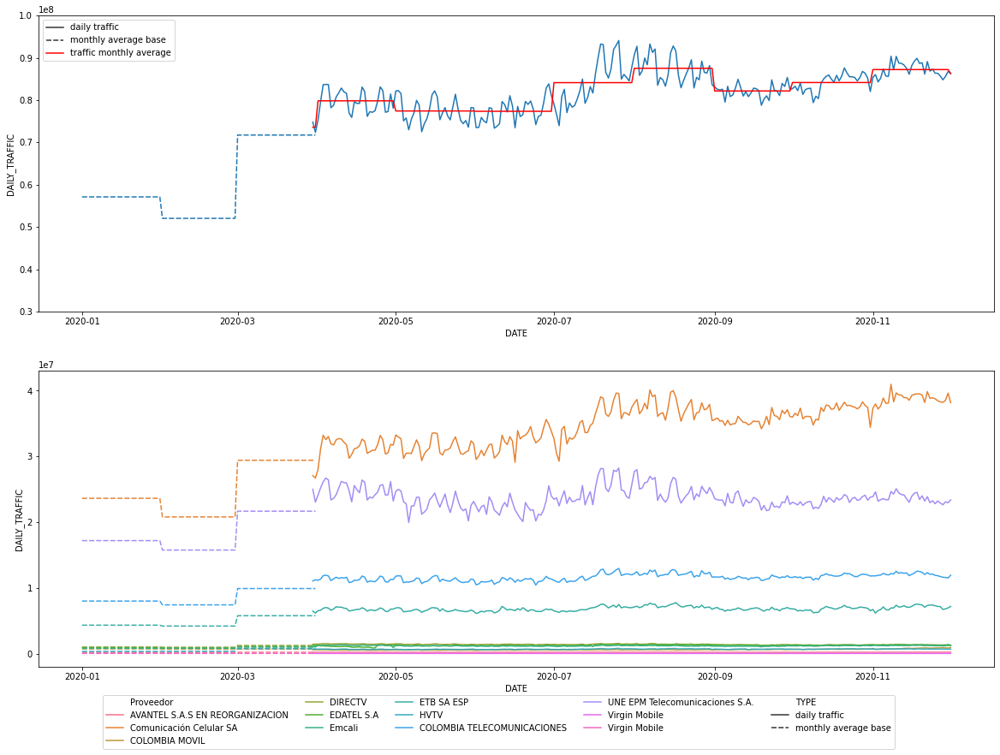

In [13]:
fig_dims = (20, 14)
fig, ax = plt.subplots(2,1, figsize=fig_dims)
ax[0].set(ylim=(3e7, 10e7))
sns.lineplot(data = agg_traf_group_concat, x = 'DATE', y = 'DAILY_TRAFFIC', style = 'TYPE', ax=ax[0], legend = "full")
sns.lineplot(data = agg_traf_day_group, x = 'DATE', y = 'MONTHLY_AVG', ax=ax[0], legend = "full", label = "traffic monthly average", color = "red")
g = sns.lineplot(data = agg_traf_total_concat, x = 'DATE', y = 'DAILY_TRAFFIC', style = "TYPE", hue = 'Proveedor', ax=ax[1], legend = "brief")
g.legend(ncol = 5, bbox_to_anchor=(0.9, -0.08))

**Remarks:** The graphs show an evident increase in the amount of traffic starting in march, jumping from a daily average of 52 to 57 PB in January and February, to a daily average of 72 to 90 PB in March to December. Colombia instaurated the lockdown in March 22nd and started relaxing lockdown restrictions in may.  The general quarantine was terminated in August. Charts show that the traffic has not decreased after the economy re-opened. On the contrary, the traffic seems to continue growing. This might be explained by the fact that schools are still closed and many companies continue to work remotely. However, this might also prove that society has implemented a digital transformation that might stay in place even after the pandemic emergency is over. In that case network infrastructure will to adapt for this new reality.

### 3.2 Map KPIs by municipality to infere possible affectation per location

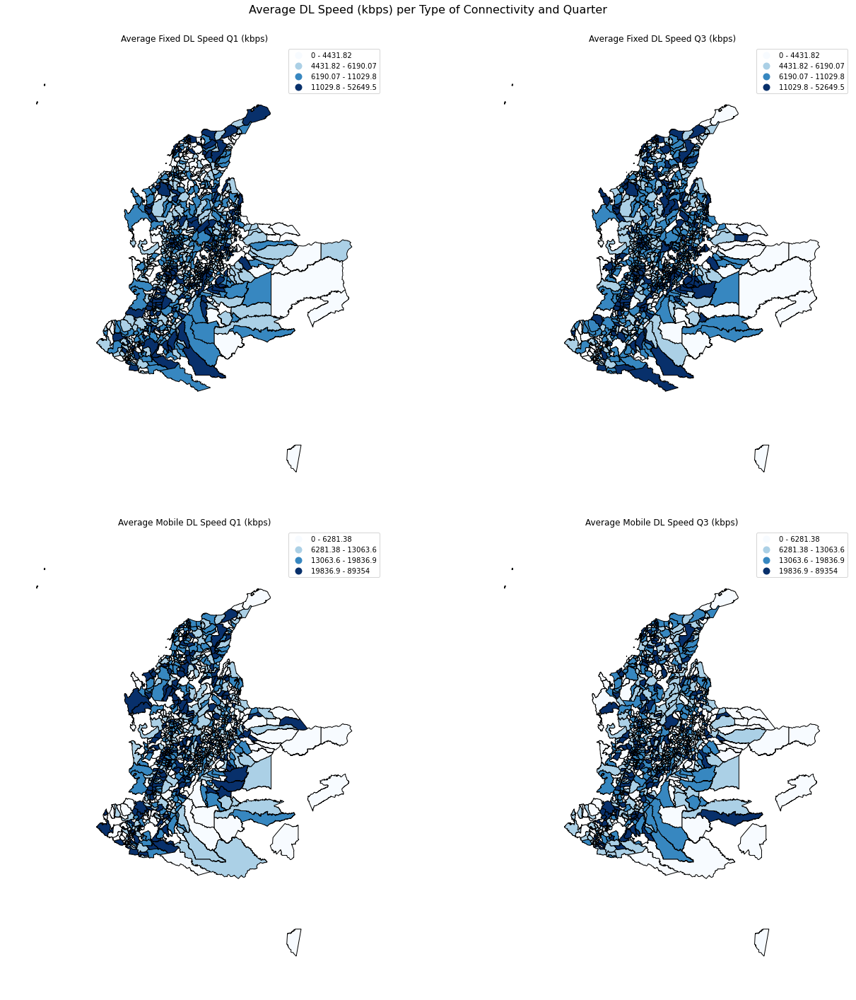

In [15]:
fig_dims = (20, 20)
fig, ax = plt.subplots(2,2, figsize=fig_dims)
df_plot1 = fixed_consolidated_geo.copy()
df_plot2 = mobile_consolidated_geo.copy()
variable1 = 'avg_d_kbps_q1'
variable2 = 'avg_d_kbps_q3'
scheme_1 = mpclas.Quantiles(df_plot1[variable1], k=4)
scheme_2 = mpclas.Quantiles(df_plot2[variable1], k=4)

gpl.choropleth(df_plot1, cmap="Blues", hue=df_plot1[variable1], scheme=scheme_1, legend = True, ax = ax[0,0])
gpl.choropleth(df_plot1, cmap="Blues", hue=df_plot1[variable2], scheme=scheme_1, legend = True, ax = ax[0,1])
gpl.choropleth(df_plot2, cmap="Blues", hue=df_plot2[variable1], scheme=scheme_2, legend = True, ax = ax[1,0])
gpl.choropleth(df_plot2, cmap="Blues", hue=df_plot2[variable2], scheme=scheme_2, legend = True, ax = ax[1,1])

fig.suptitle("Average DL Speed (kbps) per Type of Connectivity and Quarter", fontsize=16)
ax[0,0].set_title("Average Fixed DL Speed Q1 (kbps)")
ax[0,1].set_title("Average Fixed DL Speed Q3 (kbps)")
ax[1,0].set_title("Average Mobile DL Speed Q1 (kbps)")
ax[1,1].set_title("Average Mobile DL Speed Q3 (kbps)")
fig.tight_layout()
fig.subplots_adjust(top=0.94)

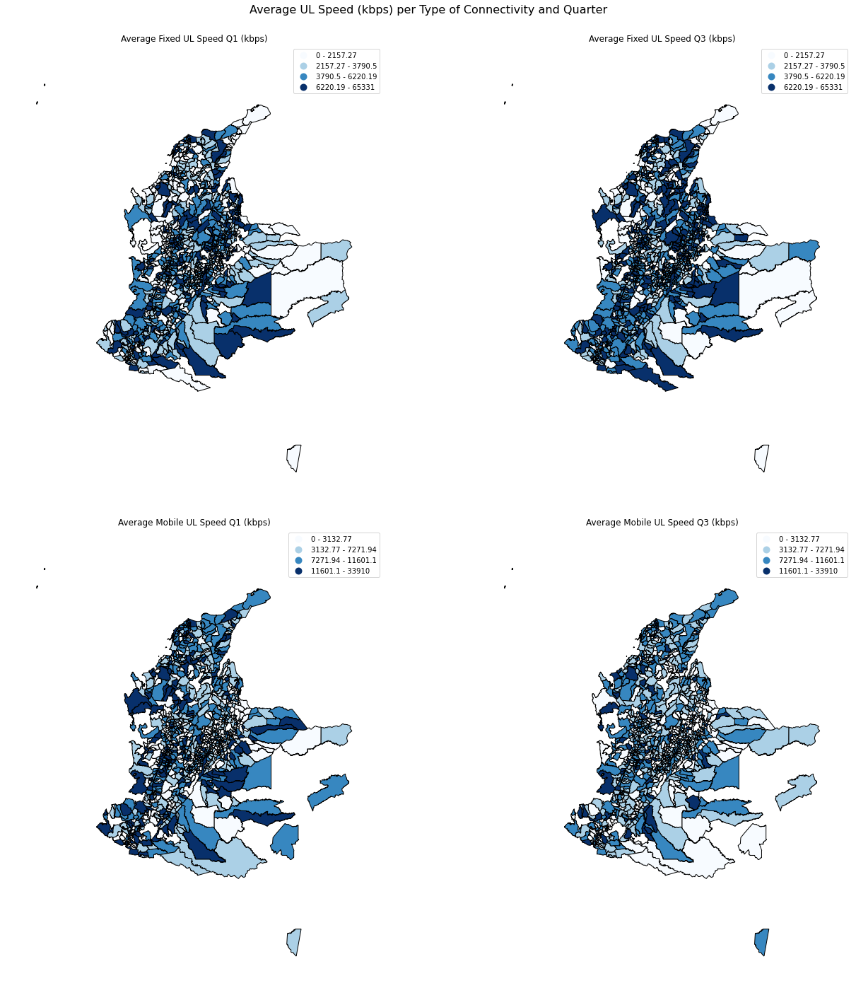

In [16]:
fig_dims = (20, 20)
fig, ax = plt.subplots(2,2, figsize=fig_dims)
df_plot1 = fixed_consolidated_geo.copy()
df_plot2 = mobile_consolidated_geo.copy()
variable1 = 'avg_u_kbps_q1'
variable2 = 'avg_u_kbps_q3'
scheme_1 = mpclas.Quantiles(df_plot1[variable1], k=4)
scheme_2 = mpclas.Quantiles(df_plot2[variable1], k=4)

gpl.choropleth(df_plot1, cmap="Blues", hue=df_plot1[variable1], scheme=scheme_1, legend = True, ax = ax[0,0])
gpl.choropleth(df_plot1, cmap="Blues", hue=df_plot1[variable2], scheme=scheme_1, legend = True, ax = ax[0,1])
gpl.choropleth(df_plot2, cmap="Blues", hue=df_plot2[variable1], scheme=scheme_2, legend = True, ax = ax[1,0])
gpl.choropleth(df_plot2, cmap="Blues", hue=df_plot2[variable2], scheme=scheme_2, legend = True, ax = ax[1,1])

fig.suptitle("Average UL Speed (kbps) per Type of Connectivity and Quarter", fontsize=16)
ax[0,0].set_title("Average Fixed UL Speed Q1 (kbps)")
ax[0,1].set_title("Average Fixed UL Speed Q3 (kbps)")
ax[1,0].set_title("Average Mobile UL Speed Q1 (kbps)")
ax[1,1].set_title("Average Mobile UL Speed Q3 (kbps)")
fig.tight_layout()
fig.subplots_adjust(top=0.94)

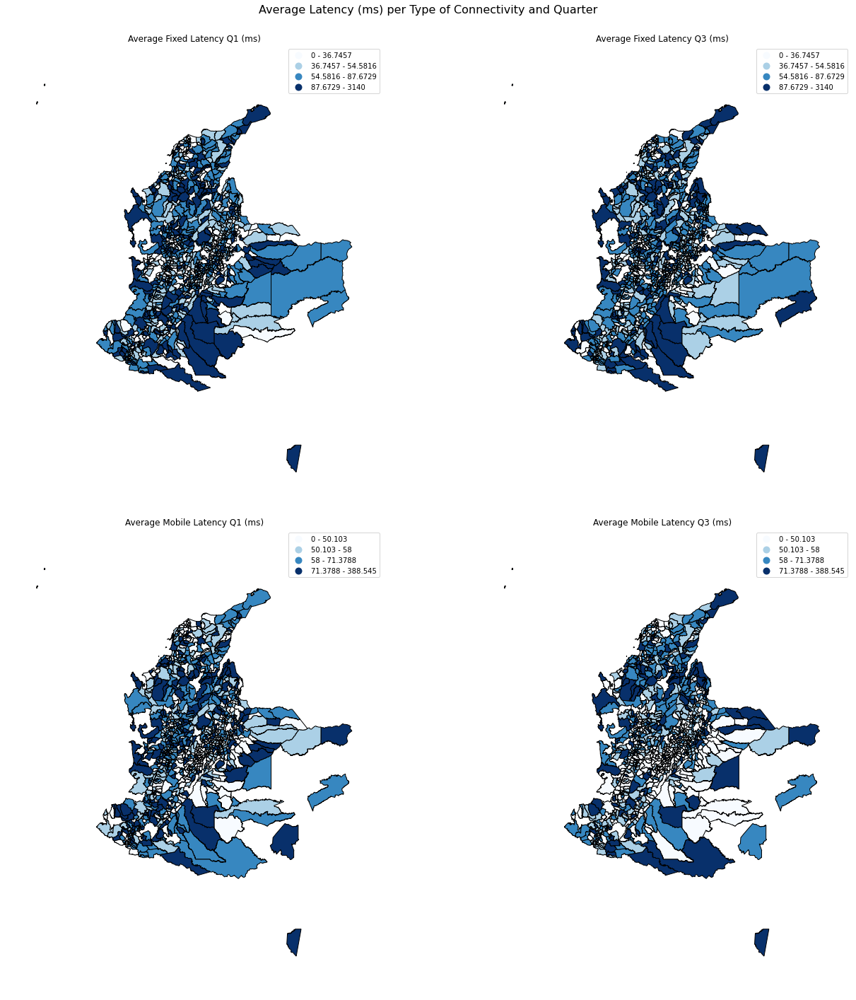

In [17]:
fig_dims = (20, 20)
fig, ax = plt.subplots(2,2, figsize=fig_dims)
df_plot1 = fixed_consolidated_geo.copy()
df_plot2 = mobile_consolidated_geo.copy()
variable1 = 'avg_lat_ms_q1'
variable2 = 'avg_lat_ms_q3'
scheme_1 = mpclas.Quantiles(df_plot1[variable1], k=4)
scheme_2 = mpclas.Quantiles(df_plot2[variable1], k=4)

gpl.choropleth(df_plot1, cmap="Blues", hue=df_plot1[variable1], scheme=scheme_1, legend = True, ax = ax[0,0])
gpl.choropleth(df_plot1, cmap="Blues", hue=df_plot1[variable2], scheme=scheme_1, legend = True, ax = ax[0,1])
gpl.choropleth(df_plot2, cmap="Blues", hue=df_plot2[variable1], scheme=scheme_2, legend = True, ax = ax[1,0])
gpl.choropleth(df_plot2, cmap="Blues", hue=df_plot2[variable2], scheme=scheme_2, legend = True, ax = ax[1,1])

fig.suptitle("Average Latency (ms) per Type of Connectivity and Quarter", fontsize=16)
ax[0,0].set_title("Average Fixed Latency Q1 (ms)")
ax[0,1].set_title("Average Fixed Latency Q3 (ms)")
ax[1,0].set_title("Average Mobile Latency Q1 (ms)")
ax[1,1].set_title("Average Mobile Latency Q3 (ms)")
fig.tight_layout()
fig.subplots_adjust(top=0.94)

### 3.3 Plot and characterize KPI distributions to identify how homogeneus are them among municipalities and identify differences in the distributions between Q1 and Q3 measurements

In [14]:
# Understand kpi distribution using describe function
display(fixed_analysis_no_geo[['devices_q1', 'devices_q2', 'devices_q3', 'avg_d_kbps_q1', 'avg_d_kbps_q2','avg_d_kbps_q3', 'avg_u_kbps_q1', 'avg_u_kbps_q2' , 'avg_u_kbps_q3', 'avg_lat_ms_q1', 'avg_lat_ms_q2', 'avg_lat_ms_q3']].describe())
display(mobile_analysis_no_geo[['devices_q1', 'devices_q2', 'devices_q3', 'avg_d_kbps_q1', 'avg_d_kbps_q2','avg_d_kbps_q3', 'avg_u_kbps_q1', 'avg_u_kbps_q2' , 'avg_u_kbps_q3', 'avg_lat_ms_q1', 'avg_lat_ms_q2', 'avg_lat_ms_q3']].describe())

,devices_q1,devices_q2,devices_q3,avg_d_kbps_q1,avg_d_kbps_q2,avg_d_kbps_q3,avg_u_kbps_q1,avg_u_kbps_q2,avg_u_kbps_q3,avg_lat_ms_q1,avg_lat_ms_q2,avg_lat_ms_q3
count,967.000000,959.000000,967.000000,967.000000,959.000000,967.000000,967.000000,959.000000,967.000000,967.000000,959.000000,967.000000
mean,558.211996,615.050052,608.890383,8256.112111,10283.528759,9960.393238,4913.305269,6845.150058,6194.376712,103.715648,97.714392,88.220651
std,5925.022650,6614.378838,6335.742837,6704.777207,9640.595627,9852.164166,4996.740091,8230.359962,5496.682933,180.780465,126.022548,122.176042
min,1.000000,1.000000,1.000000,16.000000,249.000000,525.250000,45.000000,322.000000,346.000000,5.000000,8.000000,8.200000
25%,7.000000,11.000000,12.000000,4356.678421,5104.068062,4991.402122,2106.145022,2879.702519,3011.556313,39.367654,43.608879,40.370871
50%,21.000000,30.000000,34.000000,6049.000000,7105.026066,6956.156250,3674.111111,4574.741935,4636.962963,56.688596,61.601778,57.481481
75%,79.000000,108.500000,113.500000,9742.481541,11788.900000,11086.889993,5711.543397,7565.060897,7138.121315,89.453355,95.785007,81.134615
max,172528.000000,193907.000000,186504.000000,52649.503268,127842.000000,147165.000000,65331.000000,130288.000000,57426.000000,3140.000000,1224.000000,1314.600000


,devices_q1,devices_q2,devices_q3,avg_d_kbps_q1,avg_d_kbps_q2,avg_d_kbps_q3,avg_u_kbps_q1,avg_u_kbps_q2,avg_u_kbps_q3,avg_lat_ms_q1,avg_lat_ms_q2,avg_lat_ms_q3
count,948.000000,903.000000,948.000000,948.000000,903.000000,948.000000,948.000000,903.000000,948.000000,948.000000,903.000000,948.000000
mean,78.264768,90.727575,96.155063,15009.978572,14313.625453,14169.856061,7508.279860,6564.496907,6262.879263,66.038493,60.842927,58.638405
std,889.847666,1015.429110,1009.802512,13305.490259,10124.373405,10201.294459,5661.411966,4465.933659,4189.257843,33.713941,26.960006,25.191446
min,1.000000,1.000000,1.000000,31.000000,68.000000,309.000000,42.000000,22.000000,84.000000,18.000000,19.000000,20.500000
25%,3.000000,4.000000,4.000000,6102.500000,6774.402574,6548.052508,2913.571420,3081.525000,2934.328571,49.332676,47.529523,45.744784
50%,7.000000,9.000000,11.000000,12258.067014,12736.000000,12729.247435,6843.520238,6219.730769,5855.708333,58.683333,56.781250,53.845390
75%,20.250000,24.000000,31.000000,19185.543860,18986.446607,19175.854990,10831.845272,9192.115196,8929.378479,72.208617,68.200000,65.903666
max,26328.000000,29546.000000,29929.000000,89354.000000,67758.000000,86420.000000,33910.000000,34386.000000,28869.000000,388.545455,599.833333,343.375000


Text(0.5, 1.0, 'Fixed Average Latency KPI Evolution per Quarter')

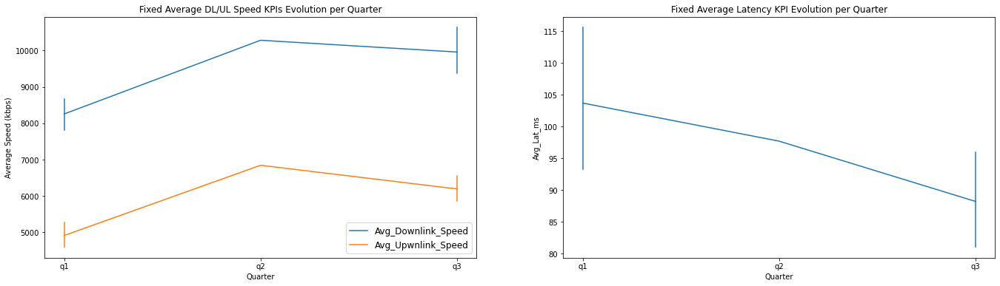

In [15]:
fix_un_pivot_kpi = fixed_analysis_no_geo[['avg_d_kbps_q1','avg_d_kbps_q2','avg_d_kbps_q3']].melt(var_name='Quarter_DL' , value_name = 'Avg_DL_kbps')
fix_un_pivot_kpi = fix_un_pivot_kpi.join(fixed_analysis_no_geo[['avg_u_kbps_q1','avg_u_kbps_q2','avg_u_kbps_q3']].melt(var_name='Quarter_UL' , value_name = 'Avg_UL_kbps'))
fix_un_pivot_kpi = fix_un_pivot_kpi.join(fixed_analysis_no_geo[['avg_lat_ms_q1','avg_lat_ms_q2','avg_lat_ms_q3']].melt(var_name='Quarter_Lat' , value_name = 'Avg_Lat_ms'))
fix_un_pivot_kpi = fix_un_pivot_kpi.join(fixed_analysis_no_geo[['devices_q1','devices_q2','devices_q3']].melt(var_name='Quarter_dev' , value_name = 'Number_unique_devices'))
fix_un_pivot_kpi['Quarter'] = fix_un_pivot_kpi['Quarter_DL'].str[-2:]
fix_un_pivot_kpi = fix_un_pivot_kpi.drop(['Quarter_DL', 'Quarter_UL', 'Quarter_Lat', 'Quarter_dev'], axis = 1)

fig, ax1 = plt.subplots(1,2, figsize=(23,6))

sns.lineplot(data=fix_un_pivot_kpi, x="Quarter", y="Avg_DL_kbps", label= "Avg_Downlink_Speed", ax = ax1[0], err_style = "bars" )
sns.lineplot(data=fix_un_pivot_kpi, x="Quarter", y="Avg_UL_kbps", label= "Avg_Upwnlink_Speed", ax = ax1[0], err_style = "bars")
sns.lineplot(data=fix_un_pivot_kpi, x="Quarter", y="Avg_Lat_ms", ax = ax1[1], err_style = "bars")
ax1[0].legend(loc='lower right', fontsize = 12)
ax1[0].set_title("Fixed Average DL/UL Speed KPIs Evolution per Quarter")
ax1[0].set_ylabel('Average Speed (kbps)')
ax1[1].set_title("Fixed Average Latency KPI Evolution per Quarter")

Text(0.5, 1.0, 'Mobile Average Latency KPI Evolution per Quarter')

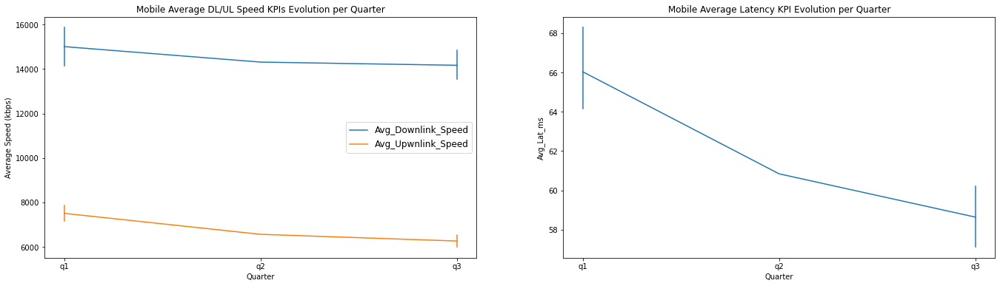

In [16]:
mob_un_pivot_kpi = mobile_analysis_no_geo[['avg_d_kbps_q1','avg_d_kbps_q2','avg_d_kbps_q3']].melt(var_name='Quarter_DL' , value_name = 'Avg_DL_kbps')
mob_un_pivot_kpi = mob_un_pivot_kpi.join(mobile_analysis_no_geo[['avg_u_kbps_q1','avg_u_kbps_q2','avg_u_kbps_q3']].melt(var_name='Quarter_UL' , value_name = 'Avg_UL_kbps'))
mob_un_pivot_kpi = mob_un_pivot_kpi.join(mobile_analysis_no_geo[['avg_lat_ms_q1','avg_lat_ms_q2','avg_lat_ms_q3']].melt(var_name='Quarter_Lat' , value_name = 'Avg_Lat_ms'))
mob_un_pivot_kpi = mob_un_pivot_kpi.join(mobile_analysis_no_geo[['devices_q1','devices_q2','devices_q3']].melt(var_name='Quarter_dev' , value_name = 'Number_unique_devices'))
mob_un_pivot_kpi['Quarter'] = mob_un_pivot_kpi['Quarter_DL'].str[-2:]
mob_un_pivot_kpi = mob_un_pivot_kpi.drop(['Quarter_DL', 'Quarter_UL', 'Quarter_Lat', 'Quarter_dev'], axis = 1)

fig, ax1 = plt.subplots(1,2, figsize=(23,6))

sns.lineplot(data=mob_un_pivot_kpi, x="Quarter", y="Avg_DL_kbps", label= "Avg_Downlink_Speed", ax = ax1[0], err_style = "bars" )
sns.lineplot(data=mob_un_pivot_kpi, x="Quarter", y="Avg_UL_kbps", label= "Avg_Upwnlink_Speed", ax = ax1[0], err_style = "bars")
sns.lineplot(data=mob_un_pivot_kpi, x="Quarter", y="Avg_Lat_ms", ax = ax1[1], err_style = "bars")
ax1[0].legend(loc='center right', fontsize = 12)
ax1[0].set_title("Mobile Average DL/UL Speed KPIs Evolution per Quarter")
ax1[0].set_ylabel('Average Speed (kbps)')
ax1[1].set_title("Mobile Average Latency KPI Evolution per Quarter")


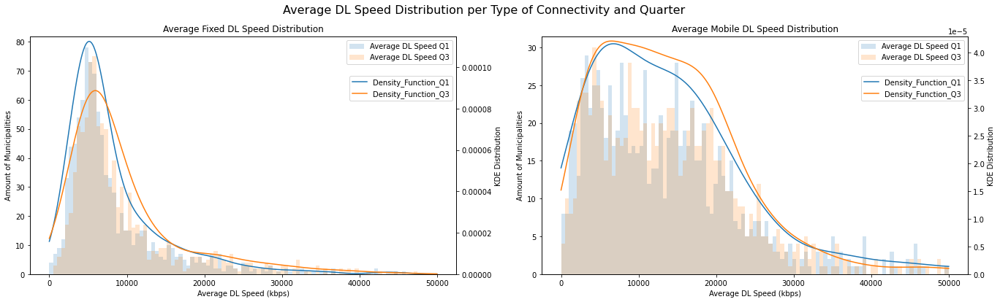

In [17]:
# Plot Average DL Distribution
fig, ax1 = plt.subplots(1,2 , figsize=(23,6))
variable1 = 'avg_d_kbps_q1'
variable2 = 'avg_d_kbps_q3'
offset = 0
bins = np.linspace(0, 50000, 100)
xx = np.linspace(0, 50000, 1000)

fxq1 = fixed_analysis_no_geo[variable1]
fkdeq1 = stats.gaussian_kde(fxq1)
fxq3 = fixed_analysis_no_geo[variable2]
fkdeq3 = stats.gaussian_kde(fxq3)

mxq1 = mobile_analysis_no_geo[variable1]
mkdeq1 = stats.gaussian_kde(mxq1)
mxq3 = mobile_analysis_no_geo[variable2]
mkdeq3 = stats.gaussian_kde(mxq3)

ax2 = np.array([a.twinx() for a in ax1.ravel()])

ax1[0].hist(fxq1, bins= bins - offset, alpha=0.2, label='Average DL Speed Q1')
ax1[0].hist(fxq3, bins= bins- offset, alpha=0.2, label='Average DL Speed Q3')
ax2[0].plot(xx- offset, fkdeq1(xx), label = "Density_Function_Q1")
ax2[0].plot(xx - offset, fkdeq3(xx), label = "Density_Function_Q3")
ax1[0].set_xlabel('Average DL Speed (kbps)')
ax1[0].set_ylabel('Amount of Municipalities')
ax2[0].set_ylabel('KDE Distribution')
ax1[0].legend(loc='upper right')
ax2[0].legend(bbox_to_anchor=(1, 0.85))
ax2[0].set_ylim(0,0.000115)
ax1[0].set_title("Average Fixed DL Speed Distribution")

ax1[1].hist(mxq1, bins= bins - offset, alpha=0.2, label='Average DL Speed Q1')
ax1[1].hist(mxq3, bins= bins- offset, alpha=0.2, label='Average DL Speed Q3')
ax2[1].plot(xx - offset, mkdeq1(xx), label = "Density_Function_Q1")
ax2[1].plot(xx - offset, mkdeq3(xx), label = "Density_Function_Q3")
ax1[1].set_xlabel('Average DL Speed (kbps)')
ax1[1].set_ylabel('Amount of Municipalities')
ax2[1].set_ylabel('KDE Distribution')
ax1[1].legend(loc='upper right')
ax2[1].legend(bbox_to_anchor=(1, 0.85))
ax2[1].set_ylim(0,4.3e-5)
ax1[1].set_title("Average Mobile DL Speed Distribution")

fig.suptitle("Average DL Speed Distribution per Type of Connectivity and Quarter", fontsize=16)

plt.show()

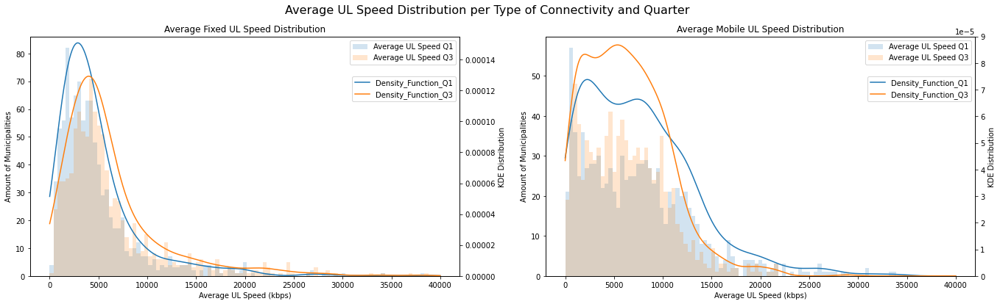

In [18]:
# Plot Average UL Distribution
fig, ax1 = plt.subplots(1,2 , figsize=(23,6))
variable1 = 'avg_u_kbps_q1'
variable2 = 'avg_u_kbps_q3'
offset = 0
bins = np.linspace(0, 40000, 100)
xx = np.linspace(0, 40000, 1000)

fxq1 = fixed_analysis_no_geo[variable1]
fkdeq1 = stats.gaussian_kde(fxq1)
fxq3 = fixed_analysis_no_geo[variable2]
fkdeq3 = stats.gaussian_kde(fxq3)

mxq1 = mobile_analysis_no_geo[variable1]
mkdeq1 = stats.gaussian_kde(mxq1)
mxq3 = mobile_analysis_no_geo[variable2]
mkdeq3 = stats.gaussian_kde(mxq3)

ax2 = np.array([a.twinx() for a in ax1.ravel()])

ax1[0].hist(fxq1, bins= bins - offset, alpha=0.2, label='Average UL Speed Q1')
ax1[0].hist(fxq3, bins= bins- offset, alpha=0.2, label='Average UL Speed Q3')
ax2[0].plot(xx- offset, fkdeq1(xx), label = "Density_Function_Q1")
ax2[0].plot(xx - offset, fkdeq3(xx), label = "Density_Function_Q3")
ax1[0].set_xlabel('Average UL Speed (kbps)')
ax1[0].set_ylabel('Amount of Municipalities')
ax2[0].set_ylabel('KDE Distribution')
ax1[0].legend(loc='upper right')
ax2[0].legend(bbox_to_anchor=(1, 0.85))
ax2[0].set_ylim(0, 1.55e-4)
ax1[0].set_title("Average Fixed UL Speed Distribution")

ax1[1].hist(mxq1, bins= bins - offset, alpha=0.2, label='Average UL Speed Q1')
ax1[1].hist(mxq3, bins= bins- offset, alpha=0.2, label='Average UL Speed Q3')
ax2[1].plot(xx- offset, mkdeq1(xx), label = "Density_Function_Q1")
ax2[1].plot(xx - offset, mkdeq3(xx), label = "Density_Function_Q3")
ax1[1].set_xlabel('Average UL Speed (kbps)')
ax1[1].set_ylabel('Amount of Municipalities')
ax2[1].set_ylabel('KDE Distribution')
ax1[1].legend(loc='upper right')
ax2[1].legend(bbox_to_anchor=(1, 0.85))
ax2[1].set_ylim(0,0.9e-4)
ax1[1].set_title("Average Mobile UL Speed Distribution")

fig.suptitle("Average UL Speed Distribution per Type of Connectivity and Quarter", fontsize=16)

plt.show()

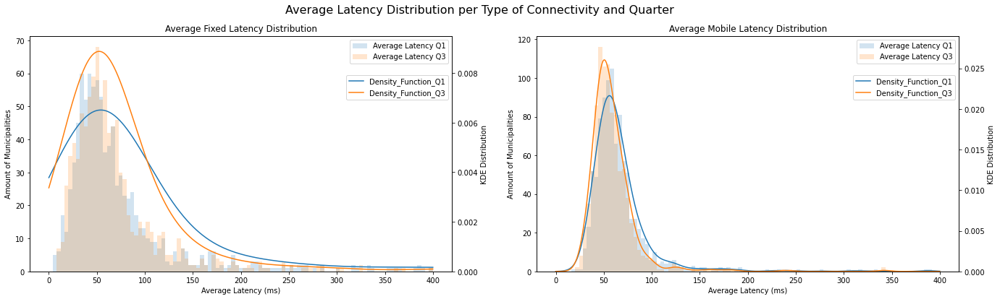

In [19]:
# Plot Average UL Distribution
fig, ax1 = plt.subplots(1,2 , figsize=(23,6))
variable1 = 'avg_lat_ms_q1'
variable2 = 'avg_lat_ms_q3'
offset = 0
bins = np.linspace(0, 400, 100)
xx = np.linspace(0, 400, 1000)

fxq1 = fixed_analysis_no_geo[variable1]
fkdeq1 = stats.gaussian_kde(fxq1)
fxq3 = fixed_analysis_no_geo[variable2]
fkdeq3 = stats.gaussian_kde(fxq3)

mxq1 = mobile_analysis_no_geo[variable1]
mkdeq1 = stats.gaussian_kde(mxq1)
mxq3 = mobile_analysis_no_geo[variable2]
mkdeq3 = stats.gaussian_kde(mxq3)
ax2 = np.array([a.twinx() for a in ax1.ravel()])

ax1[0].hist(fxq1, bins= bins - offset, alpha=0.2, label='Average Latency Q1')
ax1[0].hist(fxq3, bins= bins- offset, alpha=0.2, label='Average Latency Q3')
ax2[0].plot(xx- offset, fkdeq1(xx), label = "Density_Function_Q1")
ax2[0].plot(xx - offset, fkdeq3(xx), label = "Density_Function_Q3")
ax1[0].set_xlabel('Average Latency (ms)')
ax1[0].set_ylabel('Amount of Municipalities')
ax2[0].set_ylabel('KDE Distribution')
ax1[0].legend(loc='upper right')
ax2[0].legend(bbox_to_anchor=(1, 0.85))
ax2[0].set_ylim(0, 0.0095)
ax1[0].set_title("Average Fixed Latency Distribution")

ax1[1].hist(mxq1, bins= bins - offset, alpha=0.2, label='Average Latency Q1')
ax1[1].hist(mxq3, bins= bins- offset, alpha=0.2, label='Average Latency Q3')
ax2[1].plot(xx- offset, mkdeq1(xx), label = "Density_Function_Q1")
ax2[1].plot(xx - offset, mkdeq3(xx), label = "Density_Function_Q3")
ax1[1].set_xlabel('Average Latency (ms)')
ax1[1].set_ylabel('Amount of Municipalities')
ax2[1].set_ylabel('KDE Distribution')
ax1[1].legend(loc='upper right')
ax2[1].legend(bbox_to_anchor=(1, 0.85))
ax2[1].set_ylim(0,0.029)
ax1[1].set_title("Average Mobile Latency Distribution")

fig.suptitle("Average Latency Distribution per Type of Connectivity and Quarter", fontsize=16)

plt.show()

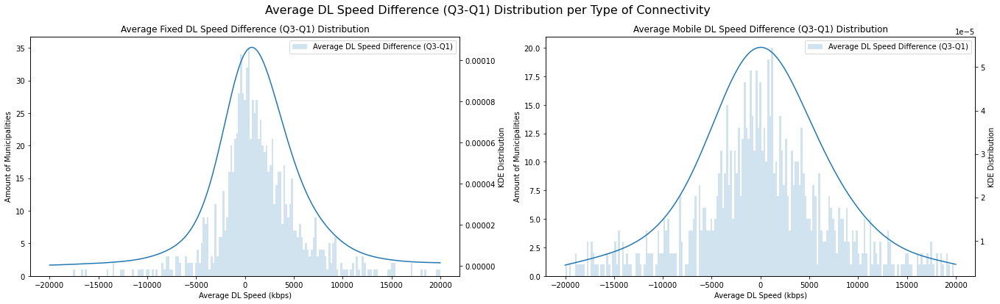

In [20]:
# Plot Average DL Distribution difference
fig, ax1 = plt.subplots(1,2 , figsize=(23,6))
variable1 = 'dif_avg_d_kbps_q3_q1'

offset = 1
bins = np.linspace(-20000, 20000, 200)
xx = np.linspace(-20000, 20000, 1000)

fx = fixed_analysis_no_geo[variable1]
fkde = stats.gaussian_kde(fx)


mx = mobile_analysis_no_geo[variable1]
mkde = stats.gaussian_kde(mx)

ax2 = np.array([a.twinx() for a in ax1.ravel()])

ax1[0].hist(fx, bins= bins - offset, alpha=0.2, label='Average DL Speed Difference (Q3-Q1)')
ax2[0].plot(xx- offset, fkde(xx), label = "Density_Function")
ax1[0].set_xlabel('Average DL Speed (kbps)')
ax1[0].set_ylabel('Amount of Municipalities')
ax2[0].set_ylabel('KDE Distribution')
ax1[0].legend(loc='upper right')
#ax2[0].legend(bbox_to_anchor=(1, 0.85))
#ax2[0].set_ylim(0, 0.007)
ax1[0].set_title("Average Fixed DL Speed Difference (Q3-Q1) Distribution")

ax1[1].hist(mx, bins= bins - offset, alpha=0.2, label='Average DL Speed Difference (Q3-Q1)')
ax2[1].plot(xx- offset, mkde(xx), label = "Density_Function")
ax1[1].set_xlabel('Average DL Speed (kbps)')
ax1[1].set_ylabel('Amount of Municipalities')
ax2[1].set_ylabel('KDE Distribution')
ax1[1].legend(loc='upper right')
#ax2[1].legend(bbox_to_anchor=(1, 0.85))
#ax2[1].set_ylim(0,0.007)
ax1[1].set_title("Average Mobile DL Speed Difference (Q3-Q1) Distribution")

fig.suptitle("Average DL Speed Difference (Q3-Q1) Distribution per Type of Connectivity", fontsize=16)

plt.show()

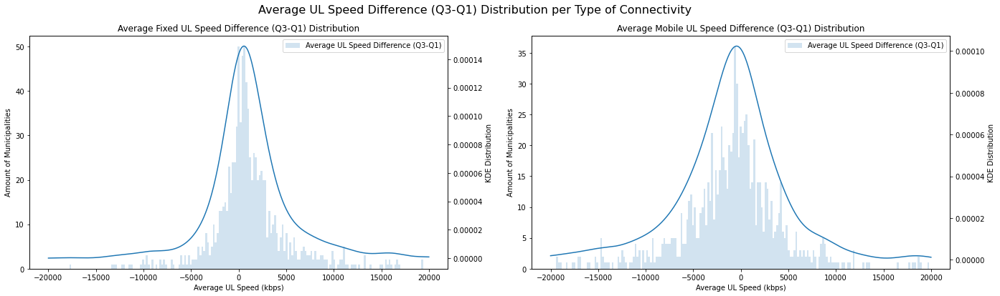

In [21]:
# Plot Average UL Distribution difference
fig, ax1 = plt.subplots(1,2 , figsize=(23,6))
variable1 = 'dif_avg_u_kbps_q3_q1'

offset = 1
bins = np.linspace(-20000, 20000, 200)
xx = np.linspace(-20000, 20000, 1000)

fx = fixed_analysis_no_geo[variable1]
fkde = stats.gaussian_kde(fx)


mx = mobile_analysis_no_geo[variable1]
mkde = stats.gaussian_kde(mx)

ax2 = np.array([a.twinx() for a in ax1.ravel()])

ax1[0].hist(fx, bins= bins - offset, alpha=0.2, label='Average UL Speed Difference (Q3-Q1)')
ax2[0].plot(xx- offset, fkde(xx), label = "Density_Function")
ax1[0].set_xlabel('Average UL Speed (kbps)')
ax1[0].set_ylabel('Amount of Municipalities')
ax2[0].set_ylabel('KDE Distribution')
ax1[0].legend(loc='upper right')
#ax2[0].legend(bbox_to_anchor=(1, 0.85))
#ax2[0].set_ylim(0, 0.007)
ax1[0].set_title("Average Fixed UL Speed Difference (Q3-Q1) Distribution")

ax1[1].hist(mx, bins= bins - offset, alpha=0.2, label='Average UL Speed Difference (Q3-Q1)')
ax2[1].plot(xx- offset, mkde(xx), label = "Density_Function")
ax1[1].set_xlabel('Average UL Speed (kbps)')
ax1[1].set_ylabel('Amount of Municipalities')
ax2[1].set_ylabel('KDE Distribution')
ax1[1].legend(loc='upper right')
#ax2[1].legend(bbox_to_anchor=(1, 0.85))
#ax2[1].set_ylim(0,0.007)
ax1[1].set_title("Average Mobile UL Speed Difference (Q3-Q1) Distribution")

fig.suptitle("Average UL Speed Difference (Q3-Q1) Distribution per Type of Connectivity", fontsize=16)

plt.show()

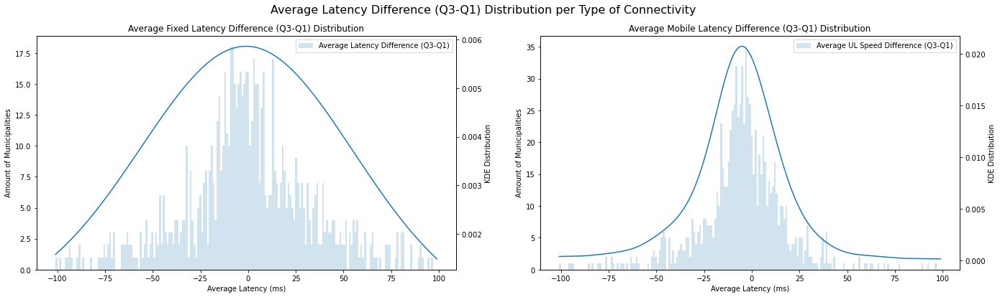

In [22]:
# Plot Average Latency Distribution difference
fig, ax1 = plt.subplots(1,2 , figsize=(23,6))
variable1 = 'dif_avg_lat_ms_q3_q1'

offset = 1
bins = np.linspace(-100, 100, 200)
xx = np.linspace(-100, 100, 1000)

fx = fixed_analysis_no_geo[variable1]
fkde = stats.gaussian_kde(fx)


mx = mobile_analysis_no_geo[variable1]
mkde = stats.gaussian_kde(mx)

ax2 = np.array([a.twinx() for a in ax1.ravel()])

ax1[0].hist(fx, bins= bins - offset, alpha=0.2, label='Average Latency Difference (Q3-Q1)')
ax2[0].plot(xx- offset, fkde(xx), label = "Density_Function")
ax1[0].set_xlabel('Average Latency (ms)')
ax1[0].set_ylabel('Amount of Municipalities')
ax2[0].set_ylabel('KDE Distribution')
ax1[0].legend(loc='upper right')
#ax2[0].legend(bbox_to_anchor=(1, 0.85))
#ax2[0].set_ylim(0, 0.007)
ax1[0].set_title("Average Fixed Latency Difference (Q3-Q1) Distribution")

ax1[1].hist(mx, bins= bins - offset, alpha=0.2, label='Average UL Speed Difference (Q3-Q1)')
ax2[1].plot(xx- offset, mkde(xx), label = "Density_Function")
ax1[1].set_xlabel('Average Latency (ms)')
ax1[1].set_ylabel('Amount of Municipalities')
ax2[1].set_ylabel('KDE Distribution')
ax1[1].legend(loc='upper right')
#ax2[1].legend(bbox_to_anchor=(1, 0.85))
#ax2[1].set_ylim(0,0.007)
ax1[1].set_title("Average Mobile Latency Difference (Q3-Q1) Distribution")

fig.suptitle("Average Latency Difference (Q3-Q1) Distribution per Type of Connectivity", fontsize=16)

plt.show()

### 3.4 Define deterioration thresholds to identify municipalities with significant impact in experience KPIs
The distribution plots didn't show an evident deterioration on the mean and the overall distribution when considering all the municipalities. However, distribution of the KPI difference between Q3 and Q1 charts also show that there is a deterioration for certain group of municipalities, specially for Uplink Speed and Latency KPIs. This section plots the distribution of the % deterioration for each KPI.

#### Sample Size
Although the datasets include information for 967 municipalities for fixed networks and 948 municipalities for mobile networks, many of the municipalities just included a couple of tests and 1 or 2 unique devices. A minimum amount of devices and tests per municipality shall be defined prior to any further analysis. The following graphs show the distribution for both the number of devices per municipality, taking the minimum of unique devices between the datasets from Q1 and Q3.

The graph shows that 227 municipalities had 5 or less unique devices running speed tests in Q1 or Q3 for fixed networks, and 447 municipalities had 5 or less devices running speed tests in Q1 or Q3 for mobile networks. Although 5 unique devices is a sample size that is far from ideal, increasing the threshold would result in a loss of more than 50% of the mobile base of municipalities, therefore the analysis will be made with a threshold of minimum 5 unique devices per municipality for both Q1 and Q3. Any municipality with less unique devices was discarted.

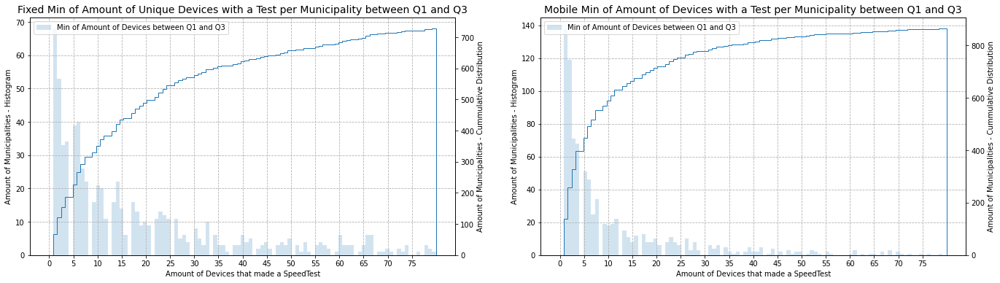

In [23]:
fig, ax1 = plt.subplots(1,2 , figsize=(23,6))
bins = np.linspace(0, 80, 100)

fx = fixed_analysis_no_geo[['devices_q1','devices_q3']].min(axis = 1)
mx = mobile_analysis_no_geo[['devices_q1','devices_q3']].min(axis = 1)

ax2 = np.array([a.twinx() for a in ax1.ravel()])

ax1[0].hist(fx, bins= bins, alpha=0.2, label='Min of Amount of Devices between Q1 and Q3')
ax2[0].hist(fx, bins= bins, histtype='step', cumulative=1)
ax1[0].set_xlabel('Amount of Devices that made a SpeedTest')
ax2[0].set_ylabel('Amount of Municipalities - Cummulative Distribution')
ax1[0].set_ylabel('Amount of Municipalities - Histogram')
ax1[0].legend(loc='upper left')
ax1[0].set_title("Fixed Min of Amount of Unique Devices with a Test per Municipality between Q1 and Q3", fontsize = 14)
ax1[0].set_xticks(np.arange(0, 80, step=5))

ax1[0].grid( linestyle='--')

ax1[1].hist(mx, bins= bins, alpha=0.2, label='Min of Amount of Devices between Q1 and Q3')
ax2[1].hist(mx, bins= bins, histtype='step', cumulative=1)
ax1[1].set_xlabel('Amount of Devices that made a SpeedTest')
ax2[1].set_ylabel('Amount of Municipalities - Cummulative Distribution')
ax1[1].set_ylabel('Amount of Municipalities - Histogram')
ax1[1].legend(loc='upper left')
ax1[1].set_title("Mobile Min of Amount of Devices with a Test per Municipality between Q1 and Q3", fontsize = 14)
ax1[1].set_xticks(np.arange(0, 80, step=5))

ax1[1].grid( linestyle='--')

In [15]:
# Discard municipalities with less than 5 unique devices in either Q1 or Q3
thr_dev_fix = 5
thr_dev_mob = 5
fixed_analysis_no_geo_dev = fixed_analysis_no_geo.loc[(fixed_analysis_no_geo['devices_q1'] > thr_dev_fix) & (fixed_analysis_no_geo['devices_q3'] > thr_dev_fix)]
mobile_analysis_no_geo_dev = mobile_analysis_no_geo.loc[(mobile_analysis_no_geo['devices_q1'] > thr_dev_mob) & (mobile_analysis_no_geo['devices_q3'] > thr_dev_mob)]

print("The shape of the fixed base excluding municipalities with less than", thr_dev_fix, "devices per quarter is: ", fixed_analysis_no_geo_dev.shape)
#display(fixed_analysis_no_geo_dev.head())
print("The shape of the mobile base excluding municipalities with less than", thr_dev_mob, "devices per quarter is: ", mobile_analysis_no_geo_dev.shape)
#display(mobile_analysis_no_geo_dev.head())

The shape of the fixed base excluding municipalities with less than 5 devices per quarter is:  (740, 121)
The shape of the mobile base excluding municipalities with less than 5 devices per quarter is:  (501, 151)


#### KPI deterioration plot
Just as predicted by my hypothesis, even though the KPI distribution of all the municipalities showed no significant differences between Q1 and Q3, there is a significant group of municipalities that is showing severe affectation:
- **Fixed Networks**: 
    - *Mild deterioration*: 404 municipalities (41% of the universe) experienced 10% or more deterioration in any of the three KPIs.
    - *Significant deterioration*: 283 municipalities (29% of the universe) experienced 30% or more deterioration in any of the three KPIs. 
    - *Extreme deterioration*: 105 municipalities (11% of the universe) experienced 80% or more deterioration in any of the three KPIs. 
- **Mobile Networks**: 
    -  *Mild deterioration*: 359 municipalities (38% of the universe) experienced 10% or more deterioration in any of the three KPIs.
    - *Significant deterioration*: 205 municipalities (22% of the universe) experienced 30% or more deterioration in any of the three KPIs. 
    - *Extreme deterioration*: 14 municipalities (2% of the universe) experienced 80% or more deterioration in any of the three KPIs. 

I defined 30% as the threshold for significant deterioration in the KPIs for the following steps of the analysis

In [25]:
# Deterioration for fixed network base
deterioration_fixed = pd.DataFrame()
deterioration_fixed['Deterioriation_Threshold'] = np.arange(0.1, 0.85, step=0.05)
deterioration_fixed['Municipalities with DL deterioration'] = np.nan
deterioration_fixed['Municipalities with UL deterioration'] = np.nan
deterioration_fixed['Municipalities with Latency deterioration'] = np.nan
deterioration_fixed['Municipalities with deterioration in any KPI beyond threshold'] = np.nan
for index, row in deterioration_fixed.iterrows():
    row['Municipalities with DL deterioration'] = fixed_analysis_no_geo_dev.loc[(fixed_analysis_no_geo_dev['%_dif_avg_d_q3_q1'] < -row['Deterioriation_Threshold'])].shape[0]
    row['Municipalities with UL deterioration'] = fixed_analysis_no_geo_dev.loc[(fixed_analysis_no_geo_dev['%_dif_avg_u_q3_q1'] < -row['Deterioriation_Threshold'])].shape[0]
    row['Municipalities with Latency deterioration'] = fixed_analysis_no_geo_dev.loc[(fixed_analysis_no_geo_dev['%_dif_avg_lat_q3_q1'] > row['Deterioriation_Threshold'])].shape[0]
    row['Municipalities with deterioration in any KPI beyond threshold'] = fixed_analysis_no_geo_dev.loc[(fixed_analysis_no_geo_dev['%_dif_avg_d_q3_q1'] < -row['Deterioriation_Threshold'])|(fixed_analysis_no_geo_dev['%_dif_avg_u_q3_q1'] < -row['Deterioriation_Threshold'])|(fixed_analysis_no_geo_dev['%_dif_avg_lat_q3_q1'] > row['Deterioriation_Threshold'])].shape[0]
deterioration_fixed.head()

,Deterioriation_Threshold,Municipalities with DL deterioration,Municipalities with UL deterioration,Municipalities with Latency deterioration,Municipalities with deterioration in any KPI beyond threshold
0,0.10,173.0,185.0,280.0,404.0
1,0.15,145.0,164.0,253.0,367.0
2,0.20,116.0,147.0,233.0,335.0
3,0.25,94.0,126.0,217.0,308.0
4,0.30,79.0,105.0,203.0,283.0


In [26]:
# Deterioration for mobile network base
deterioration_mobile = pd.DataFrame()
deterioration_mobile['Deterioriation_Threshold'] = np.arange(0.10, 0.85, step=0.05)
deterioration_mobile['Municipalities with DL deterioration'] = np.nan
deterioration_mobile['Municipalities with UL deterioration'] = np.nan
deterioration_mobile['Municipalities with Latency deterioration'] = np.nan
deterioration_mobile['Municipalities with deterioration in any KPI beyond threshold'] = np.nan
for index, row in deterioration_mobile.iterrows():
    row['Municipalities with DL deterioration'] = mobile_analysis_no_geo_dev.loc[(mobile_analysis_no_geo_dev['%_dif_avg_d_q3_q1'] < -row['Deterioriation_Threshold'])].shape[0]
    row['Municipalities with UL deterioration'] = mobile_analysis_no_geo_dev.loc[(mobile_analysis_no_geo_dev['%_dif_avg_u_q3_q1'] < -row['Deterioriation_Threshold'])].shape[0]
    row['Municipalities with Latency deterioration'] = mobile_analysis_no_geo_dev.loc[(mobile_analysis_no_geo_dev['%_dif_avg_lat_q3_q1'] > row['Deterioriation_Threshold'])].shape[0]
    row['Municipalities with deterioration in any KPI beyond threshold'] = mobile_analysis_no_geo_dev.loc[(mobile_analysis_no_geo_dev['%_dif_avg_d_q3_q1'] < -row['Deterioriation_Threshold'])|(mobile_analysis_no_geo_dev['%_dif_avg_u_q3_q1'] < -row['Deterioriation_Threshold'])|(mobile_analysis_no_geo_dev['%_dif_avg_lat_q3_q1'] > row['Deterioriation_Threshold'])].shape[0]
deterioration_mobile.head()

,Deterioriation_Threshold,Municipalities with DL deterioration,Municipalities with UL deterioration,Municipalities with Latency deterioration,Municipalities with deterioration in any KPI beyond threshold
0,0.10,189.0,272.0,125.0,359.0
1,0.15,160.0,236.0,101.0,324.0
2,0.20,138.0,197.0,82.0,281.0
3,0.25,114.0,163.0,58.0,240.0
4,0.30,92.0,140.0,50.0,205.0


Text(0.5, 1.0, 'Mobile Network - Number of Municipalities vs KPI Deterioration')

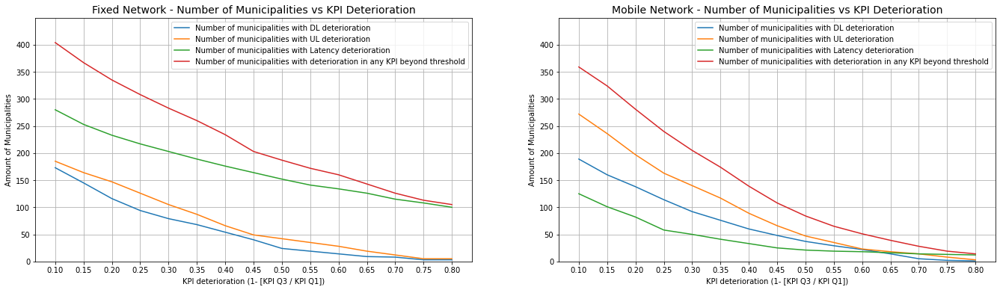

In [27]:
fig, ax1 = plt.subplots(1,2 , figsize=(23,6))

ax1[0].plot(deterioration_fixed['Deterioriation_Threshold'],deterioration_fixed['Municipalities with DL deterioration'], label= 'Number of municipalities with DL deterioration')
ax1[0].plot(deterioration_fixed['Deterioriation_Threshold'],deterioration_fixed['Municipalities with UL deterioration'], label= 'Number of municipalities with UL deterioration')
ax1[0].plot(deterioration_fixed['Deterioriation_Threshold'],deterioration_fixed['Municipalities with Latency deterioration'], label= 'Number of municipalities with Latency deterioration')
ax1[0].plot(deterioration_fixed['Deterioriation_Threshold'],deterioration_fixed['Municipalities with deterioration in any KPI beyond threshold'], label= 'Number of municipalities with deterioration in any KPI beyond threshold')
ax1[0].set_xticks(np.arange(0.1, 0.85, step=0.05))
ax1[0].set_yticks(np.arange(0, 450, step=50))
ax1[0].set_ylim(0, 450)
ax1[0].legend(loc='upper right')
ax1[0].grid()
ax1[0].set_xlabel('KPI deterioration (1- [KPI Q3 / KPI Q1])')
ax1[0].set_ylabel('Amount of Municipalities')
ax1[0].set_title("Fixed Network - Number of Municipalities vs KPI Deterioration", fontsize = 14)

ax1[1].plot(deterioration_mobile['Deterioriation_Threshold'],deterioration_mobile['Municipalities with DL deterioration'], label= 'Number of municipalities with DL deterioration')
ax1[1].plot(deterioration_mobile['Deterioriation_Threshold'],deterioration_mobile['Municipalities with UL deterioration'], label= 'Number of municipalities with UL deterioration')
ax1[1].plot(deterioration_mobile['Deterioriation_Threshold'],deterioration_mobile['Municipalities with Latency deterioration'], label= 'Number of municipalities with Latency deterioration')
ax1[1].plot(deterioration_mobile['Deterioriation_Threshold'],deterioration_mobile['Municipalities with deterioration in any KPI beyond threshold'], label= 'Number of municipalities with deterioration in any KPI beyond threshold')
ax1[1].set_xticks(np.arange(0.1 , 0.85, step=0.05))
ax1[1].set_yticks(np.arange(0, 450, step=50))
ax1[1].set_ylim(0, 450)
ax1[1].legend(loc='upper right')
ax1[1].grid()
ax1[1].set_xlabel('KPI deterioration (1- [KPI Q3 / KPI Q1])')
ax1[1].set_ylabel('Amount of Municipalities')
ax1[1].set_title("Mobile Network - Number of Municipalities vs KPI Deterioration", fontsize = 14)

### 3.5 Include a "Significant Deterioration" flag in the datasets

In [16]:
kpi_thr = 0.30
fixed_analysis_no_geo_dev['Significant_deterioration'] = np.where((fixed_analysis_no_geo_dev['%_dif_avg_d_q3_q1'] < -kpi_thr)|(fixed_analysis_no_geo_dev['%_dif_avg_u_q3_q1'] < -kpi_thr)|(fixed_analysis_no_geo_dev['%_dif_avg_lat_q3_q1'] > kpi_thr), #Identifies the case to apply to
                        1,      #This is the value that is inserted
                        0)

mobile_analysis_no_geo_dev['Significant_deterioration'] = np.where((mobile_analysis_no_geo_dev['%_dif_avg_d_q3_q1'] < -kpi_thr)|(mobile_analysis_no_geo_dev['%_dif_avg_u_q3_q1'] < -kpi_thr)|(mobile_analysis_no_geo_dev['%_dif_avg_lat_q3_q1'] > kpi_thr), #Identifies the case to apply to
                        1,      #This is the value that is inserted
                        0)

display(mobile_analysis_no_geo_dev.head())
display(fixed_analysis_no_geo_dev.head())


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,DPTO_MPIO,MPIO_CCDGO,MPIO_CNMBR,MPIO_NAREA,DPTO_CNMBR,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3,NUM_INTERNET_ACCESS,POPULATION,FIX_INT_PENETRATION,NUM_INTERNET_ACCESS_Q3,POPULATION_Q3,FIX_INT_PENETRATION_Q3,NBR_TECH_ACCESS,CLARO,TIGO,MOVISTAR,ETB,EMCALI,DIRECTV,EDATEL,HV_MULT,TELEBMGA,METROTEL,HUGHES,AZTECA,FIX_TECH_FTTH,FIX_TECH_FTTX,FIX_TECH_CABLE,FIX_TECH_COPPER,FIX_TECH_FWA,AVG_OFFER_DL_FIX_ACC,AVG_OFFER_UL_FIX_ACC,%_FTTH,%_FTTX,%_CABLE,%_FWA,%_COPPER,%_CLARO,%_TIGO,%_MOVISTAR,%_ETB,%_EMCALI,%_DIRECTV,%_EDATEL,%_HV_MULT,%_TELEBMGA,%_METROTEL,%_HUGHES,%_AZTECA,%_OTHERS,NBR_TECH_ACCESS_Q3,CLARO_Q3,TIGO_Q3,MOVISTAR_Q3,ETB_Q3,EMCALI_Q3,DIRECTV_Q3,EDATEL_Q3,HV_MULT_Q3,TELEBMGA_Q3,METROTEL_Q3,HUGHES_Q3,AZTECA_Q3,FIX_TECH_FTTH_Q3,FIX_TECH_FTTX_Q3,FIX_TECH_CABLE_Q3,FIX_TECH_COPPER_Q3,FIX_TECH_FWA_Q3,AVG_OFFER_DL_FIX_ACC_Q3,AVG_OFFER_UL_FIX_ACC_Q3,%_FTTH_Q3,%_FTTX_Q3,%_CABLE_Q3,%_FWA_Q3,%_COPPER_Q3,%_CLARO_Q3,%_TIGO_Q3,%_MOVISTAR_Q3,%_ETB_Q3,%_EMCALI_Q3,%_DIRECTV_Q3,%_EDATEL_Q3,%_HV_MULT_Q3,%_TELEBMGA_Q3,%_METROTEL_Q3,%_HUGHES_Q3,%_AZTECA_Q3,%_OTHERS_Q3,M_AVANTEL,M_TIGO,M_MOVISTAR,M_CLARO,M_ETB,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA LTE,%_LTE,%_M_AVANTEL,%_M_TIGO,%_M_MOVISTAR,%_M_CLARO,%_M_ETB,M_AVANTEL_Q3,M_TIGO_Q3,M_MOVISTAR_Q3,M_CLARO_Q3,M_ETB_Q3,COBERTURA 2G_Q3,COBERTURA 3G_Q3,"COBERTURA HSPA+, HSPA+DC_Q3",COBERTUTA LTE_Q3,%_LTE_Q3,%_M_AVANTEL_Q3,%_M_TIGO_Q3,%_M_MOVISTAR_Q3,%_M_CLARO_Q3,%_M_ETB_Q3,GDP,dif_avg_d_kbps_q3_q1,%_dif_avg_d_q3_q1,dif_avg_u_kbps_q3_q1,%_dif_avg_u_q3_q1,dif_avg_lat_ms_q3_q1,%_dif_avg_lat_q3_q1,%_devices_q3_q1,POP_DENSITY,GDP_CAPITA,Significant_deterioration
0,05_001,1,MEDELLÍN,374.830625,ANTIOQUIA,18925.263158,11907.988506,41.853358,6996.414538,4042.425224,9.854608,8265,4446,22532.977340,11665.852601,40.929711,7880.161894,4350.276010,11.957120,9091.0,4059.0,22247.250795,11106.472447,37.006362,7593.550656,3921.154562,10.488321,9745,4371,631918,2533424,0.2494,654343,2533424,0.2583,631918,178167,440800,1,160,0,4777,23,943,0,0,190,3,5045,20288,553861,41338,11386,32.684440,17.088139,0.01,0.03,0.88,0.02,0.07,0.28,0.7,0.0,0.0,0.0,0.01,0.00,0.0,0.0,0.0,0.00,0.0,0.01,654343,182779,458218,1,149,0,4643,22,1015,0,0,220,3,5142,21039,580920,35561,11681,34.505297,17.296610,0.01,0.03,0.89,0.02,0.05,0.28,0.7,0.0,0.0,0.0,0.01,0.00,0.0,0.0,0.0,0.00,0.0,0.01,1,3,6,35,2,42,39,35,33,0.79,0.02,0.07,0.14,0.83,0.05,1,3,6,35,2,42,39,35,33,0.79,0.02,0.07,0.14,0.83,0.05,54968.0,3321.987637,0.175532,-801.516058,-0.067309,-4.846995,-0.115809,0.983131,6758.850085,0.021697,0
4,05_030,30,AMAGÁ,84.132477,ANTIOQUIA,8352.047059,5657.623529,74.976471,4032.743498,3660.754297,37.262255,85,21,5536.615385,1500.153846,79.717949,2961.030666,2076.642921,28.961191,78.0,14.0,8383.700730,3606.313869,58.817518,4070.031484,3089.392642,15.645061,137,36,3088,31283,0.0987,2987,31283,0.0955,3088,14,3,0,2,0,0,2890,0,0,0,32,3,10,24,133,2788,133,11.876404,3.932584,0.00,0.01,0.04,0.04,0.90,0.00,0.0,0.0,0.0,0.0,0.00,0.94,0.0,0.0,0.0,0.01,0.0,0.05,2987,20,3,0,2,0,0,2827,0,0,0,35,2,6,23,90,2730,138,11.919540,4.448276,0.00,0.01,0.03,0.05,0.91,0.01,0.0,0.0,0.0,0.0,0.00,0.95,0.0,0.0,0.0,0.01,0.0,0.03,0,1,1,4,0,5,6,6,3,0.50,0.00,0.17,0.17,0.67,0.00,0,1,1,4,0,5,6,6,3,0.50,0.00,0.17,0.17,0.67,0.00,493.0,31.653671,0.003790,-2051.309661,-0.362574,-16.158952,-0.215520,1.714286,371.830251,0.015759,1
5,05_031,31,AMALFI,1209.126871,ANTIOQUIA,21200.680000,11334.640000,52.760000,7189.226145,1211.020330,4.274732,25,13,21273.422222,11189.333333,54.822222,7701.212385,5568.201987,12.510521,45.0,12.0,18638.238095,9535.404762,44.642857,5949.892583,2753.477252,5.888482,42,16,1424,27071,0.0526,1310,27071,0.0484,1424,0,2,0,1,0,0,1170,0,0,0,114,5,133,11,0,1161,119,9.684932,4.424658,0.09,0.01,0.00

,DPTO_MPIO,MPIO_CCDGO,MPIO_CNMBR,MPIO_NAREA,DPTO_CNMBR,avg_d_kbps_q1,avg_u_kbps_q1,avg_lat_ms_q1,std_d_kbps_q1,std_u_kbps_q1,std_lat_ms_q1,tests_q1,devices_q1,avg_d_kbps_q2,avg_u_kbps_q2,avg_lat_ms_q2,std_d_kbps_q2,std_u_kbps_q2,std_lat_ms_q2,tests_q2,devices_q2,avg_d_kbps_q3,avg_u_kbps_q3,avg_lat_ms_q3,std_d_kbps_q3,std_u_kbps_q3,std_lat_ms_q3,tests_q3,devices_q3,NUM_INTERNET_ACCESS,POPULATION,FIX_INT_PENETRATION,NUM_INTERNET_ACCESS_Q3,POPULATION_Q3,FIX_INT_PENETRATION_Q3,NBR_TECH_ACCESS,CLARO,TIGO,MOVISTAR,ETB,EMCALI,DIRECTV,EDATEL,HV_MULT,TELEBMGA,METROTEL,HUGHES,AZTECA,FIX_TECH_FTTH,FIX_TECH_FTTX,FIX_TECH_CABLE,FIX_TECH_COPPER,FIX_TECH_FWA,AVG_OFFER_DL_FIX_ACC,AVG_OFFER_UL_FIX_ACC,%_FTTH,%_FTTX,%_CABLE,%_FWA,%_COPPER,%_CLARO,%_TIGO,%_MOVISTAR,%_ETB,%_EMCALI,%_DIRECTV,%_EDATEL,%_HV_MULT,%_TELEBMGA,%_METROTEL,%_HUGHES,%_AZTECA,%_OTHERS,NBR_TECH_ACCESS_Q3,CLARO_Q3,TIGO_Q3,MOVISTAR_Q3,ETB_Q3,EMCALI_Q3,DIRECTV_Q3,EDATEL_Q3,HV_MULT_Q3,TELEBMGA_Q3,METROTEL_Q3,HUGHES_Q3,AZTECA_Q3,FIX_TECH_FTTH_Q3,FIX_TECH_FTTX_Q3,FIX_TECH_CABLE_Q3,FIX_TECH_COPPER_Q3,FIX_TECH_FWA_Q3,AVG_OFFER_DL_FIX_ACC_Q3,AVG_OFFER_UL_FIX_ACC_Q3,%_FTTH_Q3,%_FTTX_Q3,%_CABLE_Q3,%_FWA_Q3,%_COPPER_Q3,%_CLARO_Q3,%_TIGO_Q3,%_MOVISTAR_Q3,%_ETB_Q3,%_EMCALI_Q3,%_DIRECTV_Q3,%_EDATEL_Q3,%_HV_MULT_Q3,%_TELEBMGA_Q3,%_METROTEL_Q3,%_HUGHES_Q3,%_AZTECA_Q3,%_OTHERS_Q3,GDP,dif_avg_d_kbps_q3_q1,%_dif_avg_d_q3_q1,dif_avg_u_kbps_q3_q1,%_dif_avg_u_q3_q1,dif_avg_lat_ms_q3_q1,%_dif_avg_lat_q3_q1,%_devices_q3_q1,POP_DENSITY,GDP_CAPITA,Significant_deterioration
0,05_001,1,MEDELLÍN,374.830625,ANTIOQUIA,27366.971500,6392.569013,23.226306,5755.474174,3046.553467,11.352968,163650,39609,31241.572078,6058.845494,22.732657,7067.175954,2447.382468,13.781428,205979.0,40229.0,33464.136025,6810.795259,18.992538,8372.543638,3370.721331,6.593583,180526,38905,631918,2533424,0.2494,654343,2533424,0.2583,631918,178167,440800,1,160,0,4777,23,943,0,0,190,3,5045,20288,553861,41338,11386,32.684440,17.088139,0.01,0.03,0.88,0.02,0.07,0.28,0.70,0.0,0.0,0.0,0.01,0.00,0.0,0.0,0.0,0.00,0.00,0.01,654343,182779,458218,1,149,0,4643,22,1015,0,0,220,3,5142,21039,580920,35561,11681,34.505297,17.296610,0.01,0.03,0.89,0.02,0.05,0.28,0.70,0.0,0.0,0.0,0.01,0.00,0.0,0.0,0.0,0.00,0.0,0.01,54968.0,6097.164525,0.222793,418.226246,0.065424,-4.233768,-0.182283,0.982226,6758.850085,0.021697,0
1,05_002,2,ABEJORRAL,507.134114,ANTIOQUIA,7466.516129,3816.580645,169.806452,8098.952792,9658.545953,307.429712,31,20,6288.040816,5210.102041,45.551020,5306.922499,7603.788536,95.712038,49.0,17.0,7177.055556,2026.402778,191.527778,5762.580425,3151.386521,273.174658,72,18,1075,20287,0.0530,16148,20287,0.7960,1075,0,3,0,0,0,0,1034,0,0,0,26,7,7,7,1,958,102,11.383333,5.066667,0.01,0.01,0.00,0.09,0.89,0.00,0.00,0.0,0.0,0.0,0.00,0.96,0.0,0.0,0.0,0.02,0.01,0.01,16148,0,3,0,0,0,0,1102,0,0,0,37,6,7,7,199,1029,14906,30.975309,26.333333,0.00,0.00,0.01,0.92,0.06,0.00,0.00,0.0,0.0,0.0,0.00,0.07,0.0,0.0,0.0,0.00,0.0,0.93,229.0,-289.460573,-0.038768,-1790.177867,-0.469053,21.721326,0.127918,0.900000,40.003225,0.011288,1
3,05_021,21,ALEJANDRÍA,128.932153,ANTIOQUIA,7732.195652,9050.717391,13.260870,1801.870036,2372.553174,0.574835,46,8,8692.133333,8174.866667,10.133333,6489.168986,5151.530284,1.884776,15.0,5.0,8378.446602,10437.776699,13.669903,5700.230931,5952.589931,5.868474,103,19,288,4698,0.0613,275,4698,0.0585,288,0,2,0,0,0,0,278,0,0,0,7,0,0,8,0,270,10,12.800000,6.375000,0.00,0.03,0.00,0.03,0.94,0.00,0.01,0.0,0.0,0.0,0.00,0.97,0.0,0.0,0.0,0.02,0.00,0.00,275,0,2,0,0,0,0,265,0,0,0,7,0,0,8,0,256,11,12.904762,3.690476,0.00,0.03,0.00,0.04,0.93,0.00,0.01,0.0,0.0,0.0,0.00,0.96,0.0,0.0,0.0,0.03,0.0,0.00,52.0,646.250950,0.083579,1387.059308,0.153254,0.409033,0.030845,2.375000,36.437769,0.011069,0
4,05_030,30,AMAGÁ,84.132477,ANTIOQUIA,6262.288817,3969.153094,83.748100,4011.015594,3058.803399,118.085542,921,141,7104.344017,5150.173789,58.675926,3265.690821,3548.701628,131.573203,1404.0,179.0,7893.216097,4584.905182,59.660419,5630.430800,4015.909119,51.021610,907,178

In [2]:
#fixed_analysis_no_geo_dev.to_csv("gs://imperial_analytics_project/backup/fixed_analysis_no_geo_dev.csv")
#mobile_analysis_no_geo_dev.to_csv("gs://imperial_analytics_project/backup/mobile_analysis_no_geo_dev.csv")
fixed_analysis_no_geo_dev= pd.read_csv("gs://imperial_analytics_project/backup/fixed_analysis_no_geo_dev.csv")
mobile_analysis_no_geo_dev= pd.read_csv("gs://imperial_analytics_project/backup/mobile_analysis_no_geo_dev.csv")

### 3.6 Select most relevant features, generate correlation matrices and pair plots

In [3]:
features_general = ['MPIO_CCDGO', 'POPULATION_Q3', 'POP_DENSITY', 'GDP_CAPITA',  '%_dif_avg_d_q3_q1', '%_dif_avg_u_q3_q1', '%_dif_avg_lat_q3_q1', 'Significant_deterioration']
#features_vendor = ['%_CLARO_Q3', '%_TIGO_Q3', '%_MOVISTAR_Q3', '%_ETB_Q3', '%_EMCALI_Q3', '%_DIRECTV_Q3', '%_EDATEL_Q3', '%_HV_MULT_Q3', '%_TELEBMGA_Q3', '%_METROTEL_Q3', '%_HUGHES_Q3', '%_AZTECA_Q3', '%_dif_avg_d_q3_q1', '%_dif_avg_u_q3_q1', '%_dif_avg_lat_q3_q1', 'Significant_deterioration']
features_vendor = ['%_CLARO_Q3', '%_TIGO_Q3', '%_MOVISTAR_Q3', '%_ETB_Q3', '%_EMCALI_Q3', '%_DIRECTV_Q3', '%_EDATEL_Q3', '%_HV_MULT_Q3', '%_HUGHES_Q3', '%_AZTECA_Q3', '%_OTHERS', '%_dif_avg_d_q3_q1', '%_dif_avg_u_q3_q1', '%_dif_avg_lat_q3_q1', 'Significant_deterioration']
features_tech = ['FIX_INT_PENETRATION_Q3', '%_FTTH_Q3', '%_FTTX_Q3', '%_CABLE_Q3', '%_FWA_Q3', '%_COPPER_Q3', 'avg_d_kbps_q1', 'avg_u_kbps_q1', 'avg_lat_ms_q1','%_dif_avg_d_q3_q1', '%_dif_avg_u_q3_q1', '%_dif_avg_lat_q3_q1', 'Significant_deterioration']
#print(fixed_analysis_no_geo_dev[features_general].dtypes)
#print(fixed_analysis_no_geo_dev[features_vendor].dtypes)
#print(fixed_analysis_no_geo_dev[features_tech].dtypes)
print(fixed_analysis_no_geo_dev['Significant_deterioration'].value_counts())
display(fixed_analysis_no_geo_dev[features_general].pivot_table(index = 'Significant_deterioration', values=features_general, aggfunc='mean'))
display(fixed_analysis_no_geo_dev[features_vendor].pivot_table(index = 'Significant_deterioration', values=features_vendor, aggfunc='mean'))
display(fixed_analysis_no_geo_dev[features_tech].pivot_table(index = 'Significant_deterioration', values=features_tech, aggfunc='mean'))

0    457
1    283
Name: Significant_deterioration, dtype: int64


,%_dif_avg_d_q3_q1,%_dif_avg_lat_q3_q1,%_dif_avg_u_q3_q1,GDP_CAPITA,MPIO_CCDGO,POPULATION_Q3,POP_DENSITY
Significant_deterioration,,,,,,,
0,0.373573,-0.208689,0.873239,0.017079,410.142232,88266.599562,340.666118
1,0.103621,0.802720,0.163290,0.012707,468.780919,24162.667845,72.064802


,%_AZTECA_Q3,%_CLARO_Q3,%_DIRECTV_Q3,%_EDATEL_Q3,%_EMCALI_Q3,%_ETB_Q3,%_HUGHES_Q3,%_HV_MULT_Q3,%_MOVISTAR_Q3,%_OTHERS,%_TIGO_Q3,%_dif_avg_d_q3_q1,%_dif_avg_lat_q3_q1,%_dif_avg_u_q3_q1
Significant_deterioration,,,,,,,,,,,,,,
0,0.125908,0.099081,0.074136,0.109781,0.00256,0.011247,0.084967,0.007834,0.126433,0.289322,0.064092,0.373573,-0.208689,0.873239
1,0.175477,0.029788,0.087491,0.153216,0.00000,0.001873,0.135442,0.001378,0.059187,0.351590,0.007456,0.103621,0.802720,0.163290


,%_CABLE_Q3,%_COPPER_Q3,%_FTTH_Q3,%_FTTX_Q3,%_FWA_Q3,%_dif_avg_d_q3_q1,%_dif_avg_lat_q3_q1,%_dif_avg_u_q3_q1,FIX_INT_PENETRATION_Q3,avg_d_kbps_q1,avg_lat_ms_q1,avg_u_kbps_q1
Significant_deterioration,,,,,,,,,,,,
0,0.187002,0.242604,0.197309,0.015164,0.357090,0.373573,-0.208689,0.873239,0.069468,9415.770387,77.430159,4685.117208
1,0.088587,0.221590,0.235406,0.009894,0.444452,0.103621,0.802720,0.163290,0.033411,7345.943781,67.802273,5463.035087


[]

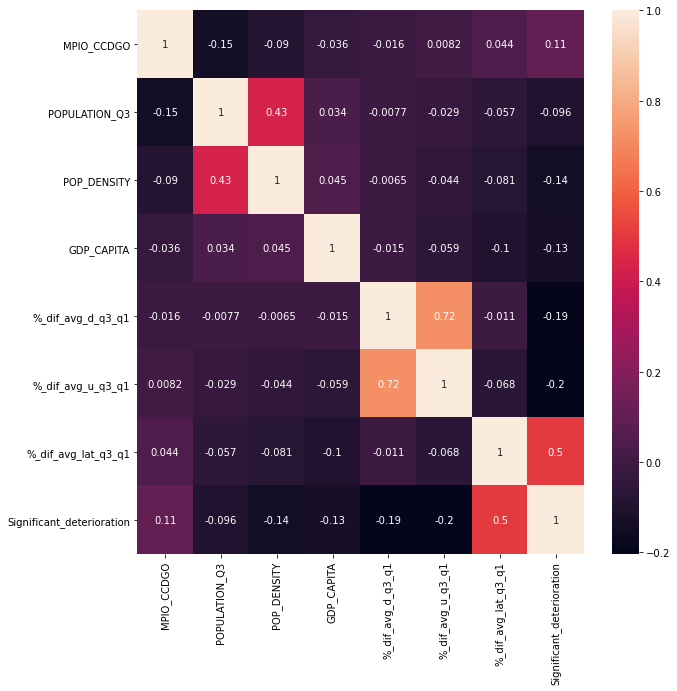

In [4]:
plt.figure(figsize=(10,10))
sns.heatmap(fixed_analysis_no_geo_dev[features_general].corr(),annot=True)
plt.plot()

[]

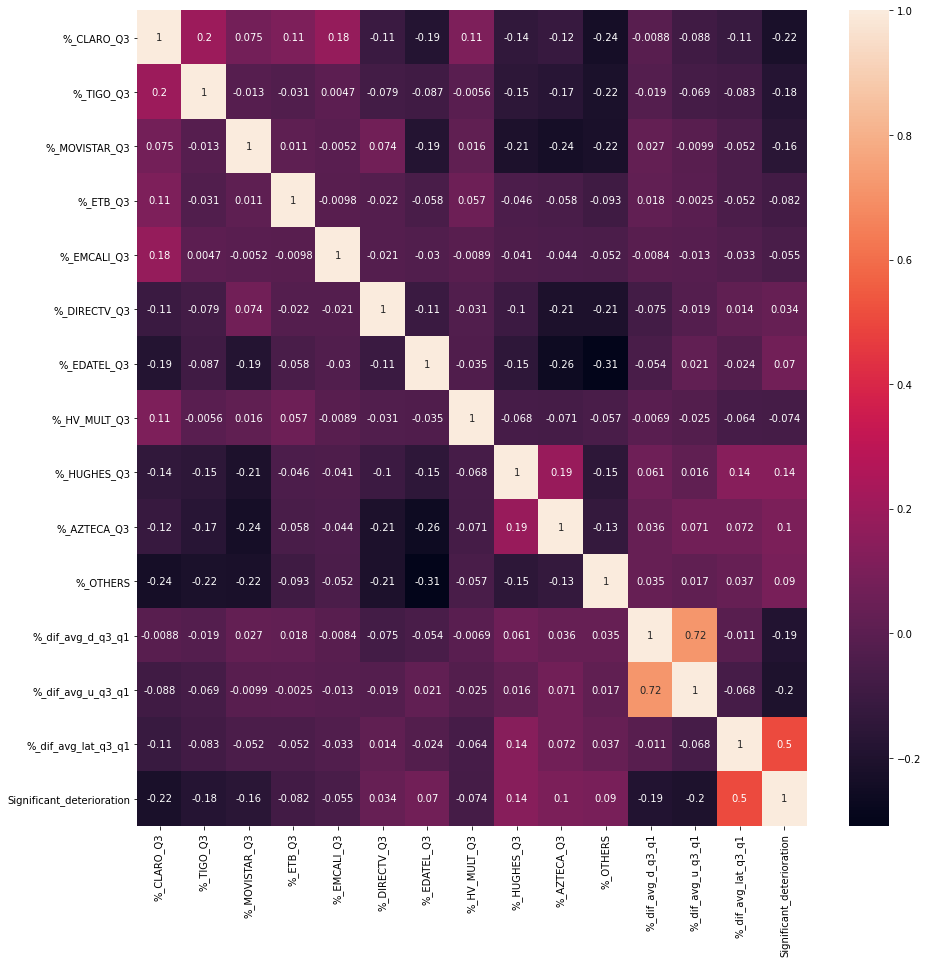

In [5]:
plt.figure(figsize=(15,15))
sns.heatmap(fixed_analysis_no_geo_dev[features_vendor].corr(),annot=True)
plt.plot()

[]

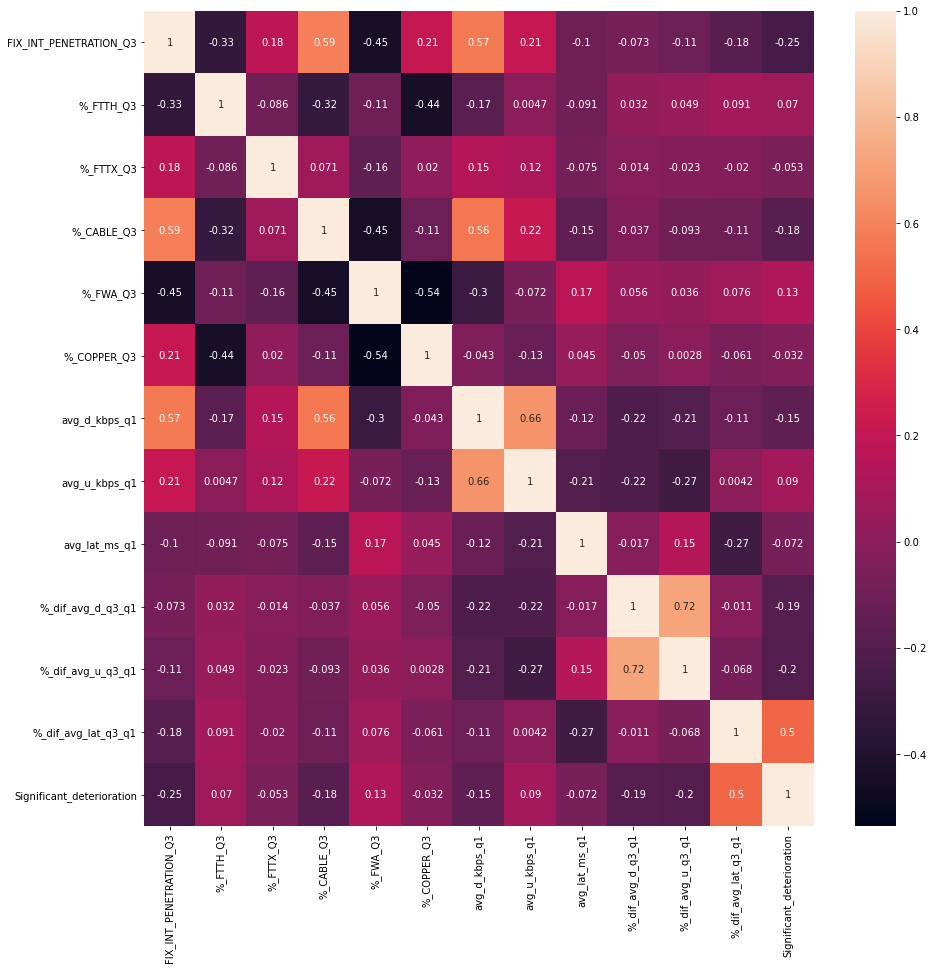

In [6]:
plt.figure(figsize=(15,15))
sns.heatmap(fixed_analysis_no_geo_dev[features_tech].corr(),annot=True)
plt.plot()

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


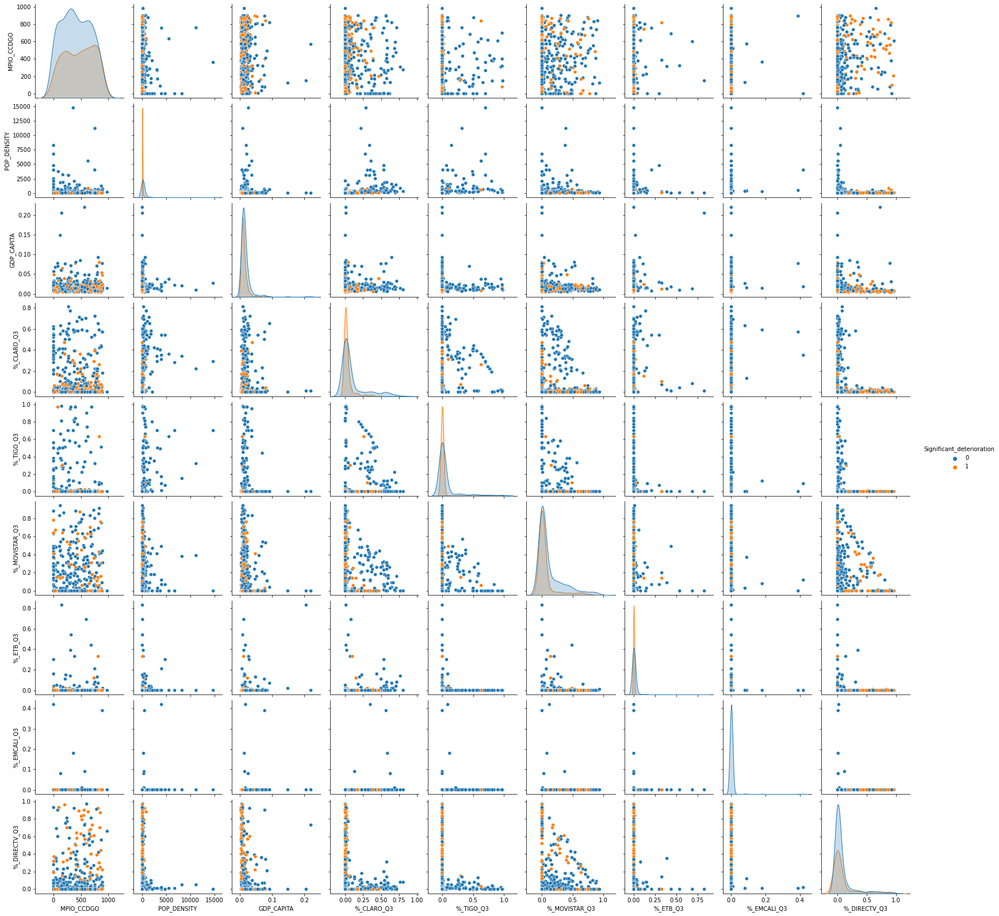

In [3]:
features_general_vendor1 = ['MPIO_CCDGO', 'POP_DENSITY', 'GDP_CAPITA', '%_CLARO_Q3', '%_TIGO_Q3', '%_MOVISTAR_Q3', '%_ETB_Q3', '%_EMCALI_Q3', '%_DIRECTV_Q3','Significant_deterioration']
features_general_vendor2 = ['MPIO_CCDGO', 'POP_DENSITY', 'GDP_CAPITA','%_EDATEL_Q3', '%_HV_MULT_Q3', '%_HUGHES_Q3', '%_AZTECA_Q3', '%_OTHERS','Significant_deterioration']
sns.pairplot(fixed_analysis_no_geo_dev[features_general_vendor1], hue = 'Significant_deterioration')

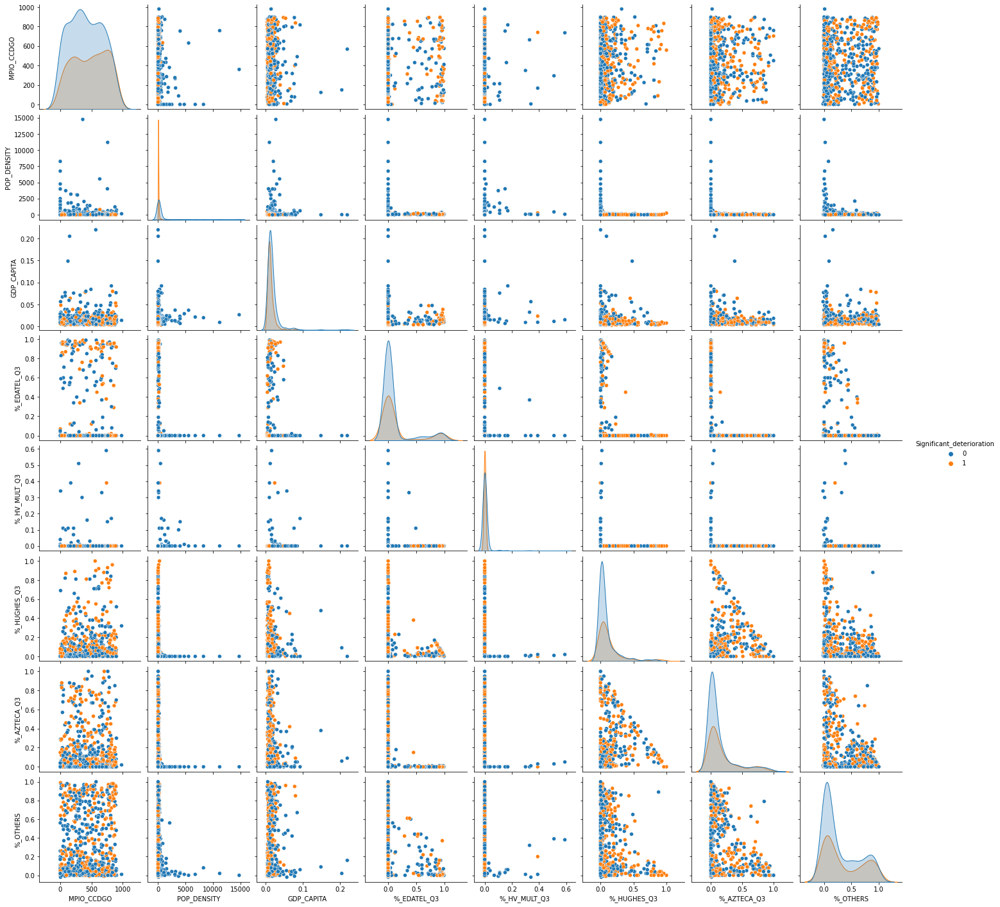

In [4]:
sns.pairplot(fixed_analysis_no_geo_dev[features_general_vendor2], hue = 'Significant_deterioration')

In [ ]:
features_tech_vendor1 = ['FIX_INT_PENETRATION_Q3', '%_FTTH_Q3', '%_FTTX_Q3', '%_CABLE_Q3', '%_FWA_Q3', '%_COPPER_Q3','%_CLARO_Q3', '%_TIGO_Q3', '%_MOVISTAR_Q3', '%_ETB_Q3', '%_EMCALI_Q3', '%_DIRECTV_Q3','Significant_deterioration']
features_tech_vendor2 = ['FIX_INT_PENETRATION_Q3', '%_FTTH_Q3', '%_FTTX_Q3', '%_CABLE_Q3', '%_FWA_Q3', '%_COPPER_Q3', '%_EDATEL_Q3', '%_HV_MULT_Q3', '%_HUGHES_Q3', '%_AZTECA_Q3', '%_OTHERS','Significant_deterioration']
sns.set(font_scale=1)
sns.pairplot(fixed_analysis_no_geo_dev[features_tech_vendor], hue = 'Significant_deterioration')

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


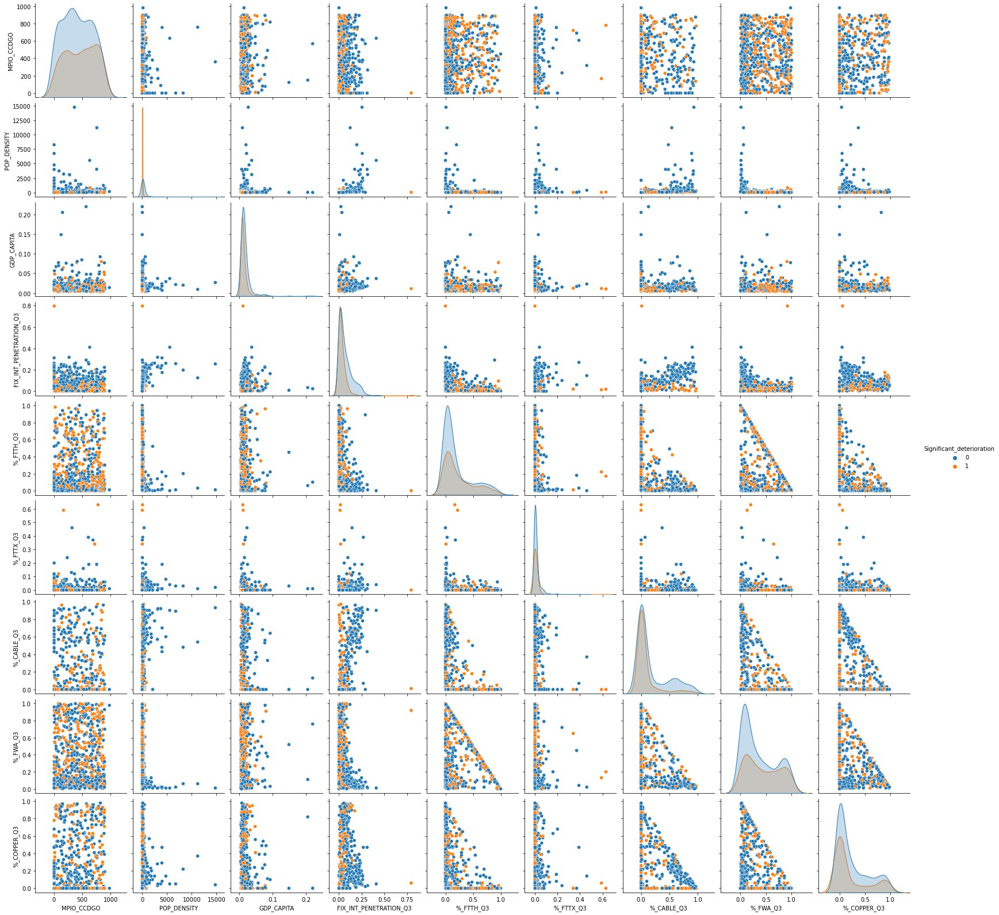

In [39]:
features_general_tech = ['MPIO_CCDGO', 'POP_DENSITY', 'GDP_CAPITA', 'FIX_INT_PENETRATION_Q3',  '%_FTTH_Q3', '%_FTTX_Q3', '%_CABLE_Q3', '%_FWA_Q3', '%_COPPER_Q3', 'Significant_deterioration']
features_general_vendor1 = ['MPIO_CCDGO', 'POP_DENSITY', 'GDP_CAPITA', '%_CLARO_Q3', '%_TIGO_Q3', '%_MOVISTAR_Q3', '%_ETB_Q3', '%_EMCALI_Q3', '%_DIRECTV_Q3', '%_EDATEL_Q3', '%_HV_MULT_Q3', '%_HUGHES_Q3', '%_AZTECA_Q3', '%_OTHERS','Significant_deterioration']
sns.pairplot(fixed_analysis_no_geo_dev[features_general_tech], hue = 'Significant_deterioration')


In [40]:
features_general_mob = ['MPIO_CCDGO', 'POPULATION_Q3', 'POP_DENSITY', 'GDP_CAPITA',  '%_dif_avg_d_q3_q1', '%_dif_avg_u_q3_q1', '%_dif_avg_lat_q3_q1', 'Significant_deterioration']
features_vendor_mob = ['%_M_CLARO_Q3', '%_M_TIGO_Q3', '%_M_MOVISTAR_Q3', '%_M_ETB_Q3', '%_M_AVANTEL_Q3', '%_dif_avg_d_q3_q1', '%_dif_avg_u_q3_q1', '%_dif_avg_lat_q3_q1', 'Significant_deterioration']
features_tech_mob = ['%_LTE_Q3','FIX_INT_PENETRATION_Q3', '%_FTTH_Q3', '%_FTTX_Q3', '%_CABLE_Q3', '%_FWA_Q3', '%_COPPER_Q3', 'avg_d_kbps_q1', 'avg_u_kbps_q1', 'avg_lat_ms_q1','%_dif_avg_d_q3_q1', '%_dif_avg_u_q3_q1', '%_dif_avg_lat_q3_q1', 'Significant_deterioration']
#print(mobile_analysis_no_geo_dev[features].dtypes)
print(mobile_analysis_no_geo_dev['Significant_deterioration'].value_counts())
display(mobile_analysis_no_geo_dev[features_general_mob].pivot_table(index = 'Significant_deterioration', values=features_general_mob, aggfunc='mean'))
display(mobile_analysis_no_geo_dev[features_vendor_mob].pivot_table(index = 'Significant_deterioration', values=features_vendor_mob, aggfunc='mean'))
display(mobile_analysis_no_geo_dev[features_tech_mob].pivot_table(index = 'Significant_deterioration', values=features_tech_mob, aggfunc='mean'))


0    296
1    205
Name: Significant_deterioration, dtype: int64


,%_dif_avg_d_q3_q1,%_dif_avg_lat_q3_q1,%_dif_avg_u_q3_q1,GDP_CAPITA,MPIO_CCDGO,POPULATION_Q3,POP_DENSITY
Significant_deterioration,,,,,,,
0,0.39914,-0.120162,0.298513,0.018444,408.726351,121569.513514,462.188379
1,-0.08301,0.106421,-0.162726,0.015597,451.087805,38740.800000,130.905366


,%_M_AVANTEL_Q3,%_M_CLARO_Q3,%_M_ETB_Q3,%_M_MOVISTAR_Q3,%_M_TIGO_Q3,%_dif_avg_d_q3_q1,%_dif_avg_lat_q3_q1,%_dif_avg_u_q3_q1
Significant_deterioration,,,,,,,,
0,0.065135,0.489189,0.105372,0.261115,0.185270,0.39914,-0.120162,0.298513
1,0.050976,0.498585,0.091171,0.267610,0.194927,-0.08301,0.106421,-0.162726


,%_CABLE_Q3,%_COPPER_Q3,%_FTTH_Q3,%_FTTX_Q3,%_FWA_Q3,%_LTE_Q3,%_dif_avg_d_q3_q1,%_dif_avg_lat_q3_q1,%_dif_avg_u_q3_q1,FIX_INT_PENETRATION_Q3,avg_d_kbps_q1,avg_lat_ms_q1,avg_u_kbps_q1
Significant_deterioration,,,,,,,,,,,,,
0,0.251723,0.276622,0.146047,0.018750,0.306351,0.674899,0.39914,-0.120162,0.298513,0.086059,13488.511721,61.481295,7749.995235
1,0.137659,0.252537,0.175512,0.013268,0.420537,0.607951,-0.08301,0.106421,-0.162726,0.048217,15460.370041,59.063777,9031.823051


[]

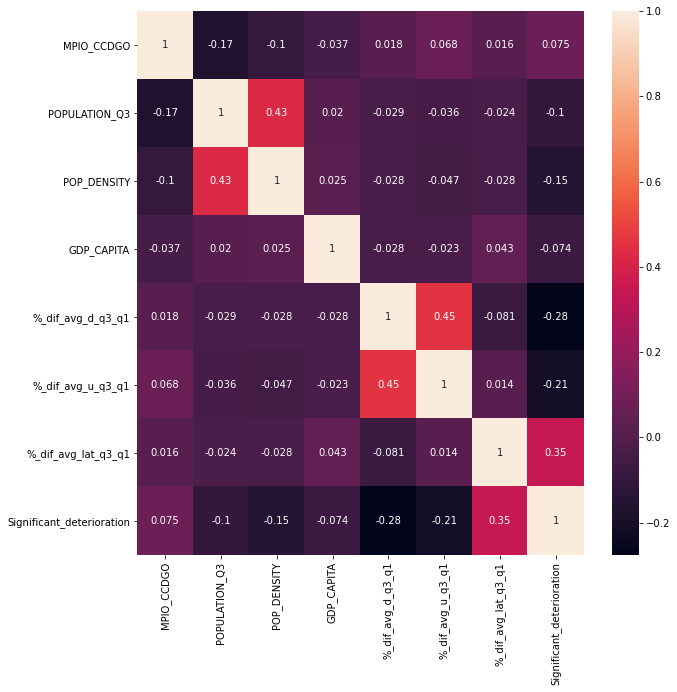

In [41]:
plt.figure(figsize=(10,10))
sns.heatmap(mobile_analysis_no_geo_dev[features_general_mob].corr(),annot=True)
plt.plot()

[]

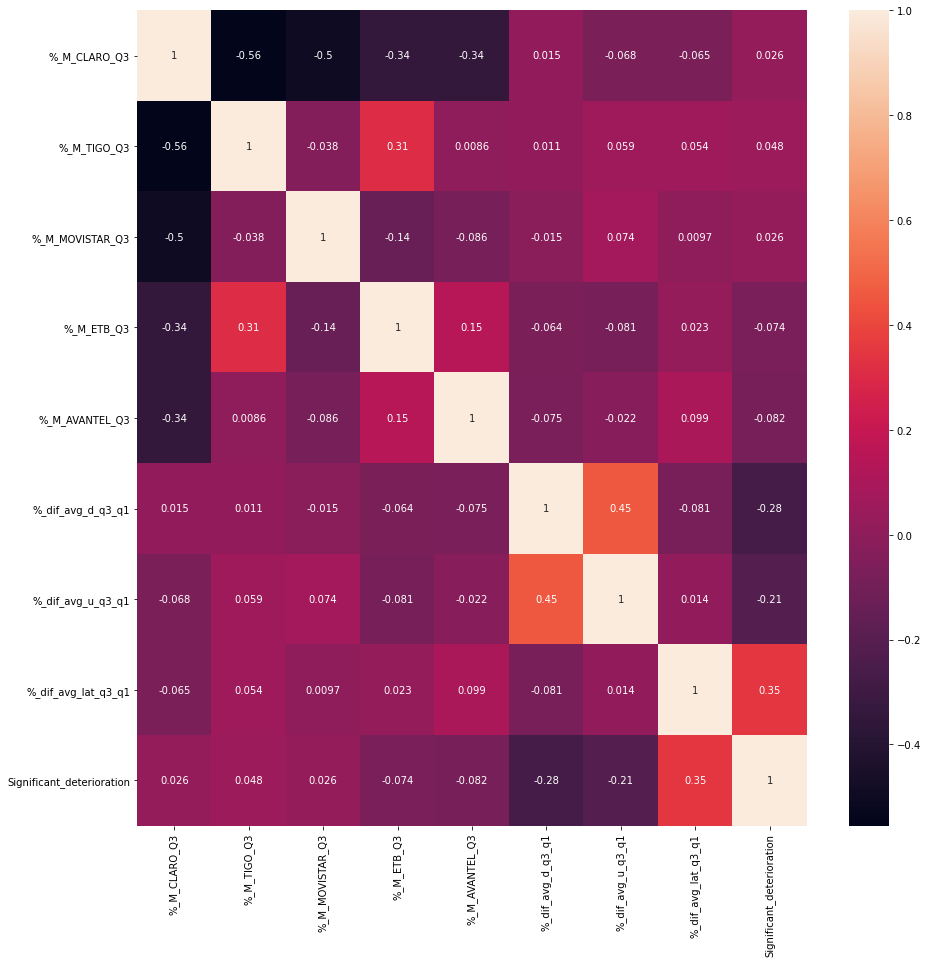

In [42]:
plt.figure(figsize=(15,15))
sns.heatmap(mobile_analysis_no_geo_dev[features_vendor_mob].corr(),annot=True)
plt.plot()

[]

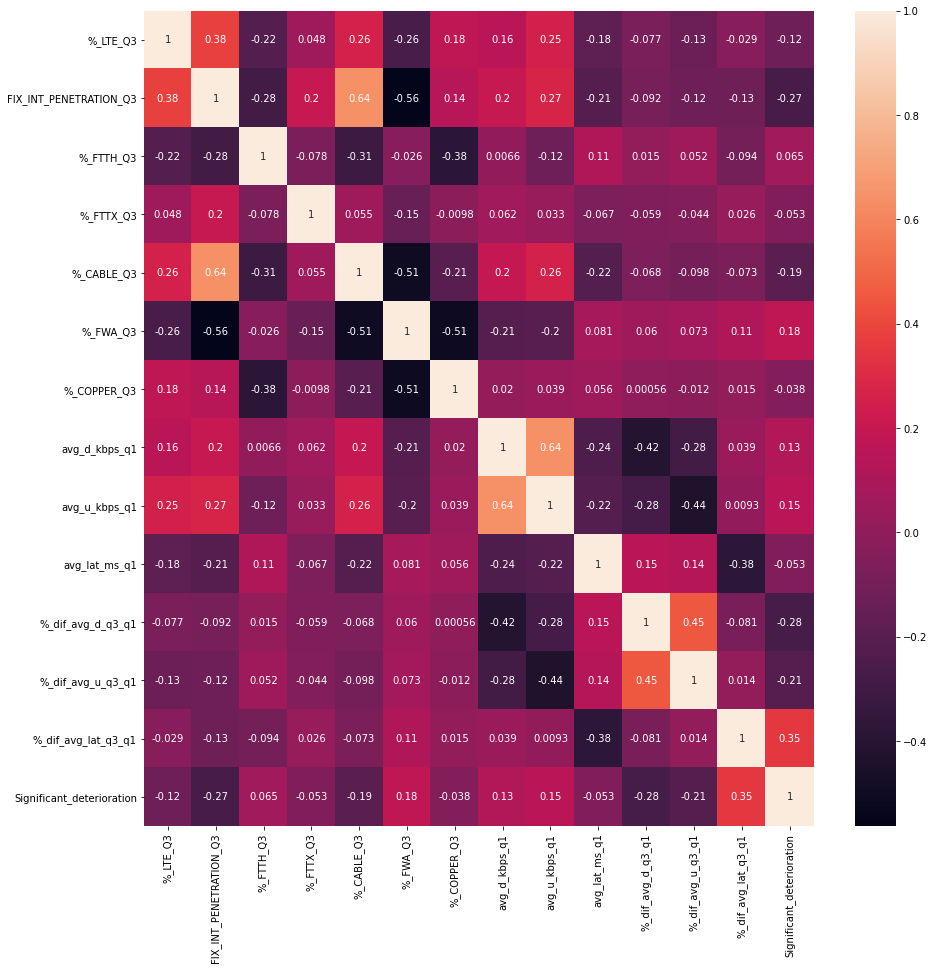

In [43]:
plt.figure(figsize=(15,15))
sns.heatmap(mobile_analysis_no_geo_dev[features_tech_mob].corr(),annot=True)
plt.plot()

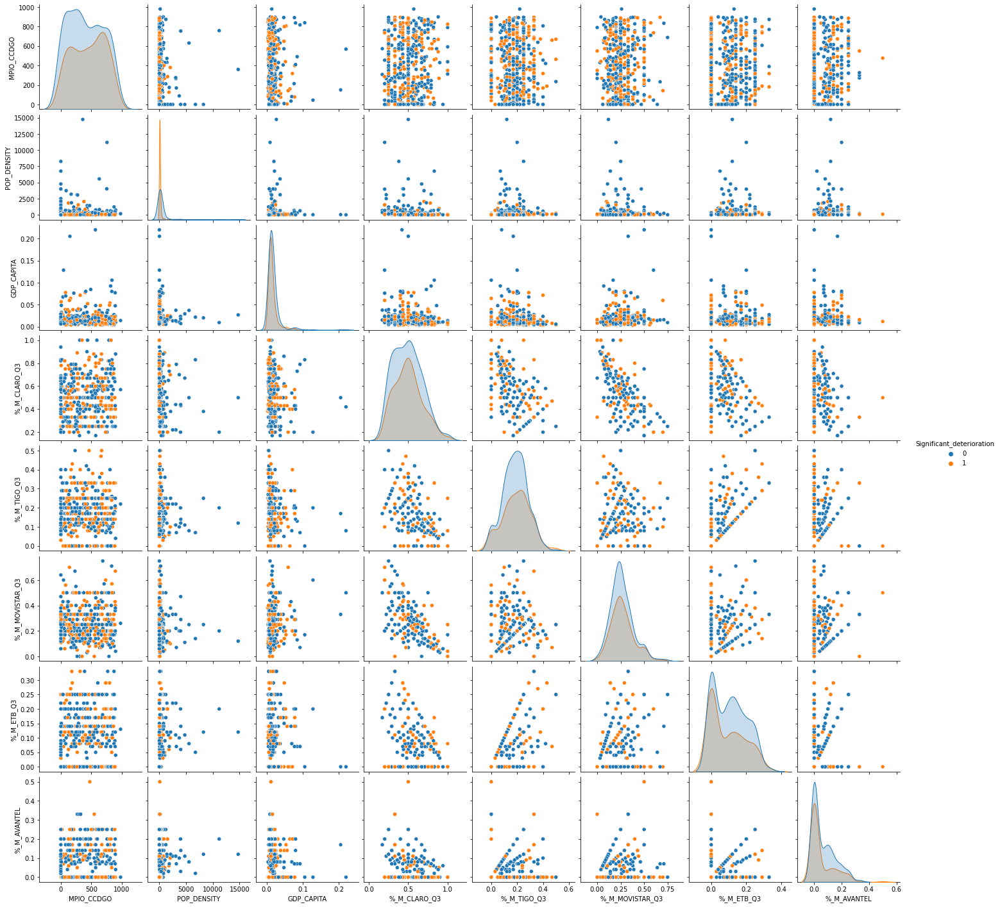

In [44]:
features_general_vendor = ['MPIO_CCDGO', 'POP_DENSITY', 'GDP_CAPITA', '%_M_CLARO_Q3', '%_M_TIGO_Q3', '%_M_MOVISTAR_Q3', '%_M_ETB_Q3', '%_M_AVANTEL','Significant_deterioration']
sns.pairplot(mobile_analysis_no_geo_dev[features_general_vendor], hue = 'Significant_deterioration')
sns.set(font_scale=1.5)

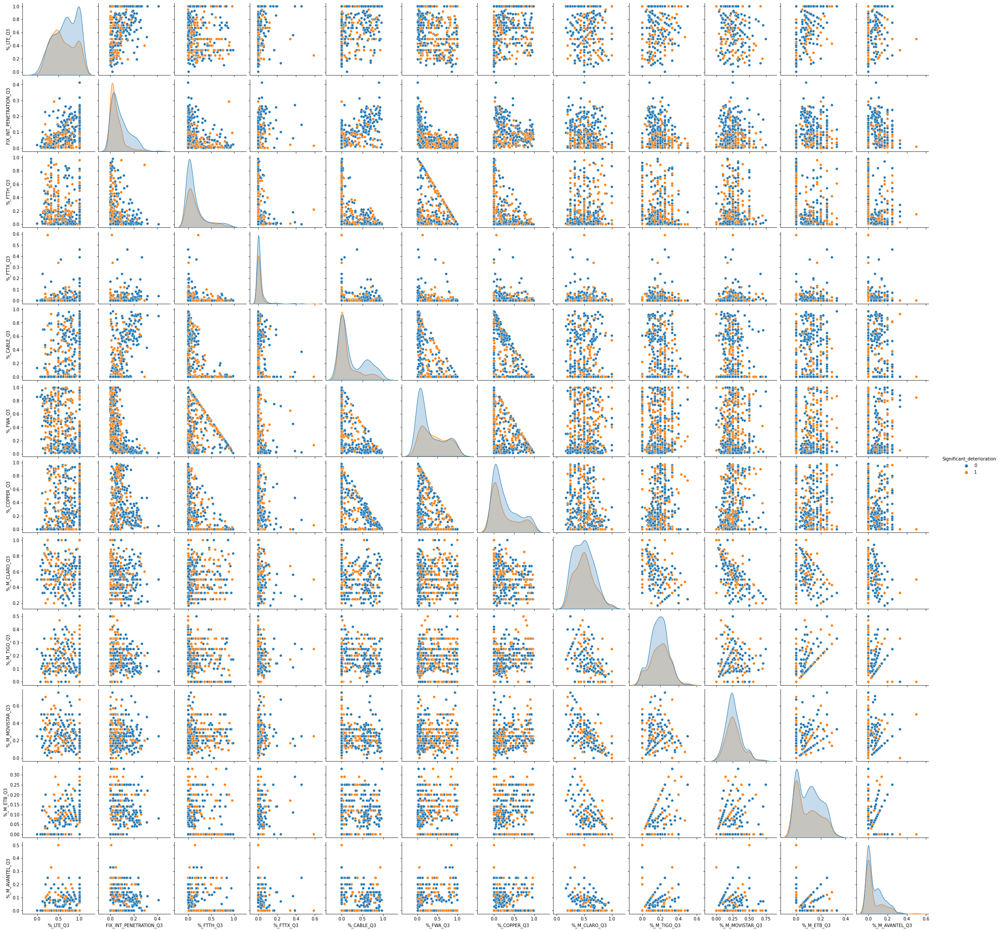

In [26]:
features_tech_vendor_mob = ['%_LTE_Q3','FIX_INT_PENETRATION_Q3', '%_FTTH_Q3', '%_FTTX_Q3', '%_CABLE_Q3', '%_FWA_Q3', '%_COPPER_Q3','%_M_CLARO_Q3', '%_M_TIGO_Q3', '%_M_MOVISTAR_Q3', '%_M_ETB_Q3', '%_M_AVANTEL_Q3','Significant_deterioration']
sns.pairplot(mobile_analysis_no_geo_dev[features_tech_vendor_mob], hue = 'Significant_deterioration')
sns.set(font_scale=2)

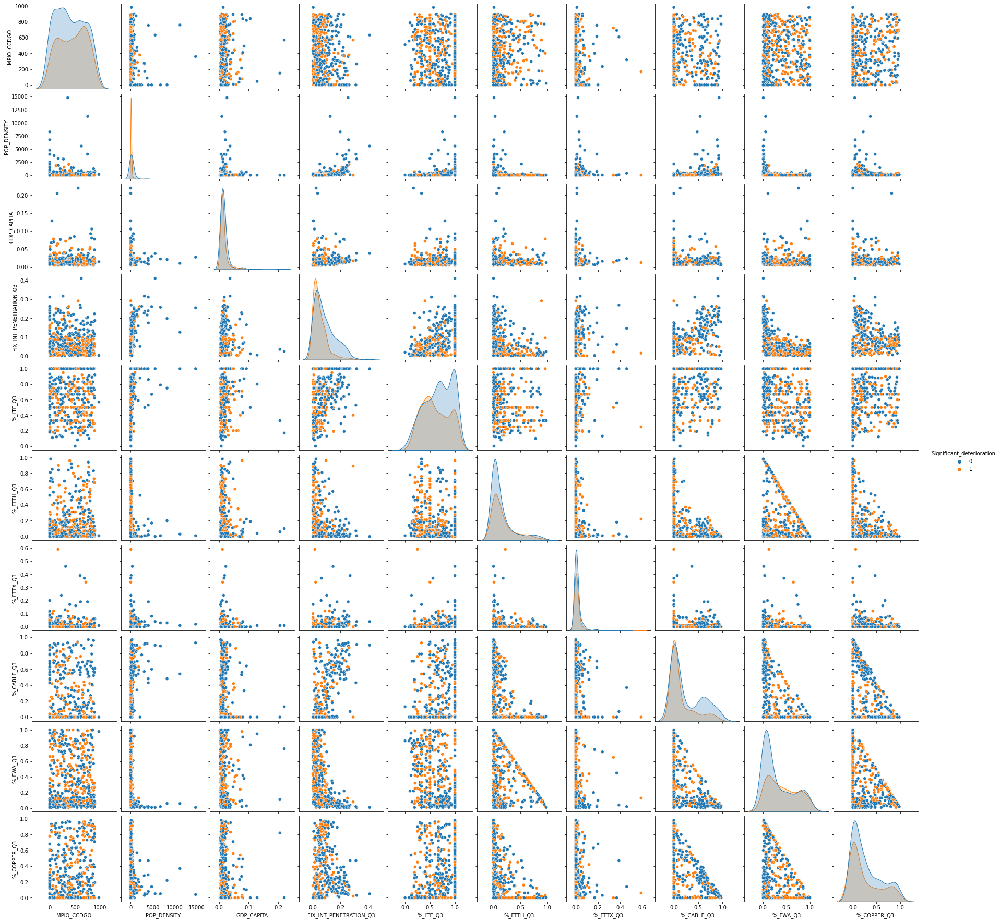

In [27]:
features_general_tech_mob = ['MPIO_CCDGO', 'POP_DENSITY', 'GDP_CAPITA', 'FIX_INT_PENETRATION_Q3', '%_LTE_Q3',  '%_FTTH_Q3', '%_FTTX_Q3', '%_CABLE_Q3', '%_FWA_Q3', '%_COPPER_Q3', 'Significant_deterioration']
sns.pairplot(mobile_analysis_no_geo_dev[features_general_tech_mob], hue = 'Significant_deterioration')
sns.set(font_scale=2)

In [41]:
fixed_analysis_no_geo_dev.to_csv("gs://imperial_analytics_project/backup/fixed_analysis_no_geo_dev.csv")
mobile_analysis_no_geo_dev.to_csv("gs://imperial_analytics_project/backup/mobile_analysis_no_geo_dev.csv")